In [343]:
import pandas as pd
import numpy as np
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import font_manager, rc
import scipy.cluster.hierarchy as spc
font_name = font_manager.FontProperties(fname="/usr/share/fonts/nanum/nanumGothic.ttf").get_name()
plt.rc('font', family=font_name)
import warnings
warnings.filterwarnings(action='ignore') 
pd.options.display.float_format = '{:.2f}'.format

In [121]:
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [51]:
#data = pd.read_excel('data/alram_ds.xls',sheet_name=None, encoding='UTF-8')
#df_list = [ v for k,v in data.items()] 
#data = pd.concat(df_list ,axis=0)

## 1. 알람 데이터 로드 및 전처리

In [52]:
data = pd.read_csv('data/alaram.csv', encoding='UTF-8',index_col=0)

In [53]:
#행렬 확인
data.shape

(400000, 17)

In [54]:
#불필요 컬럼 제거
cols = ['처리.현황', '담당자', '처리.이력', '확인.시간', '유지보수.상태']
data.drop(columns=cols,axis=1,inplace=True)

In [55]:
#컬럼 이름 수정
data.columns = ['degree', 'alarm_name','time','clear_time','last_time','group_path','system_name','hostname','ip','resource_name','full_path','condition']

In [56]:
#추가 컬럼 생성
data['time'] = pd.to_datetime(data['time'], format='%Y-%m-%d %H:%M:%S')
data['clear_time'] = pd.to_datetime(data['clear_time'], format='%Y-%m-%d %H:%M:%S')
data['last_time'] = data['clear_time'] - data['time']
data['last_time'] = data['last_time'].dt.seconds
data['last_time'] = data['last_time'].fillna(0)
data['time_month'] = data['time'].dt.month
data['time_day'] = data['time'].dt.day
data['time_hour'] = data['time'].dt.hour
data['time_date']= data['time'].dt.strftime('%Y-%m-%d')
data['time_date_hour']= data['time'].dt.strftime('%Y-%m-%d %H')
full_group = data['group_path'].str.split('>', expand=True)
data['group1'] = full_group[0]
data['group2'] = full_group[1]
data['group3'] = full_group[2]
data['group4'] = full_group[3]
ipaddr = data['ip'].str.split('.', expand=True)
ipaddr[3] = "0"
data['C_class']= ipaddr[0] + '.' + ipaddr[1] + '.' + ipaddr[2] + '.' + ipaddr[3]
ipaddr[3] = "0"
ipaddr[2] = "0"
data['B_class']= ipaddr[0] + '.' + ipaddr[1] + '.' + ipaddr[2] + '.' + ipaddr[3]

In [57]:
#데이터 확인
data.head()

,degree,alarm_name,time,clear_time,last_time,group_path,system_name,hostname,ip,resource_name,...,time_day,time_hour,time_date,time_date_hour,group1,group2,group3,group4,C_class,B_class
1,심각,디스크 Top I/O 처리율,2018-08-14 10:22:25,NaT,0.0,흥국화재>보안,HFPRIVACY,NaN,10.110.51.40,디스크,...,14,10,2018-08-14,2018-08-14 10,흥국화재,보안,None,None,10.110.51.0,10.110.0.0
2,경고,인터페이스 사용률,2018-08-14 10:22:23,NaT,0.0,흥국화재>서버>신정보계,hfwpcdc1,NaN,10.110.9.40,InterConnect,...,14,10,2018-08-14,2018-08-14 10,흥국화재,서버,신정보계,None,10.110.9.0,10.110.0.0
3,심각,JVM Heap 사용률,2018-08-14 10:22:16,NaT,0.0,흥국생명>미들웨어,hlldonline,NaN,10.60.101.131,online_S101,...,14,10,2018-08-14,2018-08-14 10,흥국생명,미들웨어,None,None,10.60.101.0,10.60.0.0
4,심각,디스크 Top I/O 처리율,2018-08-14 10:22:08,NaT,0.0,흥국화재>콜시스템,HFCC-TREC196,NaN,10.11.17.196,디스크,...,14,10,2018-08-14,2018-08-14 10,흥국화재,콜시스템,None,None,10.11.17.0,10.11.0.0
5,심각,디스크 Top I/O 처리율,2018-08-14 10:22:06,NaT,0.0,흥국생명>보안,hk-pcsec01,NaN,10.10.51.111,디스크,...,14,10,2018-08-14,2018-08-14 10,흥국생명,보안,None,None,10.10.51.0,10.10.0.0


## 2. 데이터 분석

### 노드 별 심각도 건수

In [58]:
df = data.groupby(['system_name','degree'])['alarm_name'].count().reindex().reset_index()
alram_count = df.pivot_table(values='alarm_name', index=df.system_name, columns='degree', aggfunc='first',fill_value=0).reset_index()
alram_count['total_count'] = alram_count['경고'] + alram_count['주의'] + alram_count['심각']
alram_count.sort_values('total_count',ascending=False).head()

degree,system_name,경고,심각,주의,total_count
1688,tmgray,5318,25,4867,10210
1322,hlldumsap,50,5699,2334,8083
1318,hlldonline,5051,3014,4,8069
1371,hllvapstt3,3,3519,2349,5871
467,HLYDP_INT_BB_A,1416,1286,2890,5592


### 등급별 건수

,degree,count,per
0,경고,145725,36.43
1,심각,149372,37.34
2,주의,104903,26.23


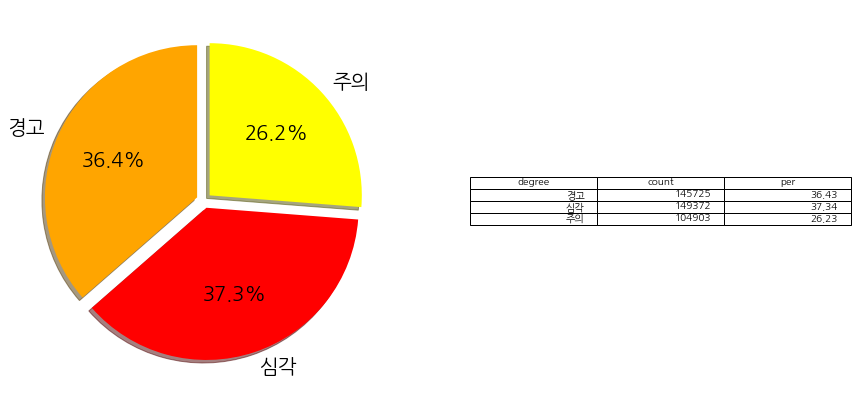

In [356]:
df = data.groupby(['degree'])['alarm_name'].count().reindex().reset_index()
df['per'] = (df.alarm_name/df.alarm_name.sum())*100
df['per']= df['per'].round(2)
df.columns = ['degree', 'count' , 'per']
fig = plt.figure(figsize=(15, 7))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)
ax2.axis('off')
ax2.axis('tight')
ax1.pie(df.per, explode=[0.05,0.05,0.05],labels=df.degree, autopct='%1.1f%%',colors=['orange','red','yellow'],textprops={'fontsize': 20},
       shadow=True, startangle=90)
ax2.table(cellText=df.values, colLabels=df.columns, loc='center')
df

### 일별 등급 알람건수

In [256]:
df = data.groupby(['time_date','degree'])['alarm_name'].count().reindex().reset_index()
df = df[df['degree'] == '심각']
df.sort_values('alarm_name',ascending=False).head()

,time_date,degree,alarm_name
22,2018-07-24,심각,7267
25,2018-07-25,심각,6559
10,2018-07-20,심각,6515
13,2018-07-21,심각,6345
82,2018-08-13,심각,6244


In [357]:
df = data.groupby(['time_date','degree'])['alarm_name'].count().reindex().reset_index()
df = df[df['degree'] == '주의']
df.sort_values('alarm_name',ascending=False).head()

,time_date,degree,alarm_name
23,2018-07-24,주의,5330
26,2018-07-25,주의,4724
11,2018-07-20,주의,4505
29,2018-07-26,주의,4336
20,2018-07-23,주의,4328


In [360]:
df = data.groupby(['time_date','degree'])['alarm_name'].count().reindex().reset_index()
df = df[df['degree'] == '경고']
df.sort_values('alarm_name',ascending=False).head()

,time_date,degree,alarm_name
30,2018-07-27,경고,6628
24,2018-07-25,경고,6442
21,2018-07-24,경고,6367
27,2018-07-26,경고,5983
42,2018-07-31,경고,5819


### 노드별 발생 알람이름 건수

In [363]:
df = data.groupby(['system_name','alarm_name'])['time'].count().reindex().reset_index()
df = df.pivot_table(values='time', index=df.system_name, columns='alarm_name', aggfunc='first',fill_value=0).reset_index()
df = df.set_index('system_name')
#df.reindex(columns='시스템명')
df['total_count']= df.sum(axis=1)
df.sort_values('total_count',ascending=False).head()

alarm_name,AP서버와 시간 차이,CPU 대기중 프로세스,CPU 사용률,CRC 오류 패킷,Collision 패킷,Data 파일 사용률,ErrorLog 발생,Fan 상태,ICMP 상태,ICMP 응답시간,...,트래픽 사용률 Tx,파일시스템 사용률_90,파일시스템 사용률_93,파일시스템 사용률_95,파일시스템 사용률_97,파일시스템 사용률_99,페이지파일 사용률,포트 다운,현재 온도,total_count
system_name,,,,,,,,,,,,,,,,,,,,,
tmgray,0,10179,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,10210
hlldumsap,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,8083
hlldonline,0,0,0,0,0,0,0,0,0,0,...,0,2,0,0,0,0,0,0,0,8069
hllvapstt3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,5871
HLYDP_INT_BB_A,0,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,0,0,1,5589,5592


In [555]:
df = data.groupby(['system_name'])['time'].count().reindex().reset_index().sort_values('time')
df[df['time'] == 1]

,system_name,time
1812,평촌 고객케어 TM VPN A,1
959,bnldns02,1
943,bcweb02,1
942,bcweb01,1
918,YDev,1
916,YD5F_C2960PoE5,1
914,YD5F_C2960PoE3,1
903,WEB_Server_L4_Backup,1
838,TK_Ulan_SPD2factory_C2960,1
833,TK_Ulan_Oil1_OSBL_C2960,1


### 

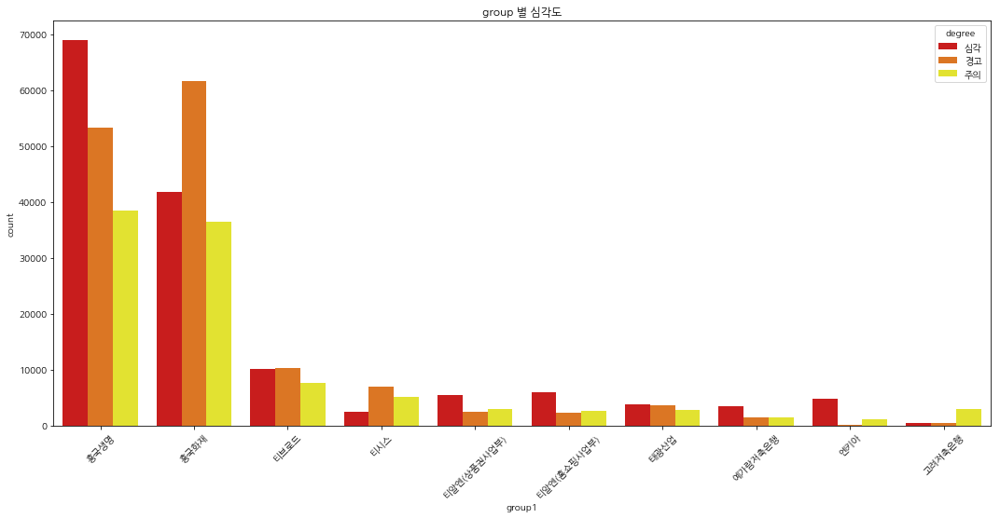

,group1,degree,count
47,흥국생명,심각,69037
55,흥국화재,심각,41887
27,티브로드,심각,10227
41,티알엔(홈쇼핑사업부),심각,6018
38,티알엔(상품권사업부),심각,5559
14,엔키아,심각,4898
24,태광산업,심각,3847
17,예가람저축은행,심각,3507
30,티시스,심각,2471
4,고려저축은행,심각,513


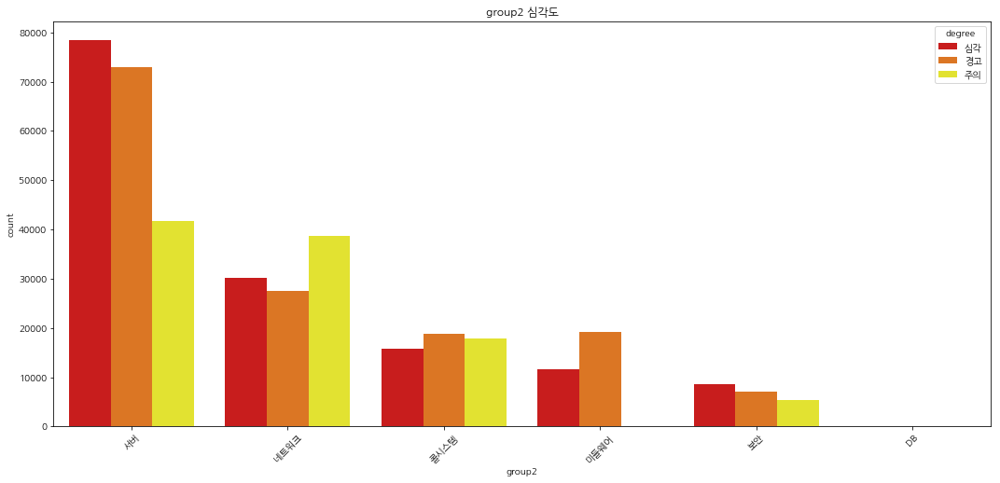

,group2,degree,count
12,서버,심각,78387
4,네트워크,심각,30156
15,콜시스템,심각,15780
7,미들웨어,심각,11579
9,보안,심각,8545
1,DB,심각,27
,group2,degree,count
11,서버,경고,73003
3,네트워크,경고,27584
6,미들웨어,경고,19129


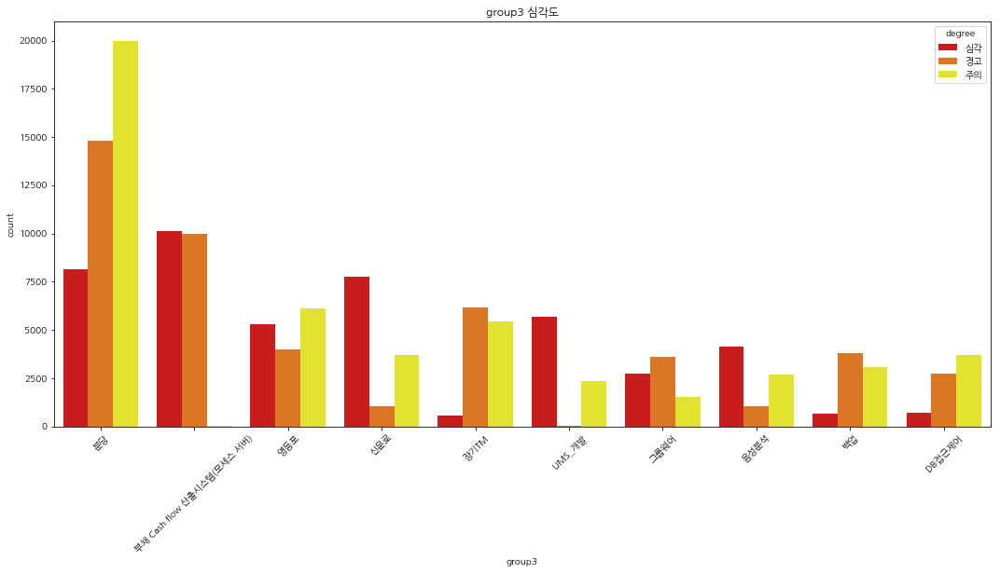

,group3,degree,count
340,부채 Cash flow 산출시스템(모세스 서버),심각,10119
345,분당,심각,8166
397,신문로,심각,7773
490,인증시스템,심각,5835
155,UMS_개발,심각,5699
547,콜센터DR,심각,5552
423,영등포,심각,5283
73,I-Prime,심각,4714
451,음성분석,심각,4156
286,모바일,심각,3320


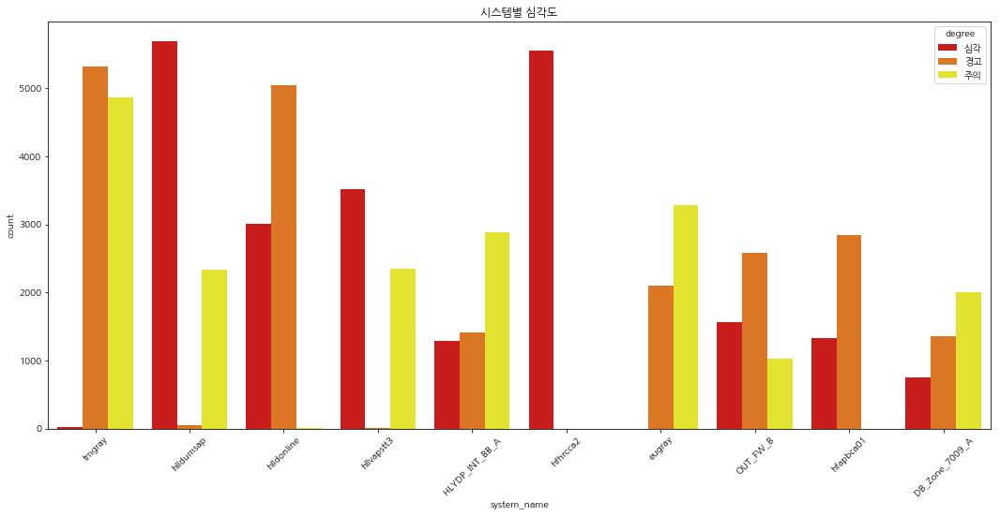

,system_name,degree,count
2603,hlldumsap,심각,5699
2009,hfhrcca2,심각,5552
2700,hllvapstt3,심각,3519
2596,hlldonline,심각,3014
2648,hllplinkdb02,심각,2953
2647,hllplinkdb01,심각,2882
3544,yggwmail,심각,2080
2533,hkuaps01,심각,1892
1756,bnlaudit,심각,1880
847,HLYDP_DWG_L3_B,심각,1828


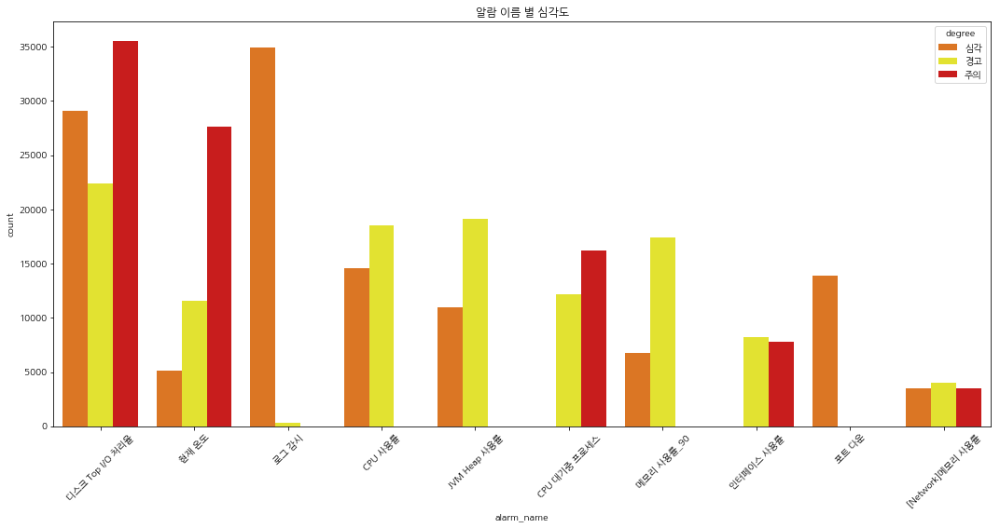

,alarm_name,degree,count
58,로그 감시,심각,34897
55,디스크 Top I/O 처리율,심각,29092
4,CPU 사용률,심각,14553
107,포트 다운,심각,13865
20,JVM Heap 사용률,심각,10992
63,메모리 사용률_90,심각,6747
109,현재 온도,심각,5167
27,WebURL 감시,심각,4887
45,[Network]메모리 사용률,심각,3501
67,메모리 사용률_95,심각,3280


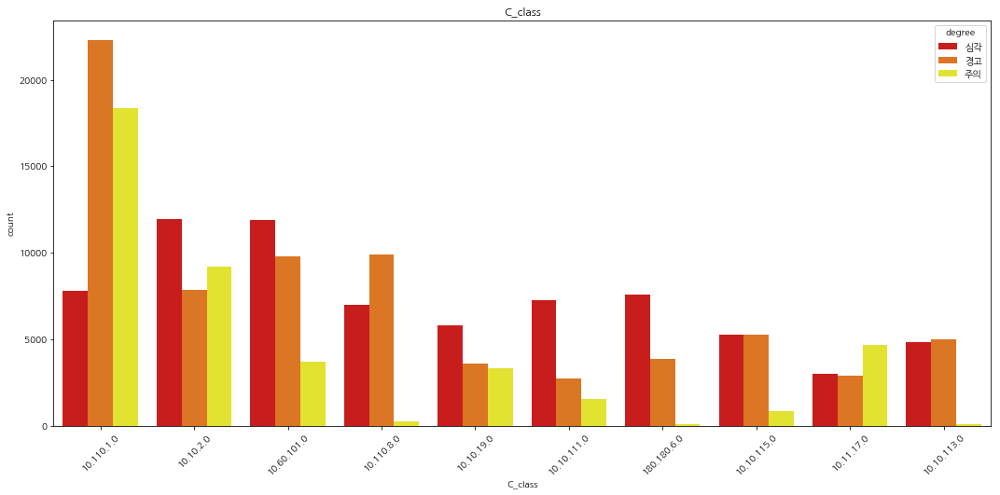

,C_class,degree,count
48,10.10.2.0,심각,11959
276,10.60.101.0,심각,11892
126,10.110.1.0,심각,7791
700,180.180.6.0,심각,7593
24,10.10.111.0,심각,7257
156,10.110.8.0,심각,6979
13,10.10.106.0,심각,6248
45,10.10.19.0,심각,5782
30,10.10.115.0,심각,5289
27,10.10.113.0,심각,4842


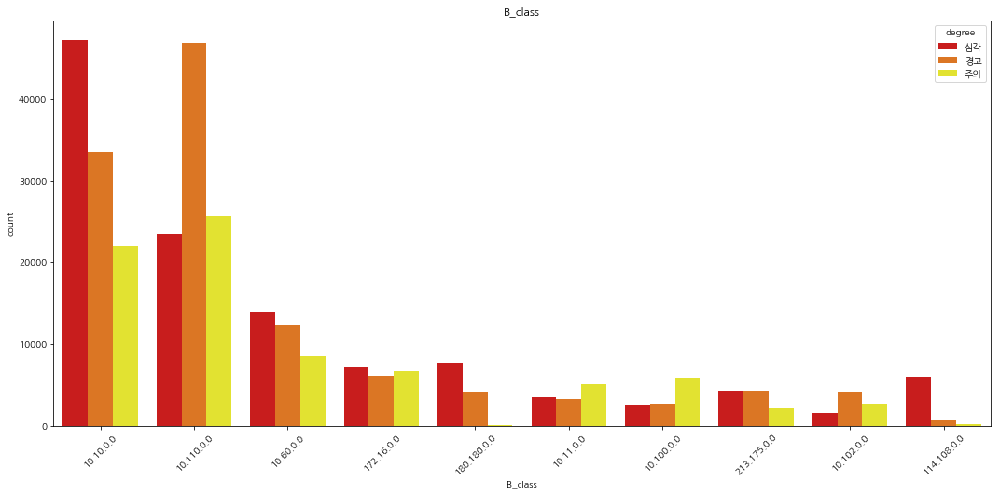

,B_class,degree,count
10,10.10.0.0,심각,47236
26,10.110.0.0,심각,23418
55,10.60.0.0,심각,13901
170,180.180.0.0,심각,7770
122,172.16.0.0,심각,7102
86,114.108.0.0,심각,6003
49,10.50.0.0,심각,5158
201,213.175.0.0,심각,4333
23,10.11.0.0,심각,3454
146,172.27.0.0,심각,3218


In [548]:
rotation = 45

colors = ['red','orange','yellow']
f,ax=plt.subplots(1,1,figsize=(18,8))
sns.countplot('group1',hue='degree',data=data,order=data.group1.value_counts().iloc[:10].index, palette=sns.xkcd_palette(colors))
ax.set_title('group 별 심각도')
plt.xticks(rotation=rotation)
plt.show()
df = data.groupby(['group1','degree'])['time'].count().reindex().reset_index().sort_values('time',ascending=False)
df.columns = ['group1','degree','count']
df_1 = df[df['degree'] == '심각'].head(10)
df_2 = df[df['degree'] == '경고'].head(10)
df_3 = df[df['degree'] == '주의'].head(10)
display_side_by_side(df_1,df_2,df_3)

colors = ['red','orange','yellow']
f,ax=plt.subplots(1,1,figsize=(18,8))
sns.countplot('group2',hue='degree',data=data,order=data.group2.value_counts().iloc[:10].index, palette=sns.xkcd_palette(colors))
ax.set_title('group2 심각도')
plt.xticks(rotation=rotation)
plt.show()
df = data.groupby(['group2','degree'])['time'].count().reindex().reset_index().sort_values('time',ascending=False)
df.columns = ['group2','degree','count']
df_1 = df[df['degree'] == '심각'].head(10)
df_2 = df[df['degree'] == '경고'].head(10)
df_3 = df[df['degree'] == '주의'].head(10)
display_side_by_side(df_1,df_2,df_3)

colors = ['red','orange','yellow']
f,ax=plt.subplots(1,1,figsize=(18,8))
sns.countplot('group3',hue='degree',data=data,order=data.group3.value_counts().iloc[:10].index, palette=sns.xkcd_palette(colors))
ax.set_title('group3 심각도')
plt.xticks(rotation=rotation)
plt.tick_params(axis='both', which='minor', labelsize=0.2)
plt.show()
df = data.groupby(['group3','degree'])['time'].count().reindex().reset_index().sort_values('time',ascending=False)
df.columns = ['group3','degree','count']
df_1 = df[df['degree'] == '심각'].head(10)
df_2 = df[df['degree'] == '경고'].head(10)
df_3 = df[df['degree'] == '주의'].head(10)
display_side_by_side(df_1,df_2,df_3)

colors = ['red','orange','yellow']
f,ax=plt.subplots(1,1,figsize=(18,8))
sns.countplot('system_name',hue='degree',data=data,order=data.system_name.value_counts().iloc[:10].index, palette=sns.xkcd_palette(colors))
ax.set_title('시스템별 심각도')
plt.xticks(rotation=rotation)
plt.tick_params(axis='both', which='minor', labelsize=0.2)
plt.show()
df = data.groupby(['system_name','degree'])['time'].count().reindex().reset_index().sort_values('time',ascending=False)
df.columns = ['system_name','degree','count']
df_1 = df[df['degree'] == '심각'].head(10)
df_2 = df[df['degree'] == '경고'].head(10)
df_3 = df[df['degree'] == '주의'].head(10)
display_side_by_side(df_1,df_2,df_3)

colors = ['orange','yellow','red']
f,ax=plt.subplots(1,1,figsize=(18,8))
sns.countplot('alarm_name',hue='degree',data=data,order=data.alarm_name.value_counts().iloc[:10].index, palette=sns.xkcd_palette(colors))
ax.set_title('알람 이름 별 심각도')
plt.xticks(rotation=rotation)
plt.tick_params(axis='both', which='minor', labelsize=0.2)
plt.show()
df = data.groupby(['alarm_name','degree'])['time'].count().reindex().reset_index().sort_values('time',ascending=False)
df.columns = ['alarm_name','degree','count']
df_1 = df[df['degree'] == '심각'].head(10)
df_2 = df[df['degree'] == '경고'].head(10)
df_3 = df[df['degree'] == '주의'].head(10)
display_side_by_side(df_1,df_2,df_3)


colors = ['red','orange','yellow']
f,ax=plt.subplots(1,1,figsize=(18,8))
sns.countplot('C_class',hue='degree',data=data,order=data.C_class.value_counts().iloc[:10].index, palette=sns.xkcd_palette(colors))
ax.set_title('C_class')
plt.xticks(rotation=rotation)
plt.tick_params(axis='both', which='minor', labelsize=0.2)
plt.show()
df = data.groupby(['C_class','degree'])['time'].count().reindex().reset_index().sort_values('time',ascending=False)
df.columns = ['C_class','degree','count']
df_1 = df[df['degree'] == '심각'].head(10)
df_2 = df[df['degree'] == '경고'].head(10)
df_3 = df[df['degree'] == '주의'].head(10)
display_side_by_side(df_1,df_2,df_3)


colors = ['red','orange','yellow']
f,ax=plt.subplots(1,1,figsize=(18,8))
sns.countplot('B_class',hue='degree',data=data,order=data.B_class.value_counts().iloc[:10].index, palette=sns.xkcd_palette(colors))
ax.set_title('B_class')
plt.xticks(rotation=rotation)
plt.tick_params(axis='both', which='minor', labelsize=0.2)
plt.show()
df = data.groupby(['B_class','degree'])['time'].count().reindex().reset_index().sort_values('time',ascending=False)
df.columns = ['B_class','degree','count']
df_1 = df[df['degree'] == '심각'].head(10)
df_2 = df[df['degree'] == '경고'].head(10)
df_3 = df[df['degree'] == '주의'].head(10)
display_side_by_side(df_1,df_2,df_3)

### 3. time_date(특정일) time_hour(시간) time_weekday(요일) time_day(일) time_week(주) 별 알람 건수

In [61]:
df = data.groupby(['system_name','time_date'])['time'].count().reindex().reset_index()
df.columns =['system_name', 'time_date', 'total_count']
df = df.pivot_table(values='total_count', index=df['time_date'], columns=df['system_name'], aggfunc='first',fill_value=0)
df['total_count'] = df.sum(axis=1)
df = df.sort_values('total_count',ascending=False)

df_hour = data.groupby(['time_hour','degree'])['time'].count().reindex().reset_index()
df_hour.columns = ['time_hour', 'degree' , 'total_count']

data['time_weekday'] = data['time'].dt.weekday
df_weekday = data.groupby(['time_weekday','degree'])['time'].count().reindex().reset_index()
df_weekday.columns = ['time_weekday', 'degree' , 'total_count']

df_days = data.groupby(['time_day','degree'])['time'].count().reindex().reset_index()
df_days.columns = ['time_day', 'degree' , 'total_count']

data['time_week'] = data['time'].dt.week
df_week = data.groupby(['time_week','degree'])['time'].count().reindex().reset_index()
df_week.columns = ['time_week', 'degree' , 'total_count']

In [62]:
df = data.groupby(['time_date','degree'])['time'].count().reindex().reset_index()
df.columns = ['time_date', 'degree' , 'total_count']
display_side_by_side(df[df.degree.str.match('심각')==True].sort_values('total_count', ascending=False).head(),
        df[df.degree.str.match('주의')==True].sort_values('total_count', ascending=False).head(),
        df[df.degree.str.match('경고')==True].sort_values('total_count', ascending=False).head())

,time_date,degree,total_count
22,2018-07-24,심각,7267
25,2018-07-25,심각,6559
10,2018-07-20,심각,6515
13,2018-07-21,심각,6345
82,2018-08-13,심각,6244
,time_date,degree,total_count
23,2018-07-24,주의,5330
26,2018-07-25,주의,4724
11,2018-07-20,주의,4505
29,2018-07-26,주의,4336


In [63]:
display_side_by_side(df_hour[df_hour.degree.str.match('심각')==True].sort_values('total_count', ascending=False).head(),
df_hour[df_hour.degree.str.match('주의')==True].sort_values('total_count', ascending=False).head(),
df_hour[df_hour.degree.str.match('경고')==True].sort_values('total_count', ascending=False).head())

,time_hour,degree,total_count
55,18,심각,8826
52,17,심각,7526
43,14,심각,7474
46,15,심각,7384
31,10,심각,7374
,time_hour,degree,total_count
47,15,주의,5634
50,16,주의,5630
44,14,주의,5619
53,17,주의,5502


In [64]:
display_side_by_side(df_days[df_days.degree.str.match('심각')==True].sort_values('total_count', ascending=False).head(),
df_days[df_days.degree.str.match('주의')==True].sort_values('total_count', ascending=False).head(),
df_days[df_days.degree.str.match('경고')==True].sort_values('total_count', ascending=False).head())

,time_day,degree,total_count
64,24,심각,7267
67,25,심각,6559
52,20,심각,6515
55,21,심각,6345
37,13,심각,6244
,time_day,degree,total_count
65,24,주의,5330
68,25,주의,4724
53,20,주의,4505
71,26,주의,4336


In [65]:
display_side_by_side(df_weekday[df_weekday.degree.str.match('심각')==True].sort_values('total_count', ascending=False).head(),
df_weekday[df_weekday.degree.str.match('주의')==True].sort_values('total_count', ascending=False).head(),
df_weekday[df_weekday.degree.str.match('경고')==True].sort_values('total_count', ascending=False).head())


,time_weekday,degree,total_count
4,1,심각,23577
13,4,심각,23045
7,2,심각,22877
1,0,심각,22858
10,3,심각,22152
,time_weekday,degree,total_count
5,1,주의,16767
11,3,주의,16285
14,4,주의,16127
8,2,주의,15832


In [66]:
display_side_by_side(df_week[df_week.degree.str.match('심각')==True].sort_values('total_count', ascending=False).head(),
df_week[df_week.degree.str.match('주의')==True].sort_values('total_count', ascending=False).head(),
df_week[df_week.degree.str.match('경고')==True].sort_values('total_count', ascending=False).head())


,time_week,degree,total_count
4,30,심각,39950
10,32,심각,35081
1,29,심각,33471
7,31,심각,32477
13,33,심각,8393
,time_week,degree,total_count
5,30,주의,28107
11,32,주의,24526
8,31,주의,24246
2,29,주의,22896


Text(0.5, 1.0, '주별 알람 추이')

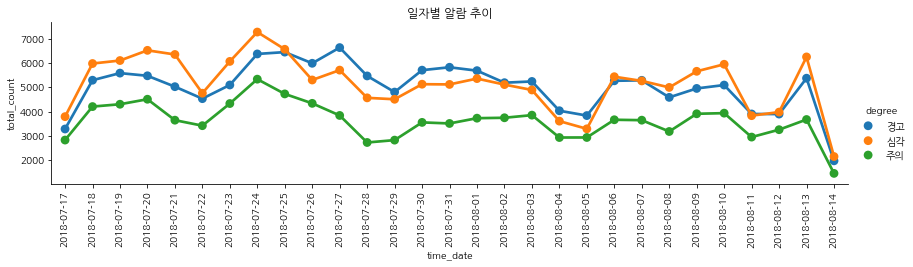

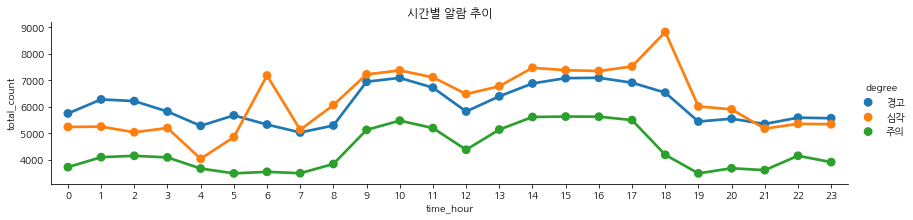

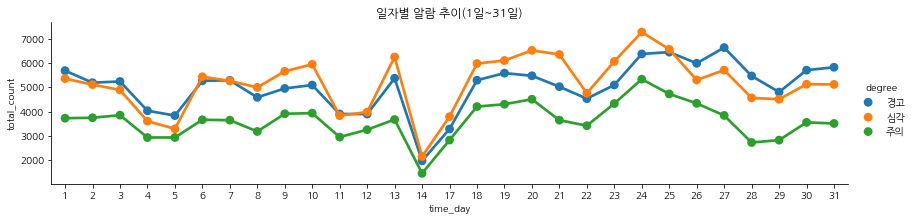

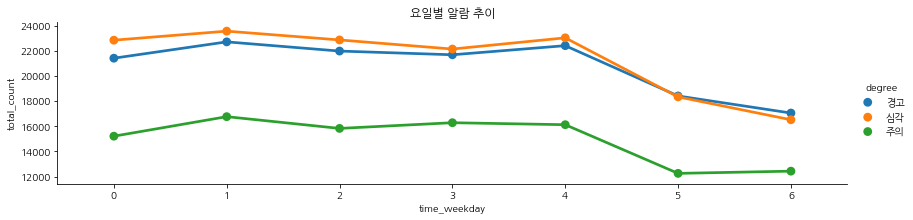

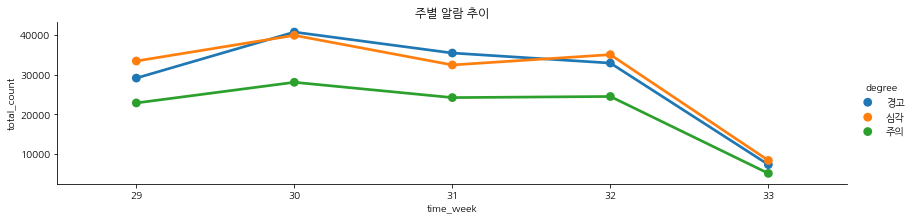

In [538]:
sns.factorplot(data=df, x="time_date", y="total_count",hue='degree',legend_out=True, size=3, aspect=4)
plt.xticks(rotation='vertical')
plt.title('일자별 알람 추이')

sns.factorplot(data=df_hour, x="time_hour", y="total_count",hue='degree',legend_out=True, size=3, aspect=4)
plt.title('시간별 알람 추이')

sns.factorplot(data=df_days, x="time_day", y="total_count",hue='degree',legend_out=True, size=3, aspect=4)
plt.title('일자별 알람 추이(1일~31일)')
sns.factorplot(data=df_weekday, x="time_weekday", y="total_count",hue='degree',legend_out=True, size=3, aspect=4)
plt.title('요일별 알람 추이')
sns.factorplot(data=df_week, x="time_week", y="total_count",hue='degree',legend_out=True, size=3, aspect=4)
plt.title('주별 알람 추이')

### 4. 특정 일에 발생한 알람 확인을 위한 코드

In [68]:
df = data.groupby(['time_date','degree','alarm_name','system_name','condition'])['ip'].count().reindex().reset_index()
df.columns = ['time_date', 'degree' ,'alarm_name','system_name','condition', 'total_count']

display(df[df['degree'] == '심각'].sort_values('total_count', ascending=False).head(30))
display(df[df['degree'] == '경고'].sort_values('total_count', ascending=False).head(30))
display(df[df['degree'] == '주의'].sort_values('total_count', ascending=False).head(30))

,time_date,degree,alarm_name,system_name,condition,total_count
49615,2018-07-24,심각,로그 감시,hfhrcca2,"이벤트 탐지 [심각도: ERROR, 내용: hfhrcca2 vmunix: lun p...",686
23692,2018-07-20,심각,로그 감시,hfhrcca2,"이벤트 탐지 [심각도: ERROR, 내용: hfhrcca2 vmunix: lun p...",684
16399,2018-07-19,심각,로그 감시,hfhrcca2,"이벤트 탐지 [심각도: ERROR, 내용: hfhrcca2 vmunix: lun p...",684
35596,2018-07-22,심각,로그 감시,hfhrcca2,"이벤트 탐지 [심각도: ERROR, 내용: hfhrcca2 vmunix: lun p...",683
30128,2018-07-21,심각,로그 감시,hfhrcca2,"이벤트 탐지 [심각도: ERROR, 내용: hfhrcca2 vmunix: lun p...",682
41652,2018-07-23,심각,로그 감시,hfhrcca2,"이벤트 탐지 [심각도: ERROR, 내용: hfhrcca2 vmunix: lun p...",681
9226,2018-07-18,심각,로그 감시,hfhrcca2,"이벤트 탐지 [심각도: ERROR, 내용: hfhrcca2 vmunix: lun p...",680
173471,2018-08-13,심각,[APP]프로세스 다운,hfwpumsap01,"프로세스 개수 [0 (= 0, 2회 연속)]",450
30887,2018-07-21,심각,로그 상태,kctmvap02,"가용성 [DOWN (= DOWN, 2회 연속)]",430
2815,2018-07-17,심각,로그 감시,hfhrcca2,"이벤트 탐지 [심각도: ERROR, 내용: hfhrcca2 vmunix: lun p...",427


,time_date,degree,alarm_name,system_name,condition,total_count
83592,2018-07-29,경고,메모리 사용률_97,hludfias,사용률 [97 % (>= 95 %)],183
77469,2018-07-28,경고,[Network]메모리 사용률,HKYoungin_AP,"사용률 [55 % (>= 50 %, 2회 연속)]",171
88236,2018-07-30,경고,[Network]메모리 사용률,HKYoungin_AP,"사용률 [55 % (>= 50 %, 2회 연속)]",163
82899,2018-07-29,경고,[Network]메모리 사용률,HKYoungin_AP,"사용률 [55 % (>= 50 %, 2회 연속)]",157
101883,2018-08-01,경고,[Network]메모리 사용률,HKYoungin_AP,"사용률 [55 % (>= 50 %, 2회 연속)]",151
94986,2018-07-31,경고,[Network]메모리 사용률,HKYoungin_AP,"사용률 [55 % (>= 50 %, 2회 연속)]",147
70101,2018-07-27,경고,[Network]메모리 사용률,HKYoungin_AP,"사용률 [55 % (>= 50 %, 2회 연속)]",142
103145,2018-08-01,경고,메모리 사용률_97,hludfias,사용률 [97 % (>= 95 %)],139
109734,2018-08-02,경고,메모리 사용률_97,hludfias,사용률 [97 % (>= 95 %)],127
62470,2018-07-26,경고,[Network]메모리 사용률,HKYoungin_AP,"사용률 [55 % (>= 50 %, 2회 연속)]",124


,time_date,degree,alarm_name,system_name,condition,total_count
37587,2018-07-22,주의,로그 감시_2,hlldumsap,"이벤트 탐지 [심각도: INFO, 내용: hlldumsap kernel: blk_u...",288
44922,2018-07-23,주의,로그 감시_2,hlldumsap,"이벤트 탐지 [심각도: INFO, 내용: hlldumsap kernel: blk_u...",288
26558,2018-07-20,주의,로그 감시_2,hllvapstt3,"이벤트 탐지 [심각도: INFO, 내용: hllvapstt3 kernel: end_...",288
32397,2018-07-21,주의,로그 감시_2,hlldumsap,"이벤트 탐지 [심각도: INFO, 내용: hlldumsap kernel: blk_u...",288
26557,2018-07-20,주의,로그 감시_2,hlldumsap,"이벤트 탐지 [심각도: INFO, 내용: hlldumsap kernel: blk_u...",288
53034,2018-07-24,주의,로그 감시_2,hllvapstt3,"이벤트 탐지 [심각도: INFO, 내용: hllvapstt3 kernel: end_...",288
19230,2018-07-19,주의,로그 감시_2,hlldumsap,"이벤트 탐지 [심각도: INFO, 내용: hlldumsap kernel: blk_u...",288
11928,2018-07-18,주의,로그 감시_2,hlldumsap,"이벤트 탐지 [심각도: INFO, 내용: hlldumsap kernel: blk_u...",288
11929,2018-07-18,주의,로그 감시_2,hllvapstt3,"이벤트 탐지 [심각도: INFO, 내용: hllvapstt3 kernel: end_...",288
53033,2018-07-24,주의,로그 감시_2,hlldumsap,"이벤트 탐지 [심각도: INFO, 내용: hlldumsap kernel: blk_u...",288


df = data.groupby(['time_date_hour','degree'])['ip'].count().reindex().reset_index()
df.columns = ['time_date_hour', 'degree' , 'total_count']

sns.factorplot(data=df, x="time_date_hour", y="total_count",hue='degree',legend_out=True, size=20, aspect=4 ,)
plt.xticks(rotation='vertical')
plt.title('시간별 알람 추이')

display(df[df['degree'] == '심각'].sort_values('total_count', ascending=False).head())
index_time = df[df['degree'] == '심각'].sort_values('total_count', ascending=False).head().time_date
for time in index_time:
   df[(df['degree'] == '심각')&(df['time'].astype('str').isin(time))]).sort_values('total_count', ascending=False).head(10))

((df['degree'] == '심각')&(df['time'].astype('str').isin(time)))
#display(df[df['degree'] == '경고'].sort_values('total_count', ascending=False).head())
#display(df[df['degree'] == '주의'].sort_values('total_count', ascending=False).head())

In [119]:
df = data.groupby(['time','degree','alarm_name','system_name','condition'])['ip'].count().reindex().reset_index()
df.columns = ['time', 'degree' ,'alarm_name','system_name','condition', 'total_count']

display_side_by_side(df[df['degree'] == '심각'].sort_values('total_count', ascending=False).head(10))
display_side_by_side(df[df['degree'] == '경고'].sort_values('total_count', ascending=False).head(10))
display_side_by_side(df[df['degree'] == '주의'].sort_values('total_count', ascending=False).head(10))

,time,degree,alarm_name,system_name,condition,total_count
354078,2018-08-12 06:01:27,심각,[APP]프로세스 다운,hkuaps01,"프로세스 개수 [0 (<= 1, 2회 연속)]",35
344127,2018-08-11 06:01:27,심각,[APP]프로세스 다운,hkuaps01,"프로세스 개수 [0 (<= 1, 2회 연속)]",35
326188,2018-08-09 22:33:27,심각,[APP]프로세스 다운,hkuaps01,"프로세스 개수 [0 (<= 1, 2회 연속)]",35
378636,2018-08-14 06:01:27,심각,[APP]프로세스 다운,hkuaps01,"프로세스 개수 [0 (<= 1, 2회 연속)]",35
240105,2018-08-02 20:27:14,심각,[APP]프로세스 다운,hkuaps01,"프로세스 개수 [0 (<= 1, 2회 연속)]",32
329797,2018-08-10 06:01:27,심각,[APP]프로세스 다운,hkuaps01,"프로세스 개수 [0 (<= 1, 2회 연속)]",25
364482,2018-08-13 06:01:27,심각,[APP]프로세스 다운,hkuaps01,"프로세스 개수 [0 (<= 1, 2회 연속)]",24
344134,2018-08-11 06:01:27,심각,[APP]프로세스 다운,hkuaps01,"프로세스 개수 [0 (= 0, 2회 연속)]",20
259728,2018-08-04 11:20:29,심각,파일시스템 사용률_90,hllpumsap02,사용률 [95.5 % (>= 90 %)],20
326195,2018-08-09 22:33:27,심각,[APP]프로세스 다운,hkuaps01,"프로세스 개수 [0 (= 0, 2회 연속)]",20


,time,degree,alarm_name,system_name,condition,total_count
84630,2018-07-23 04:48:43,경고,파일시스템 사용률_90,hkext2,사용률 [80 % (>= 80 %)],38
54265,2018-07-20 21:04:43,경고,파일시스템 사용률_90,hkext2,사용률 [80 % (>= 80 %)],38
54261,2018-07-20 21:04:29,경고,파일시스템 사용률_90,hkext1,사용률 [80 % (>= 80 %)],38
57577,2018-07-21 02:26:29,경고,파일시스템 사용률_90,hkext1,사용률 [80 % (>= 80 %)],38
57579,2018-07-21 02:26:43,경고,파일시스템 사용률_90,hkext2,사용률 [80 % (>= 80 %)],38
84619,2018-07-23 04:46:29,경고,파일시스템 사용률_90,hkext1,사용률 [80 % (>= 80 %)],38
205454,2018-07-31 10:11:43,경고,파일시스템 사용률_90,hkext2,사용률 [80.1 % (>= 80 %)],38
205452,2018-07-31 10:11:29,경고,파일시스템 사용률_90,hkext1,사용률 [80.1 % (>= 80 %)],38
53364,2018-07-20 19:35:18,경고,[DB]프로세스 다운,hfapexd1b,"프로세스 개수 [0 (= 0, 2회 연속)]",12
65846,2018-07-21 16:37:57,경고,가상 포트 다운,Backbone_EX9208_A-RE0,"가용성 [DOWN (= DOWN, 2회 연속)]",11


,time,degree,alarm_name,system_name,condition,total_count
152380,2018-07-27 09:17:41,주의,현재 온도,DB_Zone_7009_B,"현재온도 [45 °C (>= 40 °C, 2회 연속)]",5
174293,2018-07-28 23:04:55,주의,현재 온도,HLYDP_INT_BB_A,"현재온도 [40 °C (>= 40 °C, 2회 연속)]",4
358296,2018-08-12 16:11:04,주의,현재 온도,HLYDP_INT_BB_A,"현재온도 [40 °C (>= 40 °C, 2회 연속)]",4
97269,2018-07-23 23:59:01,주의,현재 온도,GR_BD_BB,"현재온도 [40 °C (>= 40 °C, 2회 연속)]",4
326775,2018-08-09 23:28:42,주의,현재 온도,GR_BD_BB,"현재온도 [40 °C (>= 40 °C, 2회 연속)]",4
170491,2018-07-28 15:24:01,주의,현재 온도,GR_BD_BB,"현재온도 [40 °C (>= 40 °C, 2회 연속)]",4
217282,2018-08-01 06:49:01,주의,현재 온도,GR_BD_BB,"현재온도 [40 °C (>= 40 °C, 2회 연속)]",4
147512,2018-07-27 00:54:01,주의,현재 온도,GR_BD_BB,"현재온도 [40 °C (>= 40 °C, 2회 연속)]",4
99519,2018-07-24 03:39:01,주의,현재 온도,GR_BD_BB,"현재온도 [40 °C (>= 40 °C, 2회 연속)]",4
32628,2018-07-19 12:54:01,주의,현재 온도,GR_BD_BB,"현재온도 [40 °C (>= 40 °C, 2회 연속)]",4


### 5. 발생 알람 건수 분포 히스토그램

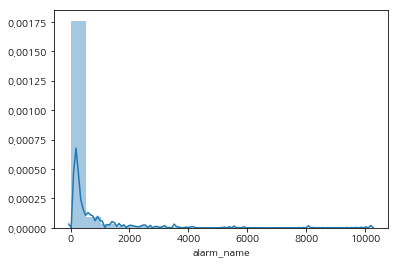

In [160]:
df = data.groupby(['system_name'])['alarm_name'].count().reindex().reset_index()
sns.distplot( df["alarm_name"], bins=20 )

In [159]:
df.sort_values('alarm_name',ascending=False)

,system_name,alarm_name
1688,tmgray,10210
1322,hlldumsap,8083
1318,hlldonline,8069
1371,hllvapstt3,5871
467,HLYDP_INT_BB_A,5592
1067,hfhrcca2,5554
981,eugray,5377
535,OUT_FW_B,5187
996,hfapbca01,4179
214,DB_Zone_7009_A,4114


### 6. 노드 단위로 발생 알람 건수를 groupby 해서 75% (3분위 수) 120건 미만으로 발생한 노드는 제외함 (Cluster Step 1)

display(df[(df['degree'] == '심각')&((df['time'] >= '2018-07-21')&(df['time'] <= '2018-07-22'))].sort_values('total_count', ascending=False).head(100))


In [91]:
data_df = data.groupby(['system_name'])['time'].count().reindex().reset_index()

In [92]:
data_df = data_df.rename(columns={'time': 'count'})

In [93]:
data_df.describe() 

,count
count,1813.000000
mean,220.462769
std,672.969740
min,1.000000
25%,3.000000
50%,20.000000
75%,120.000000
max,10210.000000


In [94]:
data_df = data_df[data_df['count'] > 120]

In [95]:
node_names = data_df.sort_values('count',ascending=False).system_name.values

In [97]:
c_nodes = data[data['system_name'].isin(node_names)==True]

In [99]:
data_df_date = c_nodes.groupby(['time_date','system_name'])['time'].count().reindex().reset_index()
data_df_date = data_df_date.pivot_table(values='time',columns='system_name',index=data_df_date['time_date'],aggfunc='first',fill_value=0)

### 7. 노드별로 1달 동안 일별로 발생한 알람 건수를 가지고 각 노드들 끼리 알람 건수에 대한 상관도 측정 (Cluster Step 2)

In [458]:
data_df_date

system_name,time_date,10F_DWDM_4200_B,11F_EX2200_PoE_1,1F_2950_2_temp,1F_EX2200_A,2950G_6F,2F_A_L2,3F_2960_B-1,3F_EX2200_A,B1F_A_L2,...,tslpemsap05,tslpemsap06,tslpemsda01,tsmobile02,tsmotpweb01,tstnmsdb01,ygdb1,ygdr1,yggwmail,엠빌_Ax80
0,2018-07-17,0,12,6,0,8,0,0,0,12,...,0,0,0,3,0,0,1,81,241,0
1,2018-07-18,0,10,5,0,23,4,0,0,23,...,0,0,0,0,0,0,9,110,150,0
2,2018-07-19,14,8,8,0,14,2,0,0,13,...,0,0,0,0,0,1,9,73,331,0
3,2018-07-20,40,6,10,0,17,0,0,0,32,...,0,0,0,4,0,1,12,81,323,0
4,2018-07-21,20,0,12,0,11,4,0,0,8,...,0,0,0,16,28,0,18,11,38,0
5,2018-07-22,35,0,3,0,9,2,0,0,4,...,0,0,0,20,23,0,3,8,1,0
6,2018-07-23,17,8,9,0,20,0,0,0,11,...,0,0,0,23,17,100,10,96,459,0
7,2018-07-24,32,6,9,18,17,0,0,10,14,...,0,0,0,0,5,252,1,93,478,0
8,2018-07-25,50,10,14,8,11,4,0,14,6,...,0,0,0,0,12,203,4,95,59,7
9,2018-07-26,38,10,9,6,17,0,0,14,26,...,0,0,0,0,12,145,7,81,0,13


for node in data_df_date.reindex(sorted(data_df_date.columns), axis=1).columns:
    print('>>>>>>>> '+node)
    fig = plt.figure(figsize=(15, 7))
    ax1 = fig.add_subplot(2, 1, 1)
    ax2 = fig.add_subplot(2, 1, 2)
    plt.subplots_adjust(top=0.5)
    ax2.axis('off')
    ax2.axis('tight')
    c_nodes = data[data['system_name']==node]
    dataset = c_nodes.groupby(['time_date','alarm_name'])['time'].count().reindex().reset_index().sort_values('time', ascending=False).head(10)
    ax2.table(cellText=dataset.values, colLabels=dataset.columns, loc='bottom')
    plt.setp(ax1.get_xticklabels(), rotation=90)
    sns.pointplot(x=data_df_date.index, y=node, data=data_df_date,ax=ax1,rotation=90)
    plt.show()
    plt.clf()

In [100]:
corrmat = data_df_date.corr()

### 8. 상관분석 결과 (Cluster Step 3)

In [101]:
corrmat

system_name,10F_DWDM_4200_B,11F_EX2200_PoE_1,1F_2950_2_temp,1F_EX2200_A,2950G_6F,2F_A_L2,3F_2960_B-1,3F_EX2200_A,B1F_A_L2,B1F_B_L2,...,tslpemsap05,tslpemsap06,tslpemsda01,tsmobile02,tsmotpweb01,tstnmsdb01,ygdb1,ygdr1,yggwmail,엠빌_Ax80
system_name,,,,,,,,,,,,,,,,,,,,,
10F_DWDM_4200_B,1.000000,0.022498,0.561247,-0.026204,0.024299,-0.146580,-0.192017,-0.000120,0.328773,-0.201728,...,-0.379507,-0.307104,-0.191779,-0.123298,-0.229353,0.694628,0.065767,0.296315,0.428994,-0.152323
11F_EX2200_PoE_1,0.022498,1.000000,0.070002,0.226095,0.493075,0.309093,-0.080155,-0.126947,-0.195907,-0.088877,...,-0.030064,0.271952,0.279095,0.301523,-0.642231,0.158053,-0.025573,0.685715,0.158419,0.506827
1F_2950_2_temp,0.561247,0.070002,1.000000,-0.217226,-0.073059,-0.039390,-0.151010,0.060766,0.339090,-0.036899,...,-0.068108,-0.256468,-0.272520,-0.208687,0.097580,0.495789,0.271857,0.208126,0.330882,-0.127767
1F_EX2200_A,-0.026204,0.226095,-0.217226,1.000000,0.203637,-0.027129,-0.067550,0.484207,-0.371374,0.006408,...,-0.112324,0.162862,0.206910,0.262637,-0.026384,0.318812,-0.371932,0.074930,-0.067918,0.164389
2950G_6F,0.024299,0.493075,-0.073059,0.203637,1.000000,0.226213,-0.120896,-0.025793,0.013583,0.192818,...,-0.250166,-0.010729,0.020621,0.005005,-0.305468,0.124457,0.250621,0.439697,0.224425,0.207505
2F_A_L2,-0.146580,0.309093,-0.039390,-0.027129,0.226213,1.000000,-0.085955,0.056084,-0.286581,0.453904,...,-0.051180,0.259680,0.000620,-0.115421,0.021751,-0.110474,0.042188,-0.051431,-0.154944,0.408796
3F_2960_B-1,-0.192017,-0.080155,-0.151010,-0.067550,-0.120896,-0.085955,1.000000,-0.044545,-0.000468,-0.215925,...,0.551271,0.140059,0.044494,-0.034881,0.014545,-0.132594,-0.014585,0.090817,-0.171682,0.476959
3F_EX2200_A,-0.000120,-0.126947,0.060766,0.484207,-0.025793,0.056084,-0.044545,1.000000,-0.280315,0.433853,...,-0.155377,-0.073182,-0.057035,-0.120920,0.432286,0.244121,-0.163444,-0.234851,-0.276707,0.077798
B1F_A_L2,0.328773,-0.195907,0.339090,-0.371374,0.013583,-0.286581,-0.000468,-0.280315,1.000000,-0.282596,...,-0.048266,-0.302550,-0.258403,-0.247176,-0.137374,0.166811,0.163104,0.311100,0.356070,-0.252309


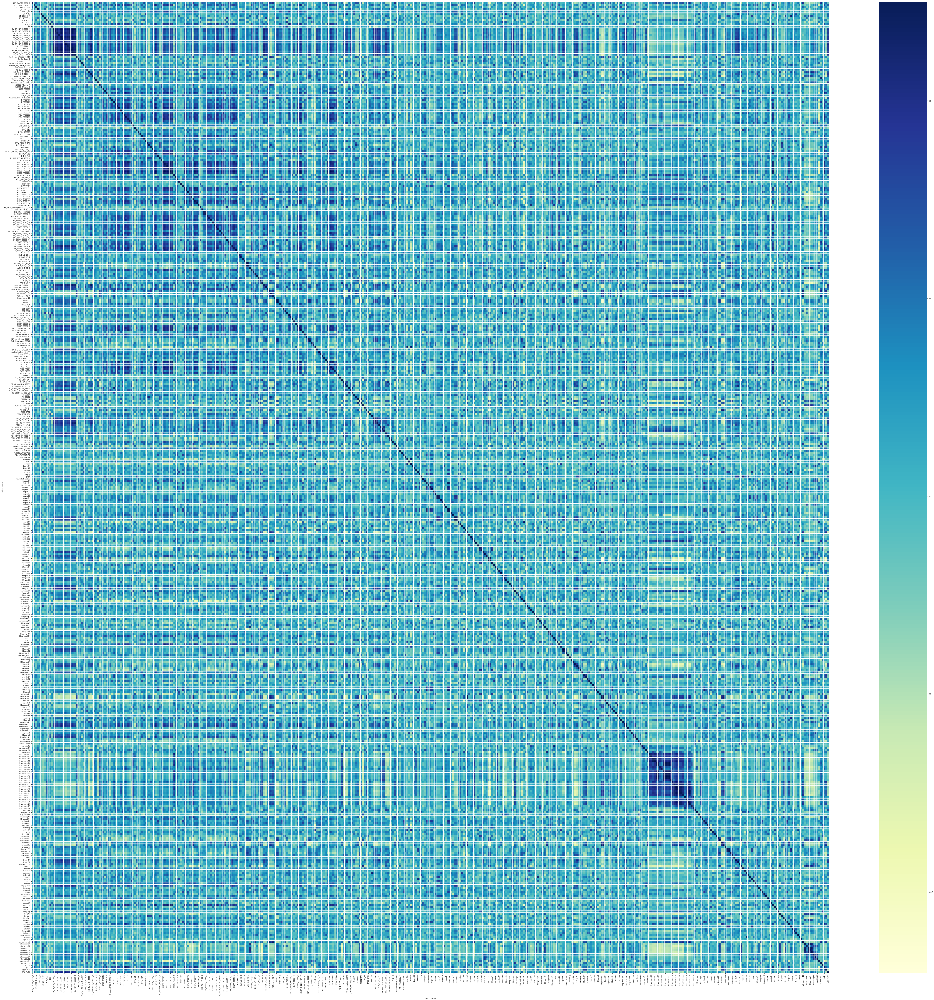

In [551]:
f, ax = plt.subplots(figsize=(100,100))
sns_plot = sns.heatmap(corrmat, ax=ax, cmap="YlGnBu", linewidths=0.1)
sns_plot.figure.savefig("output.png")

### 9. 상관분석 결과 상관도가 90% 이상인 노드들끼리 클러스터링 (Cluster Result)

In [103]:
clusters = []
for node in corrmat.columns:
    clusters.append(corrmat[corrmat[node] >= 0.9].index)
clusters_new = []
for cluster in clusters:
    if len(cluster) > 1:
        clusters_new.append(list(cluster))
clusters_new = list(set([tuple(set(node)) for node in clusters_new]))

dictt = {}
for i in range(0,len(clusters_new)):
    dictt.update({'cluster{}'.format(i) : list(clusters_new[i])})

df = pd.concat([pd.Series(clusters_new[0],name='cluster0'),pd.Series(clusters_new[1],name='cluster1')], axis=1)
for i in range(2,len(clusters_new)):
    df = pd.concat([df,pd.Series(clusters_new[i],name='cluster{}'.format(i))], axis=1)
#df.fillna('',inplace=True)

In [161]:
len(clusters_new)

55

### 10. 클러스터에 속한 각각의 노드의 한달 알람 발생 추의와 주요 알람 지표를 출력 (Visualization for Cluster Result)

######### ('HFEU-TREC234', 'HKCC-TREC231', 'HKCC-TREC236')
>>>>>>>> HFEU-TREC234


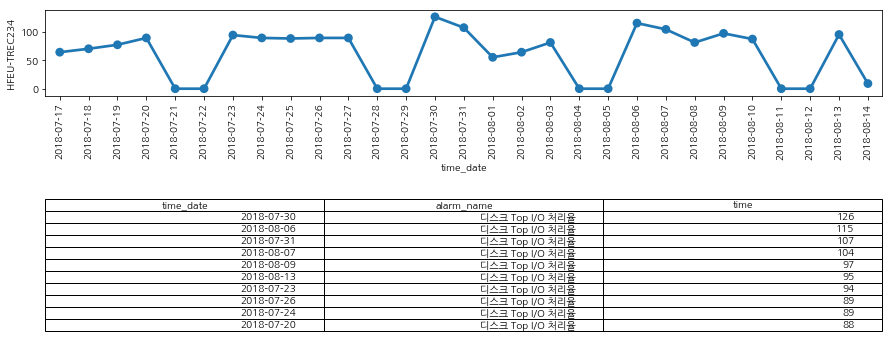

>>>>>>>> HKCC-TREC231


<Figure size 432x288 with 0 Axes>

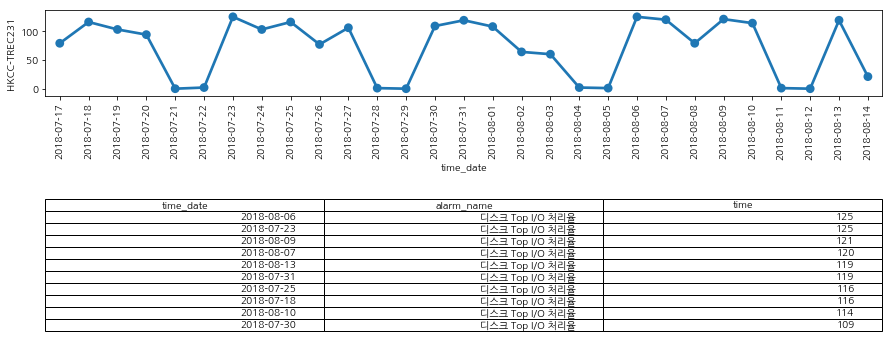

>>>>>>>> HKCC-TREC236


<Figure size 432x288 with 0 Axes>

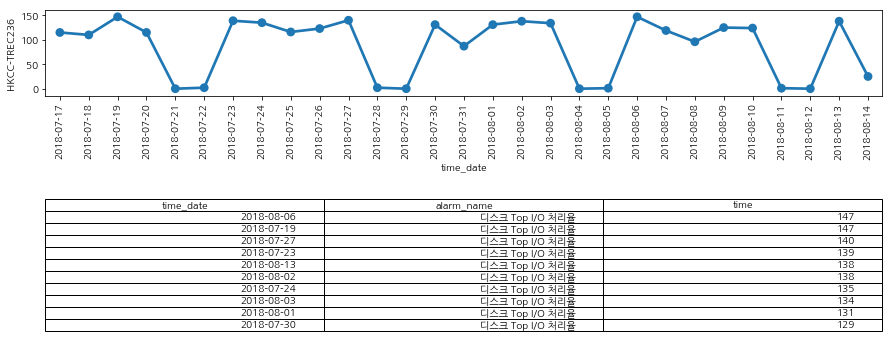

######### ('BY_INT_7F_C2960_B', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'BY_2F_INT_EX2200_1', 'BY_3F_INT_C2960_3', 'BY_6F_EX2200_1', 'BY_5F_INT_C2960_4', 'BY_2F_INT_EX2200_2')
>>>>>>>> BY_INT_7F_C2960_B


<Figure size 432x288 with 0 Axes>

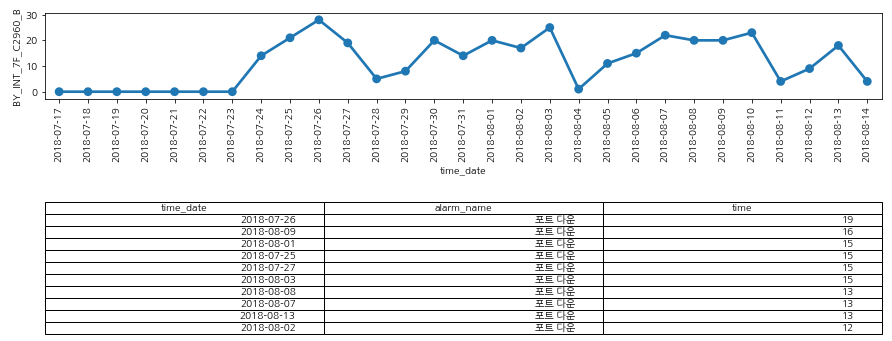

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

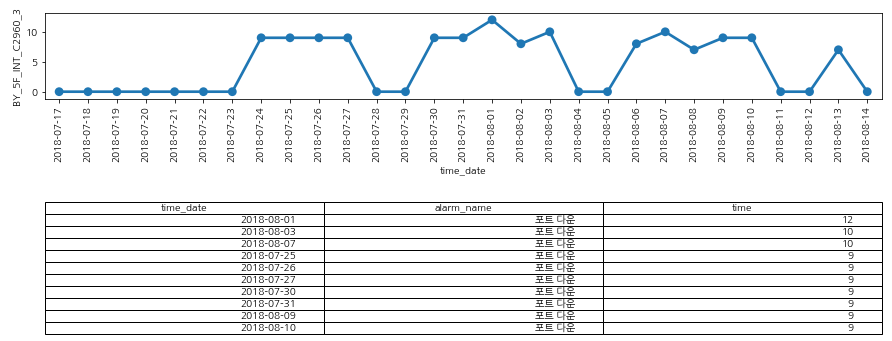

>>>>>>>> BY_INT_7F_C2960_A


<Figure size 432x288 with 0 Axes>

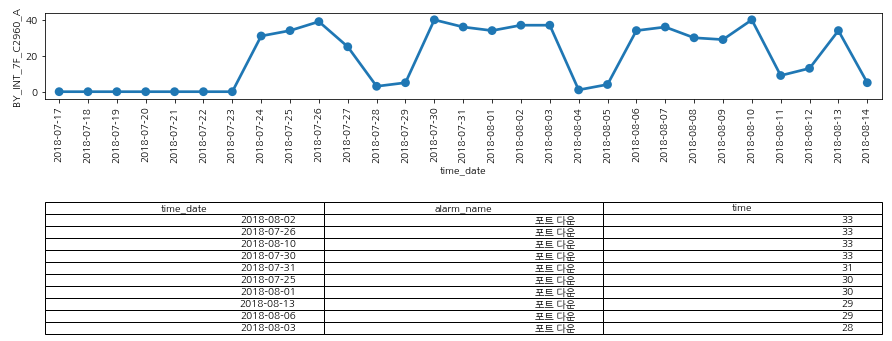

>>>>>>>> BY_2F_INT_EX2200_1


<Figure size 432x288 with 0 Axes>

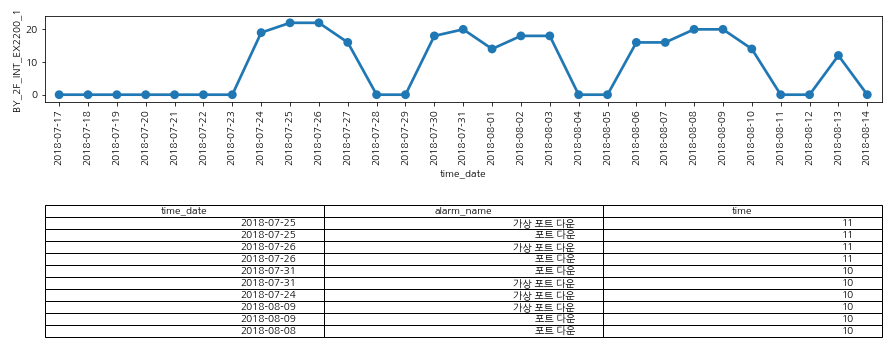

>>>>>>>> BY_3F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

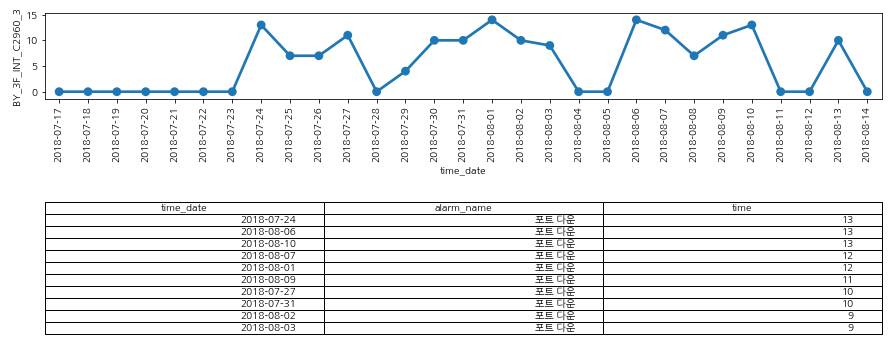

>>>>>>>> BY_6F_EX2200_1


<Figure size 432x288 with 0 Axes>

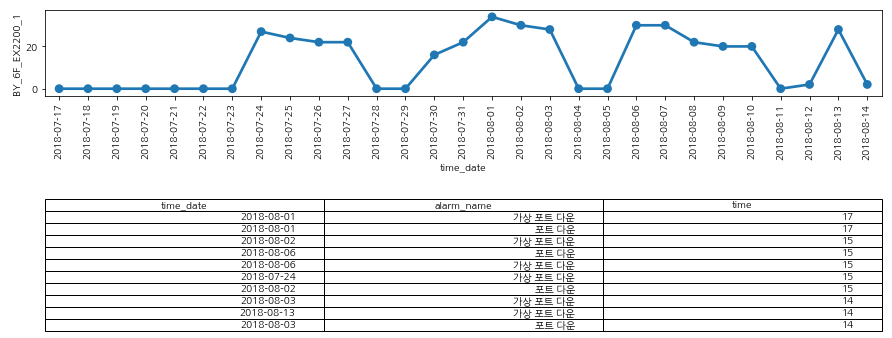

>>>>>>>> BY_5F_INT_C2960_4


<Figure size 432x288 with 0 Axes>

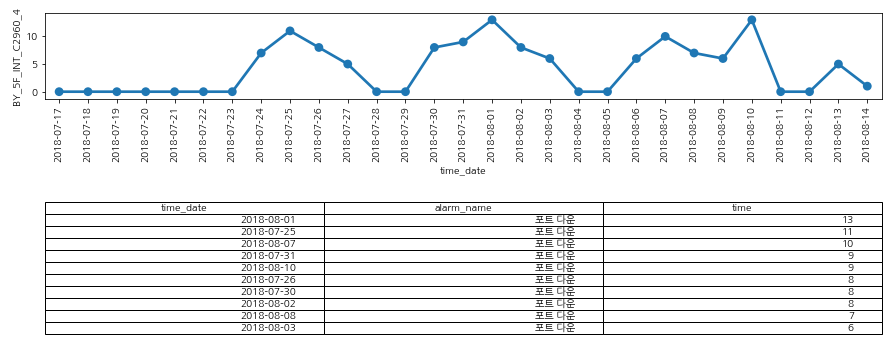

>>>>>>>> BY_2F_INT_EX2200_2


<Figure size 432x288 with 0 Axes>

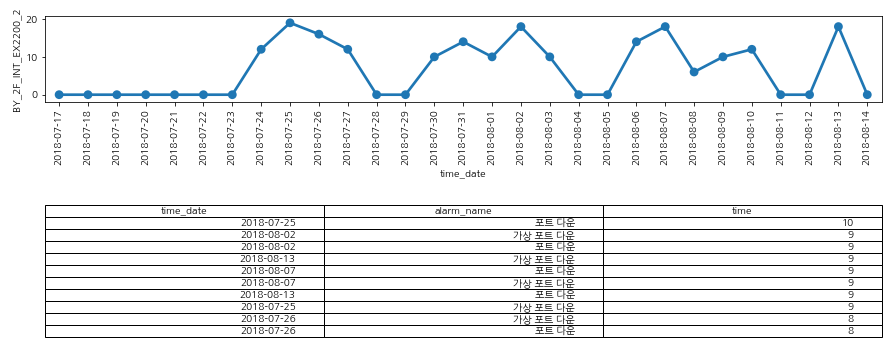

######### ('hlwpmoses11', 'hlwpmoses12', 'hlwpmoses07', 'hlwpmoses13', 'hlwpmoses10')
>>>>>>>> hlwpmoses11


<Figure size 432x288 with 0 Axes>

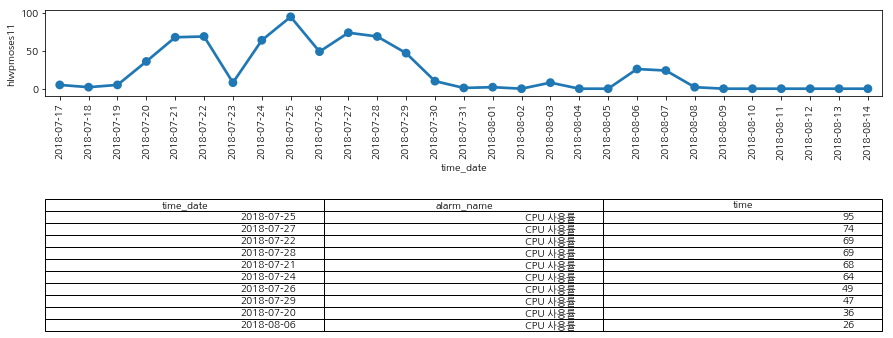

>>>>>>>> hlwpmoses12


<Figure size 432x288 with 0 Axes>

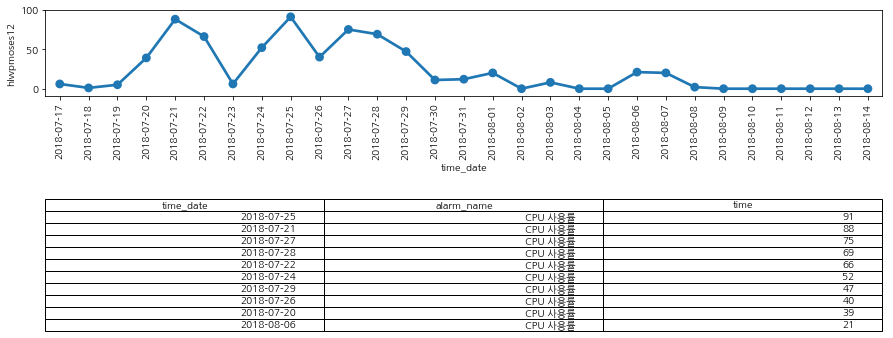

>>>>>>>> hlwpmoses07


<Figure size 432x288 with 0 Axes>

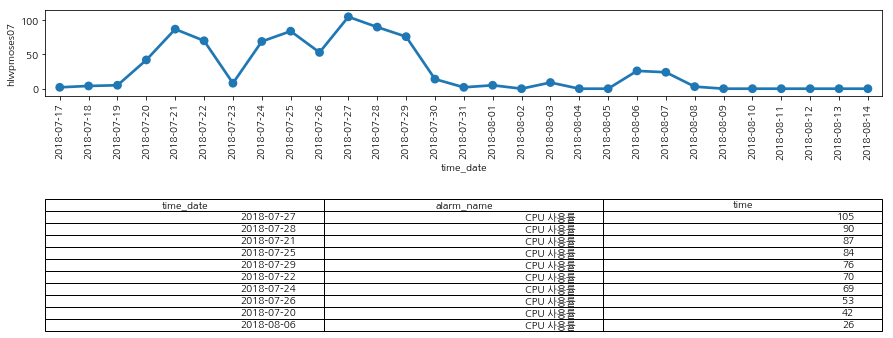

>>>>>>>> hlwpmoses13


<Figure size 432x288 with 0 Axes>

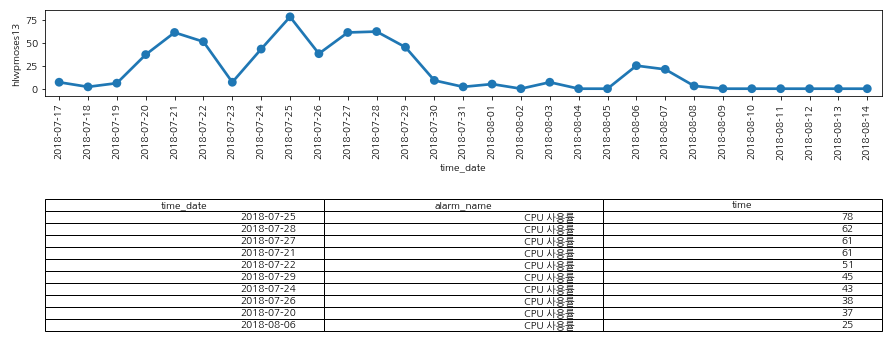

>>>>>>>> hlwpmoses10


<Figure size 432x288 with 0 Axes>

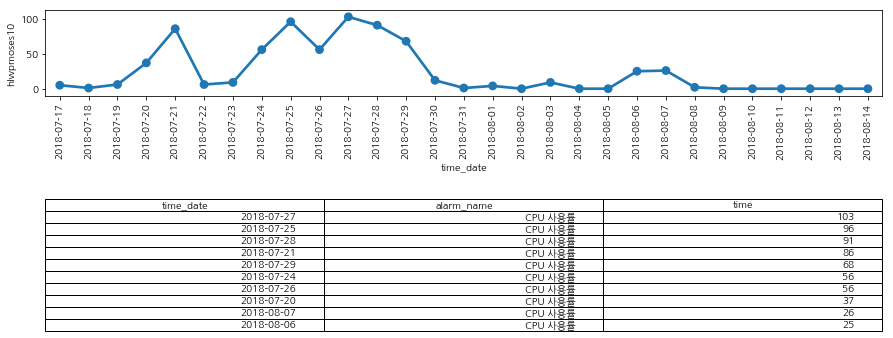

######### ('HK_SIN7F_C2950_8', 'HFEU-TREC234', 'HKCC-TREC236', 'HKCC-TREC235', 'HKCC-TREC231')
>>>>>>>> HK_SIN7F_C2950_8


<Figure size 432x288 with 0 Axes>

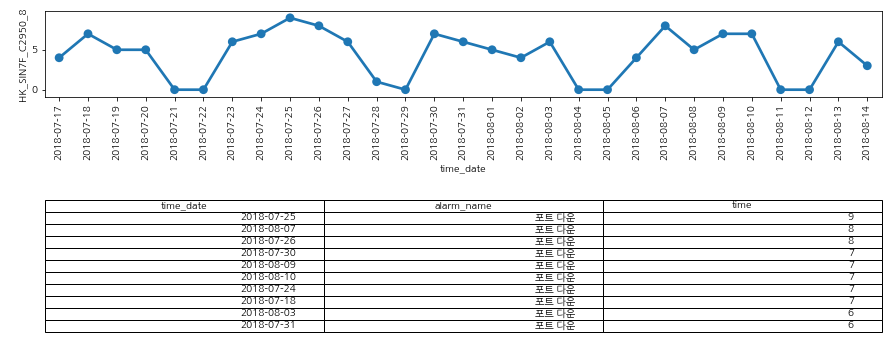

>>>>>>>> HFEU-TREC234


<Figure size 432x288 with 0 Axes>

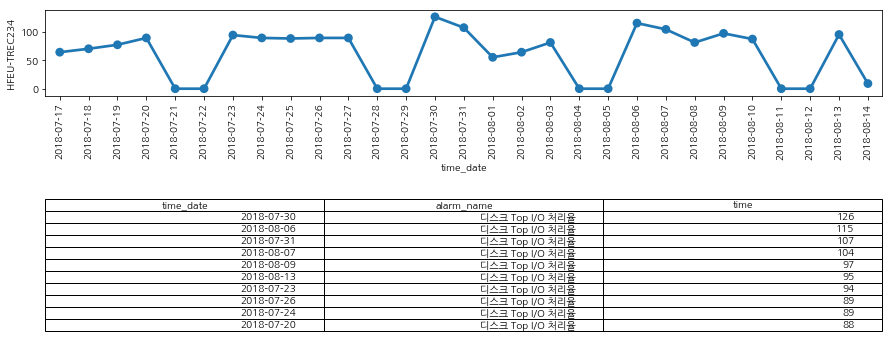

>>>>>>>> HKCC-TREC236


<Figure size 432x288 with 0 Axes>

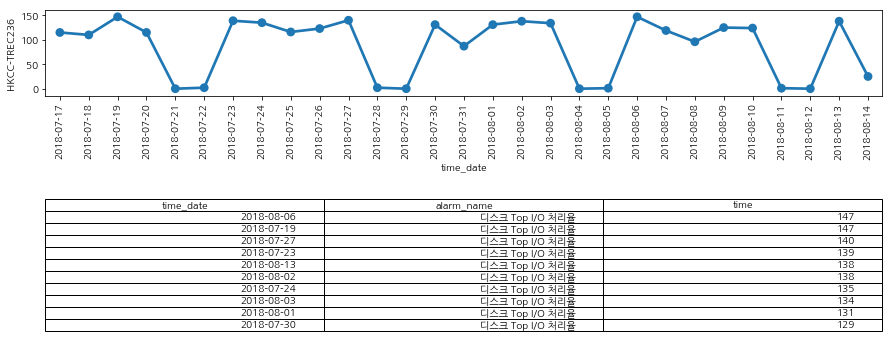

>>>>>>>> HKCC-TREC235


<Figure size 432x288 with 0 Axes>

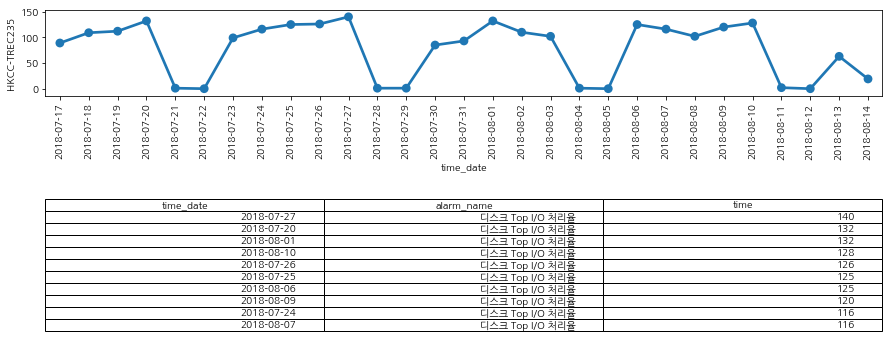

>>>>>>>> HKCC-TREC231


<Figure size 432x288 with 0 Axes>

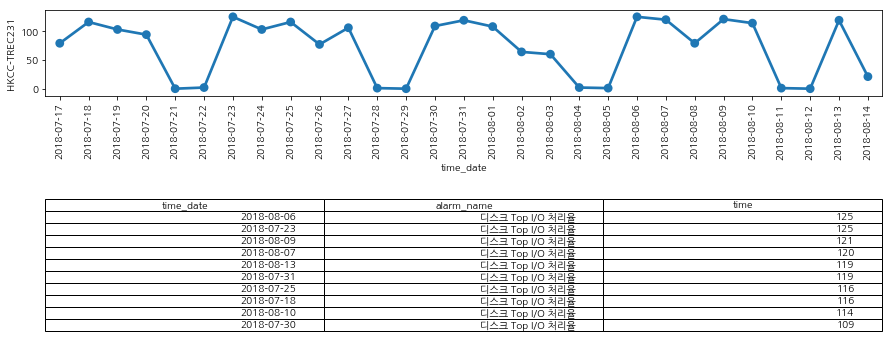

######### ('hfapca04', 'hfapca03')
>>>>>>>> hfapca04


<Figure size 432x288 with 0 Axes>

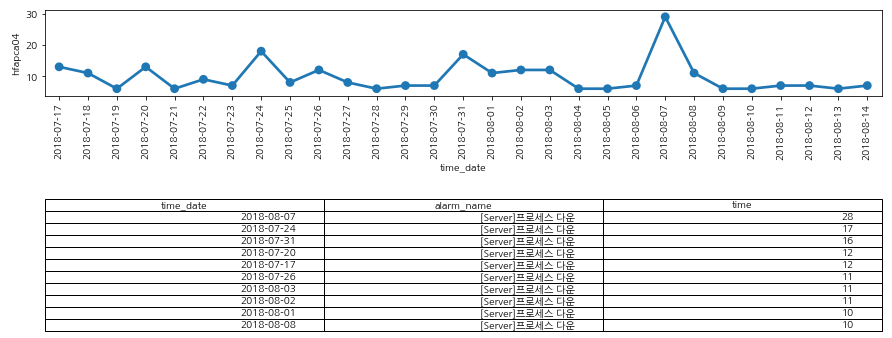

>>>>>>>> hfapca03


<Figure size 432x288 with 0 Axes>

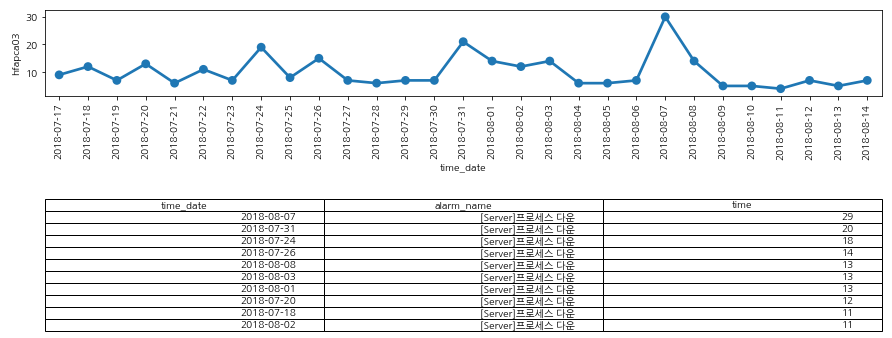

######### ('hkpmci01', 'hkpmci02')
>>>>>>>> hkpmci01


<Figure size 432x288 with 0 Axes>

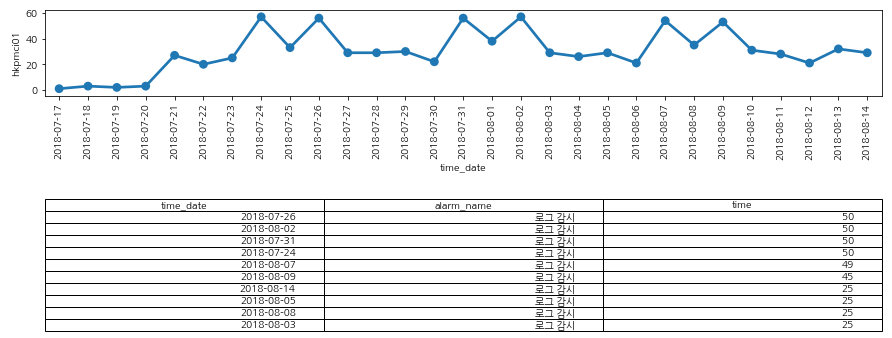

>>>>>>>> hkpmci02


<Figure size 432x288 with 0 Axes>

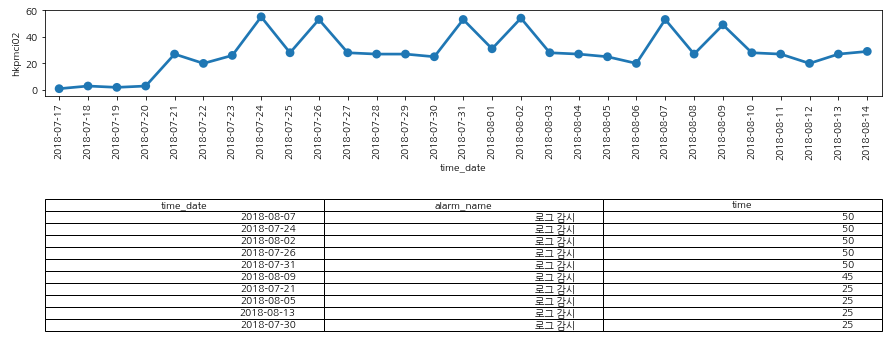

######### ('thpina01', 'HKCC-TREC236')
>>>>>>>> thpina01


<Figure size 432x288 with 0 Axes>

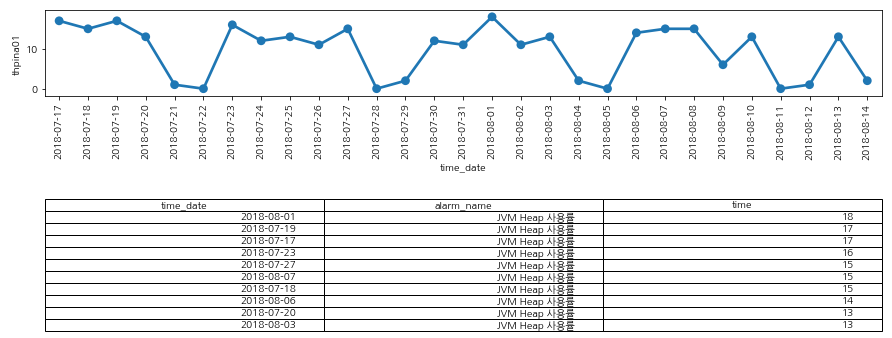

>>>>>>>> HKCC-TREC236


<Figure size 432x288 with 0 Axes>

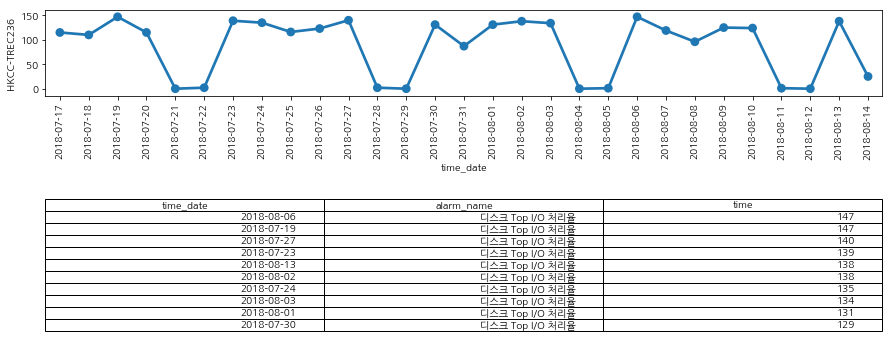

######### ('BY_INT_7F_C2960_B', 'TRN_JC_7F_FW-1')
>>>>>>>> BY_INT_7F_C2960_B


<Figure size 432x288 with 0 Axes>

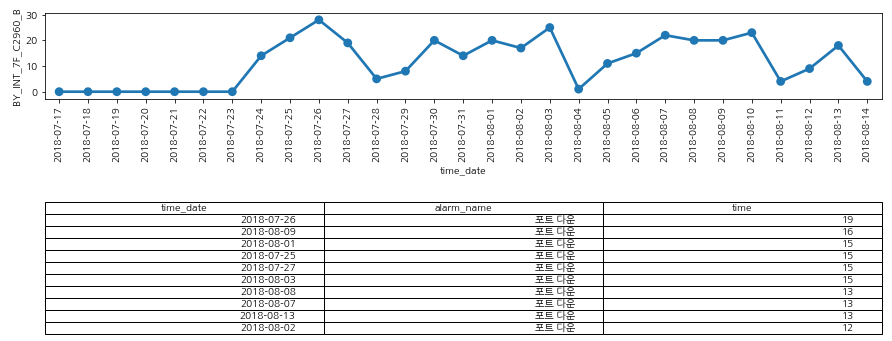

>>>>>>>> TRN_JC_7F_FW-1


<Figure size 432x288 with 0 Axes>

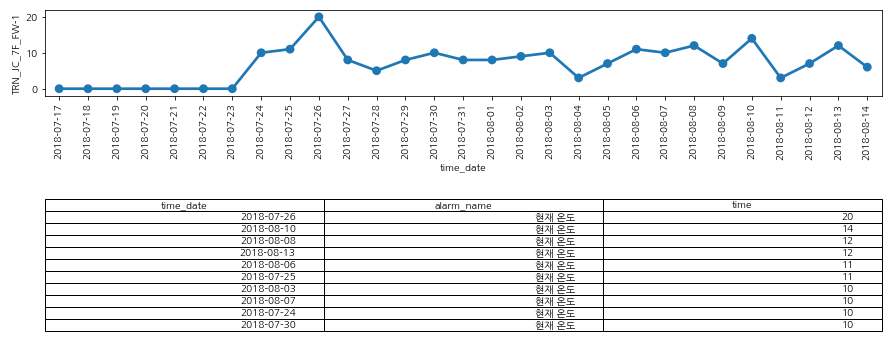

######### ('SIN5F_EX2200-48T_17', 'HKCC-TREC236', 'HF_DLP_LOG')
>>>>>>>> SIN5F_EX2200-48T_17


<Figure size 432x288 with 0 Axes>

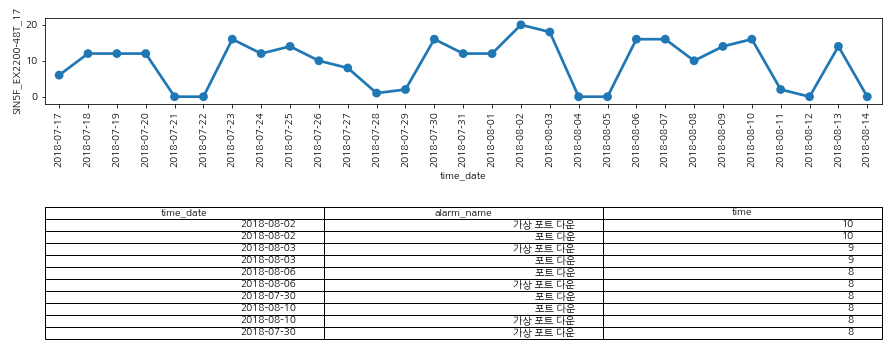

>>>>>>>> HKCC-TREC236


<Figure size 432x288 with 0 Axes>

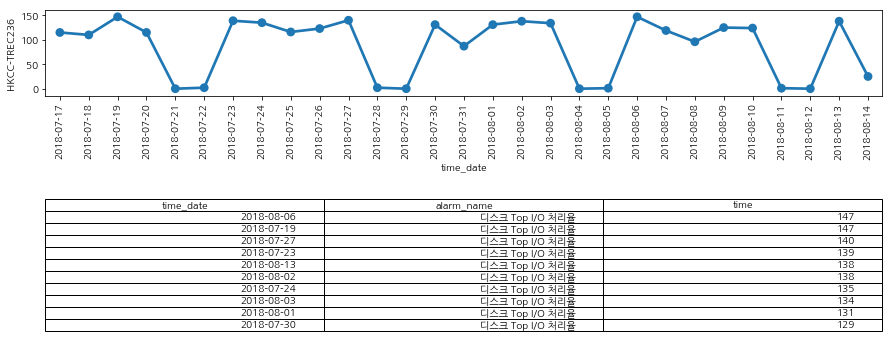

>>>>>>>> HF_DLP_LOG


<Figure size 432x288 with 0 Axes>

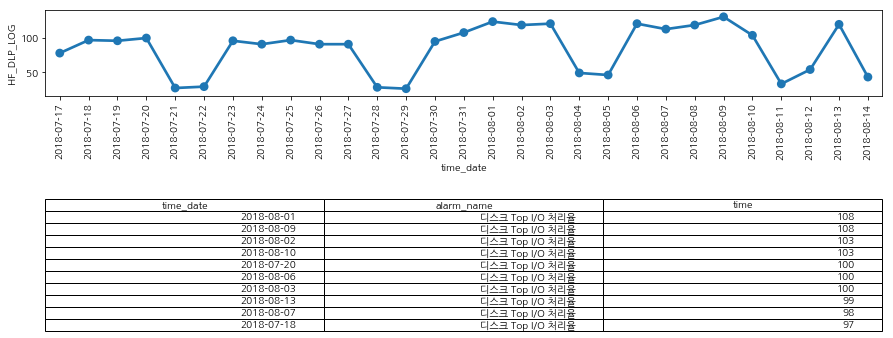

######### ('hlupepwas01', 'hlupepwas02')
>>>>>>>> hlupepwas01


<Figure size 432x288 with 0 Axes>

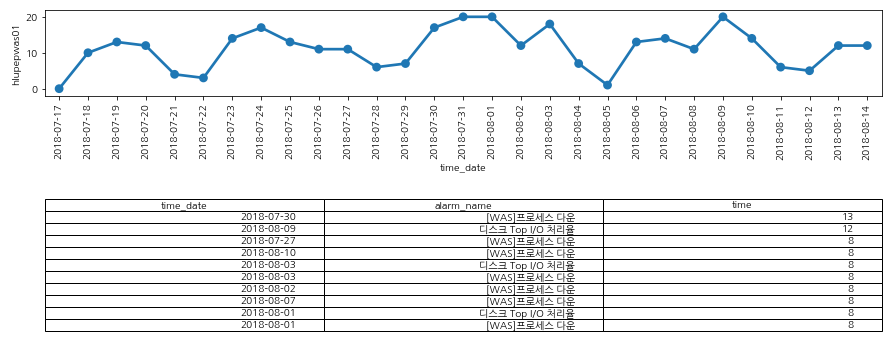

>>>>>>>> hlupepwas02


<Figure size 432x288 with 0 Axes>

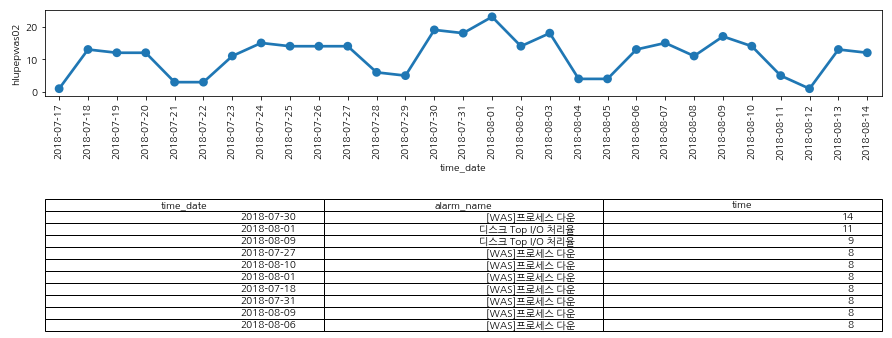

######### ('HKTM-TREC171', 'HKTM-TREC172')
>>>>>>>> HKTM-TREC171


<Figure size 432x288 with 0 Axes>

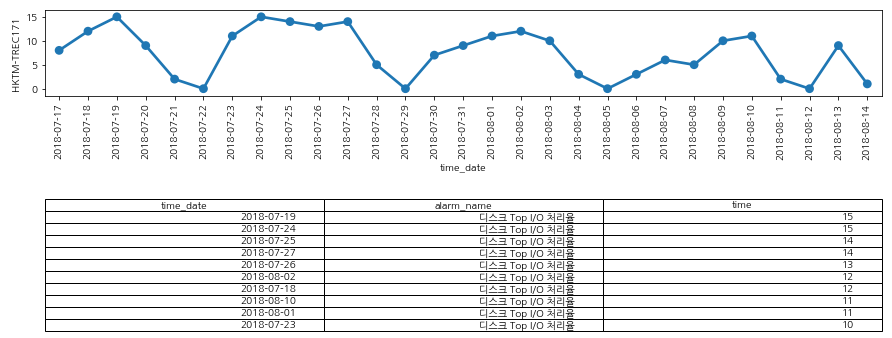

>>>>>>>> HKTM-TREC172


<Figure size 432x288 with 0 Axes>

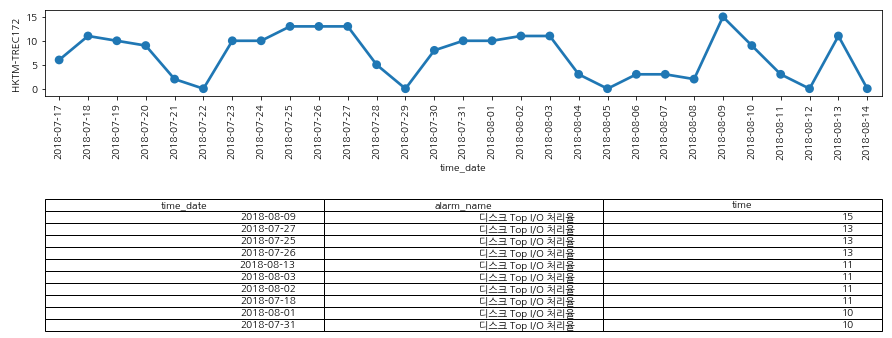

######### ('hlwpmoses11', 'hlwpmoses06', 'hlwpmoses12', 'hlwpmoses07', 'hlwpmoses13', 'hlwpmoses10')
>>>>>>>> hlwpmoses11


<Figure size 432x288 with 0 Axes>

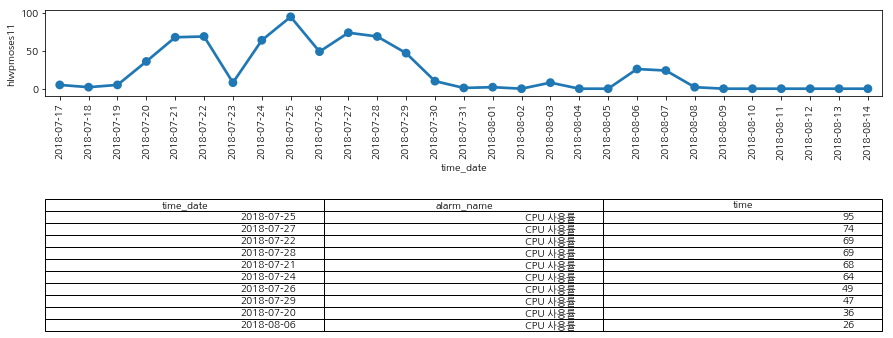

>>>>>>>> hlwpmoses06


<Figure size 432x288 with 0 Axes>

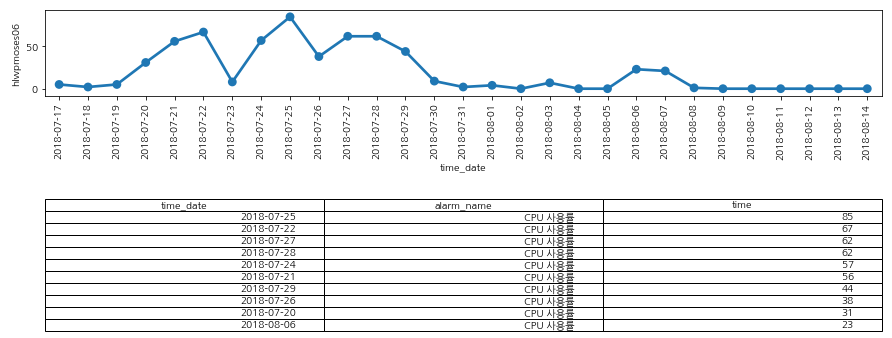

>>>>>>>> hlwpmoses12


<Figure size 432x288 with 0 Axes>

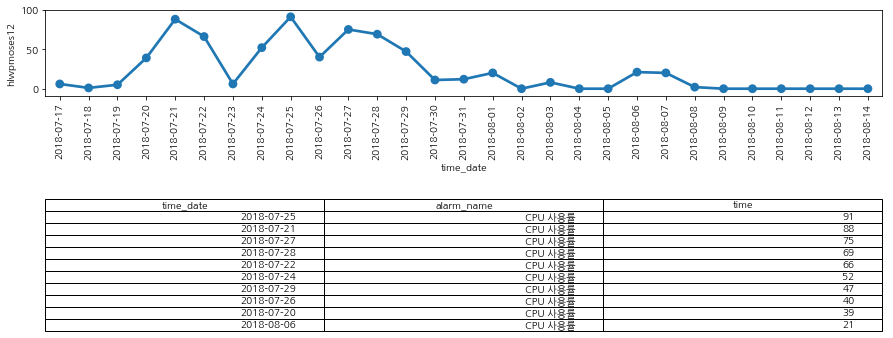

>>>>>>>> hlwpmoses07


<Figure size 432x288 with 0 Axes>

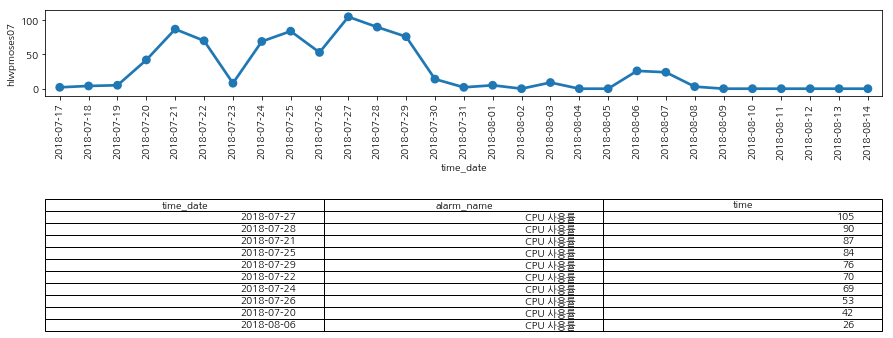

>>>>>>>> hlwpmoses13


<Figure size 432x288 with 0 Axes>

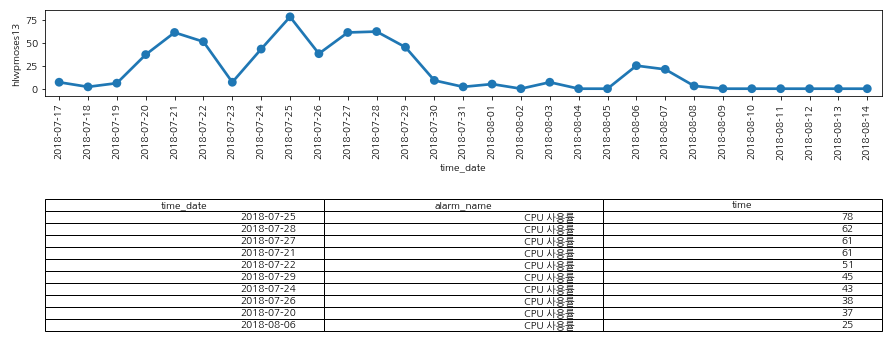

>>>>>>>> hlwpmoses10


<Figure size 432x288 with 0 Axes>

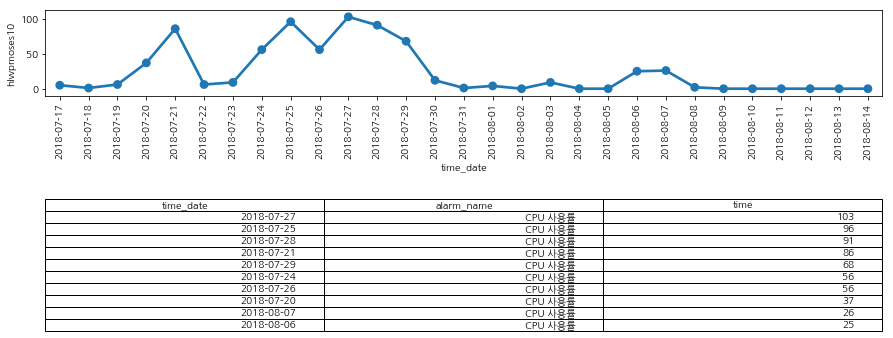

######### ('HKCC-TREC236', 'HF_DLP_LOG', 'TBCC-TREC1', 'TBCC-TREC4')
>>>>>>>> HKCC-TREC236


<Figure size 432x288 with 0 Axes>

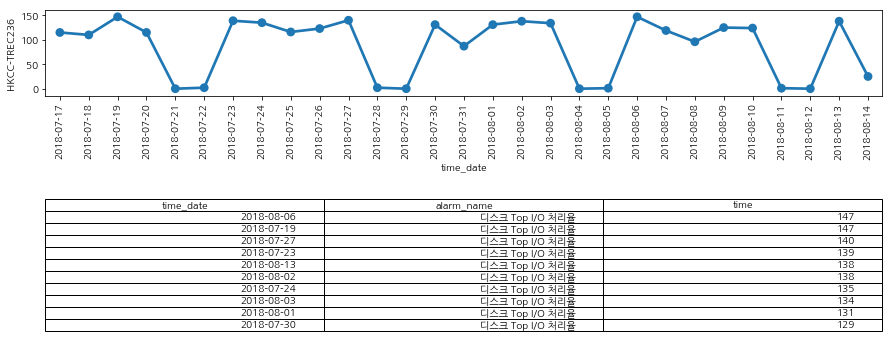

>>>>>>>> HF_DLP_LOG


<Figure size 432x288 with 0 Axes>

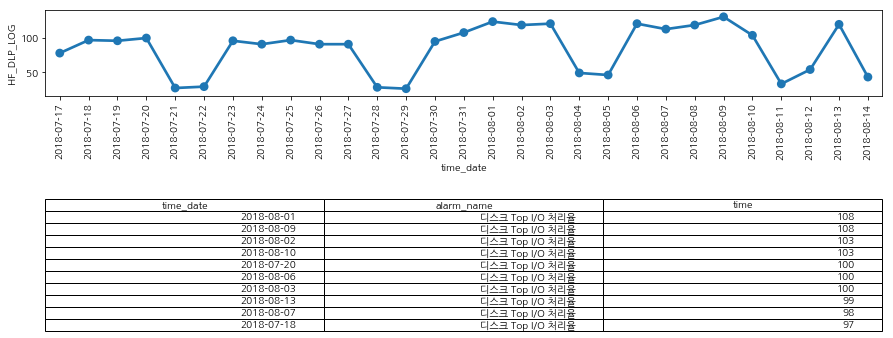

>>>>>>>> TBCC-TREC1


<Figure size 432x288 with 0 Axes>

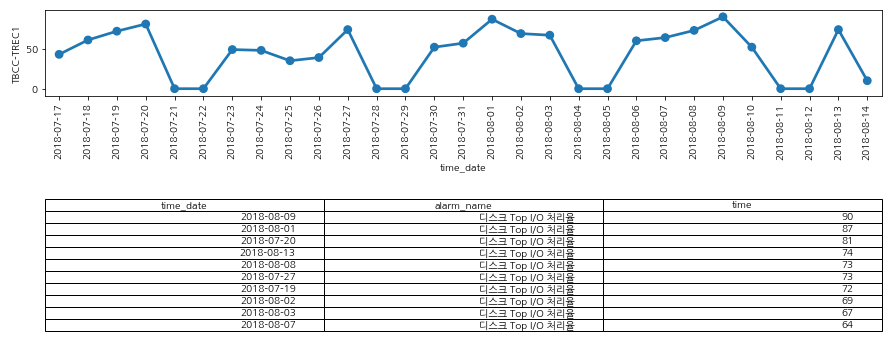

>>>>>>>> TBCC-TREC4


<Figure size 432x288 with 0 Axes>

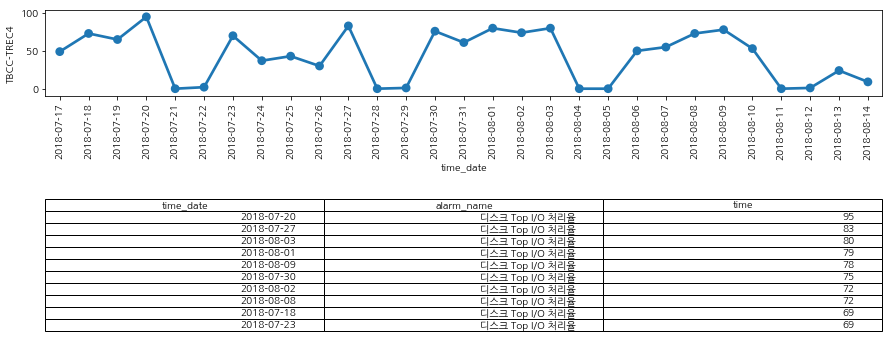

######### ('HKCC-TREC231', 'HK_SIN7F_C2950_8')
>>>>>>>> HKCC-TREC231


<Figure size 432x288 with 0 Axes>

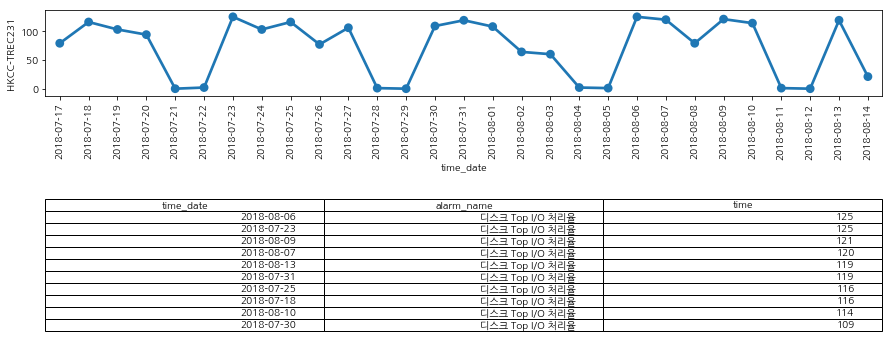

>>>>>>>> HK_SIN7F_C2950_8


<Figure size 432x288 with 0 Axes>

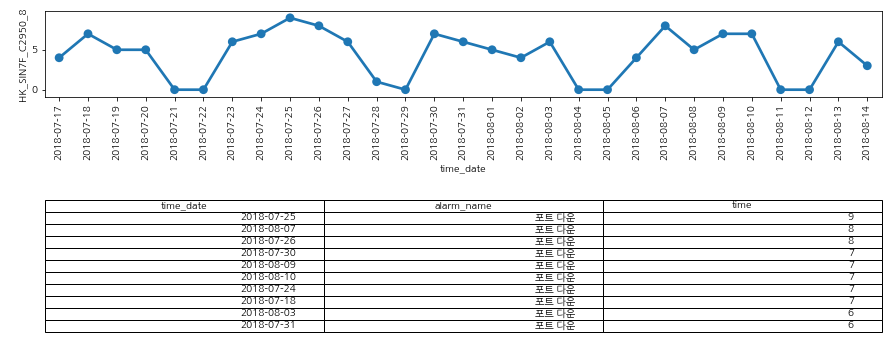

######### ('hfapow02', 'hfapow01')
>>>>>>>> hfapow02


<Figure size 432x288 with 0 Axes>

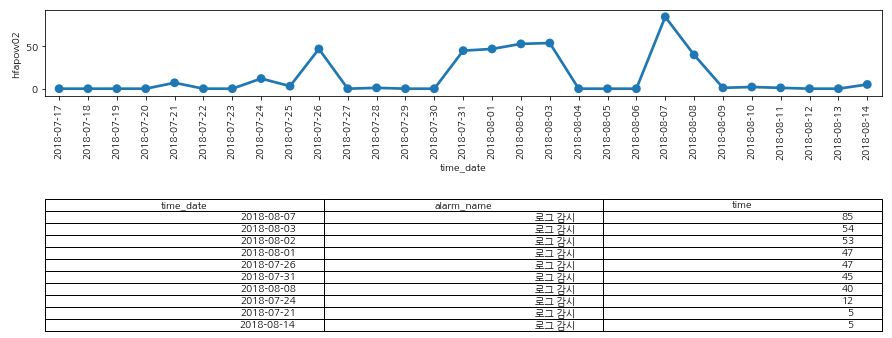

>>>>>>>> hfapow01


<Figure size 432x288 with 0 Axes>

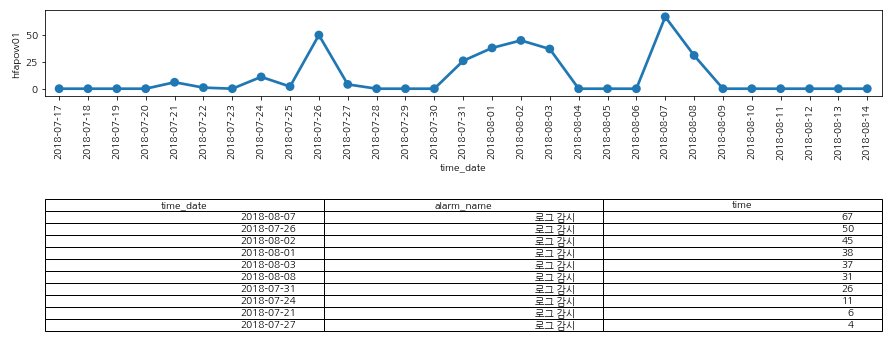

######### ('hfopccw2', 'hfopccw1')
>>>>>>>> hfopccw2


<Figure size 432x288 with 0 Axes>

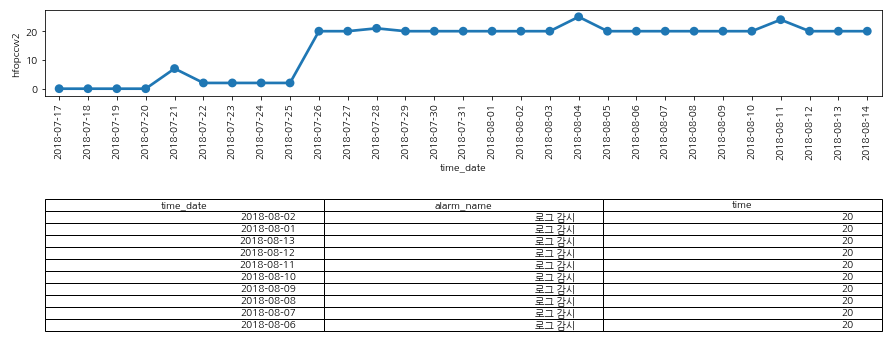

>>>>>>>> hfopccw1


<Figure size 432x288 with 0 Axes>

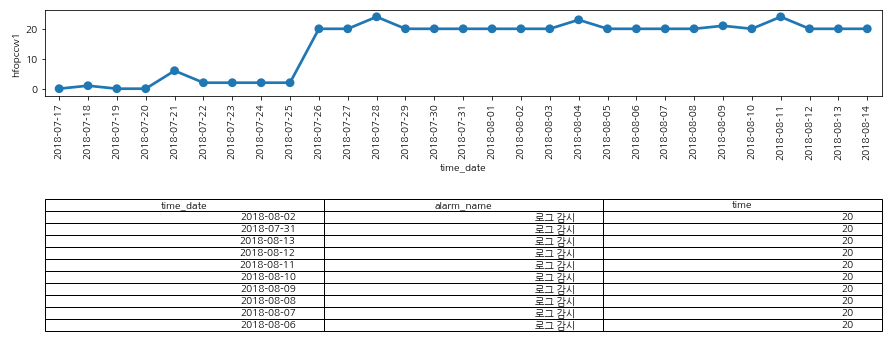

######### ('Logger_1', 'Logger_2')
>>>>>>>> Logger_1


<Figure size 432x288 with 0 Axes>

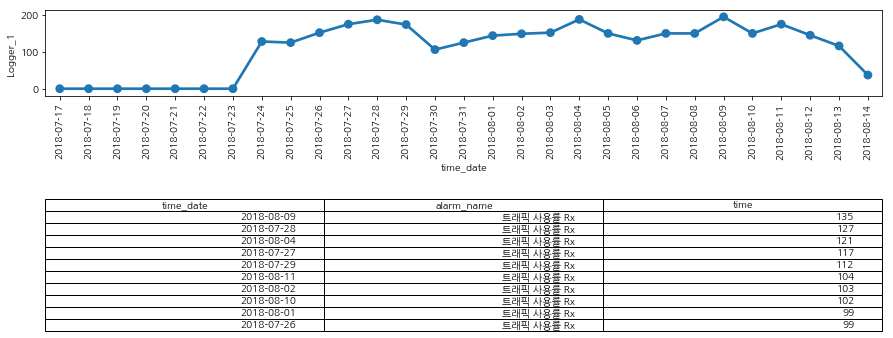

>>>>>>>> Logger_2


<Figure size 432x288 with 0 Axes>

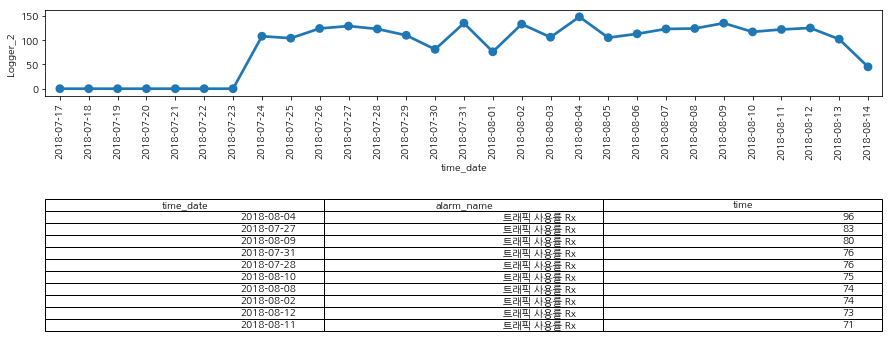

######### ('BY_6F_EX2200_1', 'BY_3F_INT_C2960_3', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A')
>>>>>>>> BY_6F_EX2200_1


<Figure size 432x288 with 0 Axes>

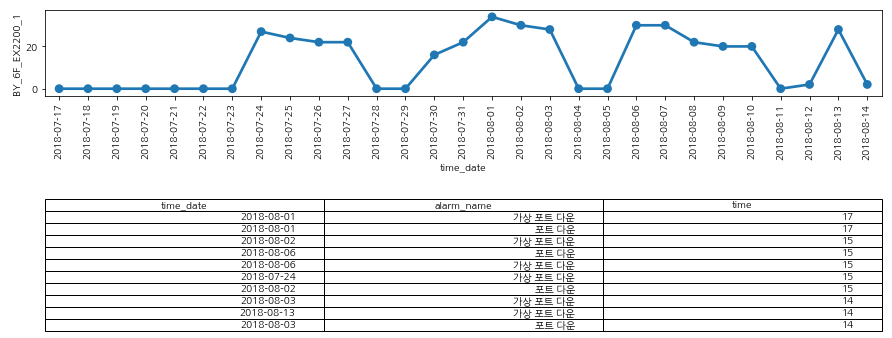

>>>>>>>> BY_3F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

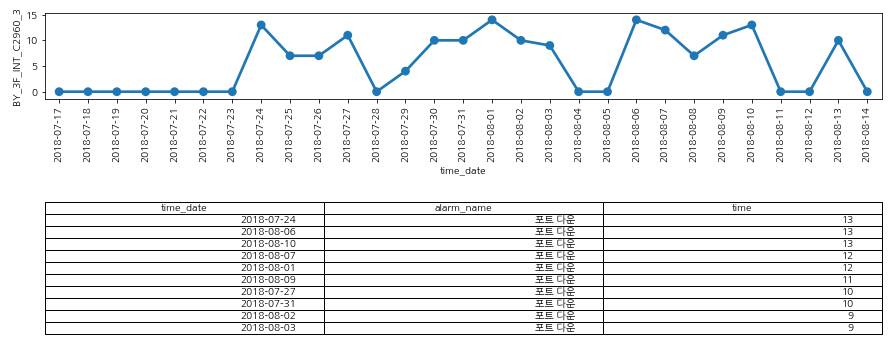

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

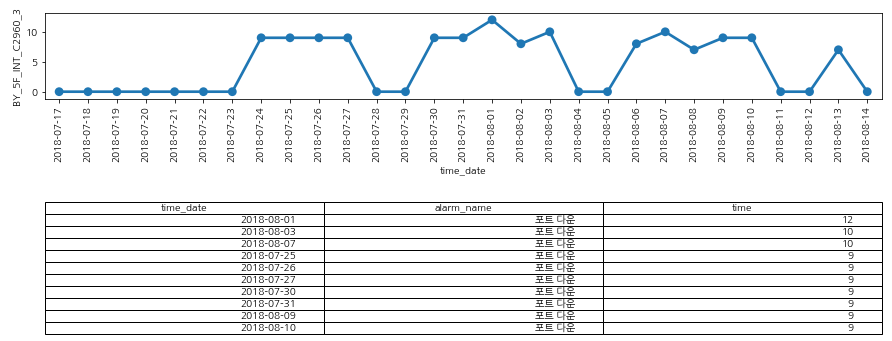

>>>>>>>> BY_INT_7F_C2960_A


<Figure size 432x288 with 0 Axes>

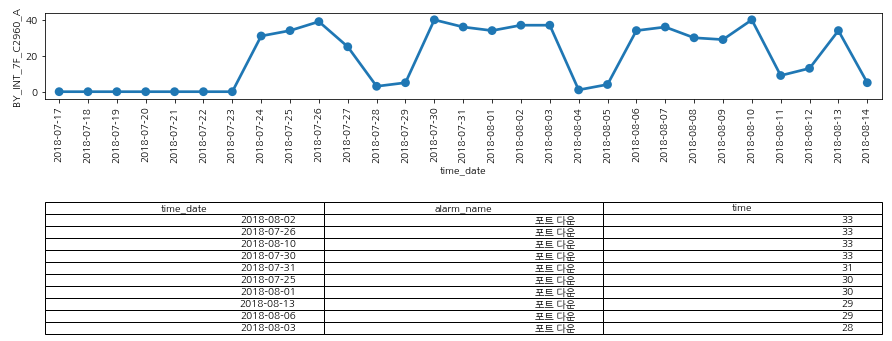

######### ('BY_INT_7F_C2960_B', 'TRN_JC_7F_FW-1', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A')
>>>>>>>> BY_INT_7F_C2960_B


<Figure size 432x288 with 0 Axes>

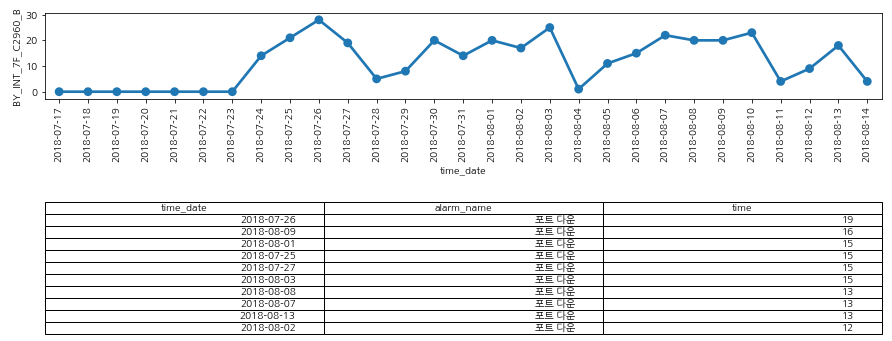

>>>>>>>> TRN_JC_7F_FW-1


<Figure size 432x288 with 0 Axes>

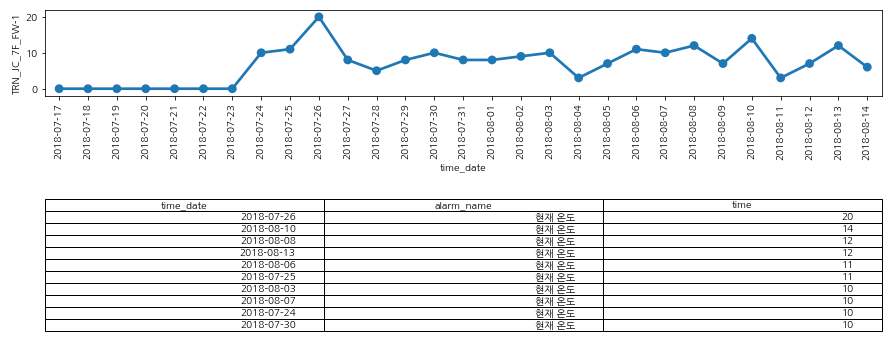

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

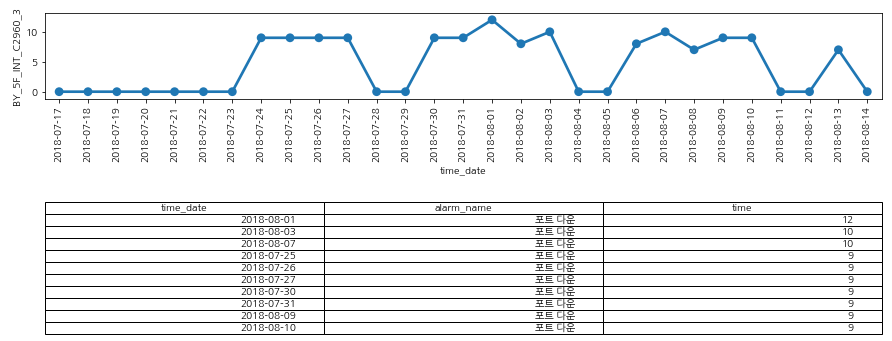

>>>>>>>> BY_INT_7F_C2960_A


<Figure size 432x288 with 0 Axes>

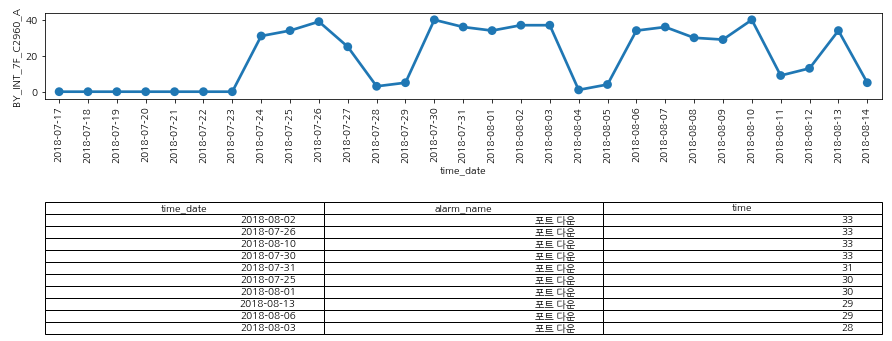

######### ('tslpemsap05', 'tslpemsap03')
>>>>>>>> tslpemsap05


<Figure size 432x288 with 0 Axes>

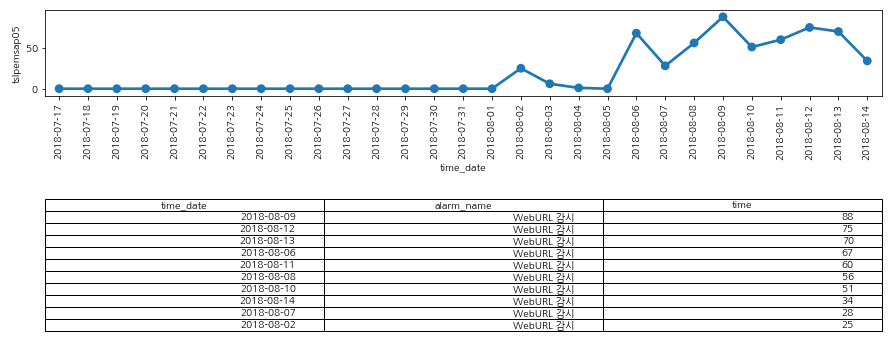

>>>>>>>> tslpemsap03


<Figure size 432x288 with 0 Axes>

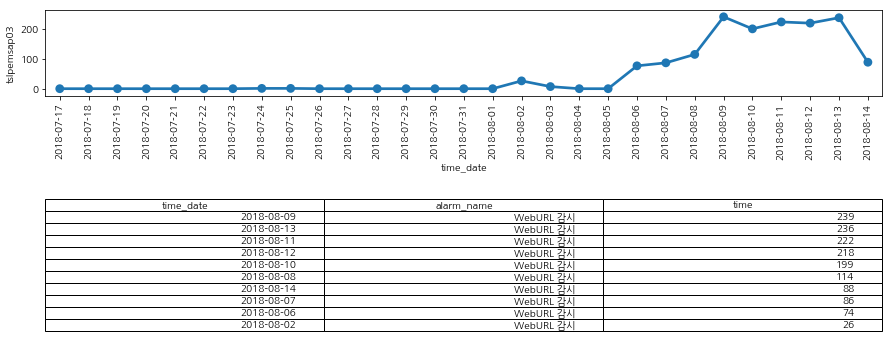

######### ('hlldumsap', 'tmgray')
>>>>>>>> hlldumsap


<Figure size 432x288 with 0 Axes>

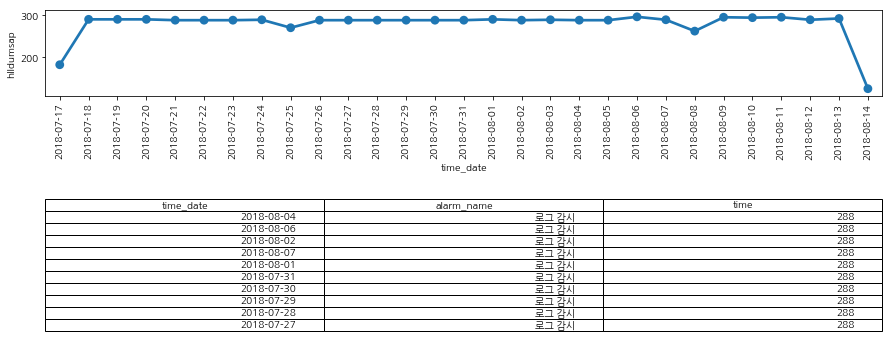

>>>>>>>> tmgray


<Figure size 432x288 with 0 Axes>

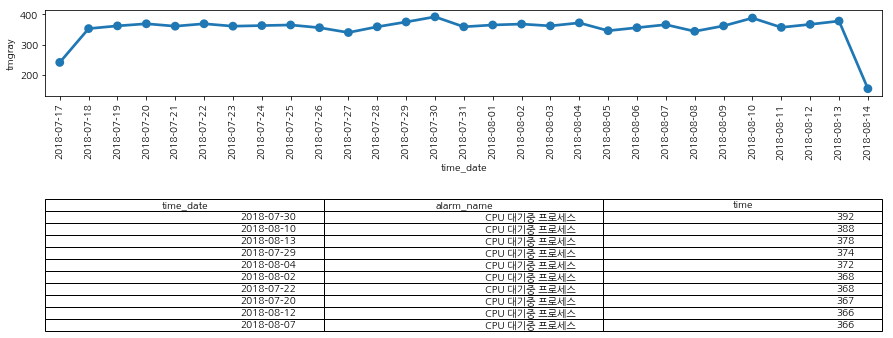

######### ('BY_6F_INT_EX2200_3', 'BY_5F_INT_C2960_3', 'Internet_EX2200_1', 'BY_6FEX2200_2', 'BY_6F_EX2200_1')
>>>>>>>> BY_6F_INT_EX2200_3


<Figure size 432x288 with 0 Axes>

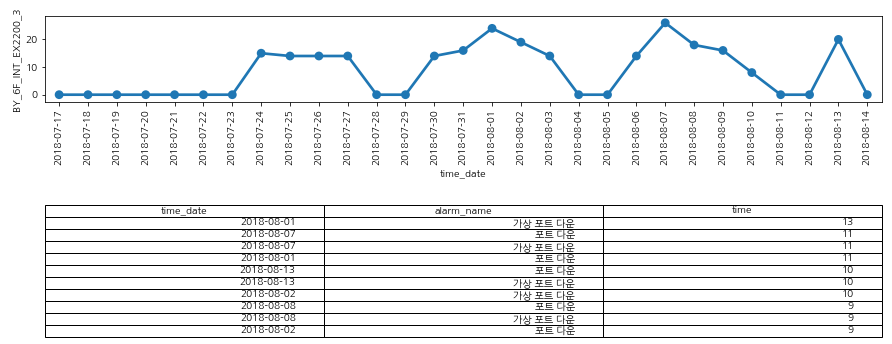

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

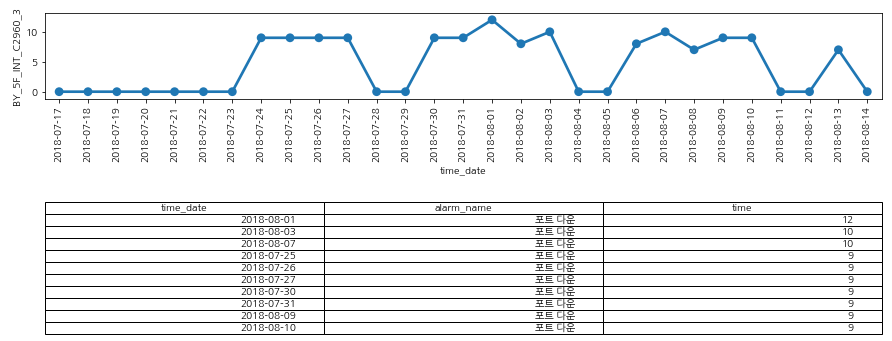

>>>>>>>> Internet_EX2200_1


<Figure size 432x288 with 0 Axes>

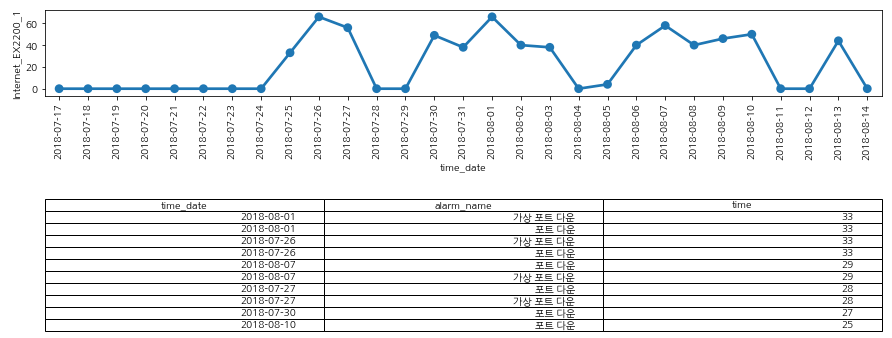

>>>>>>>> BY_6FEX2200_2


<Figure size 432x288 with 0 Axes>

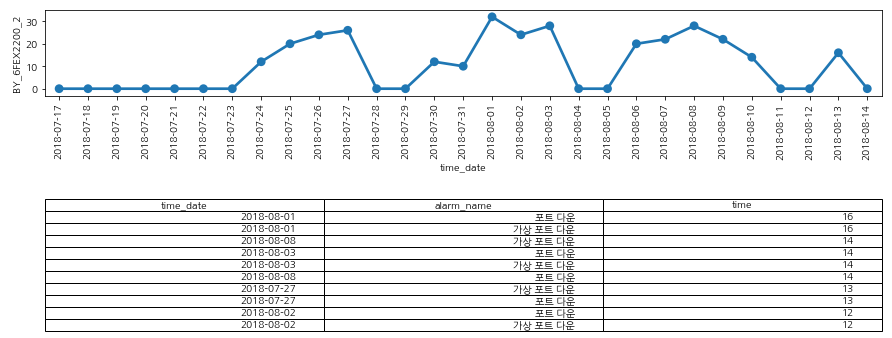

>>>>>>>> BY_6F_EX2200_1


<Figure size 432x288 with 0 Axes>

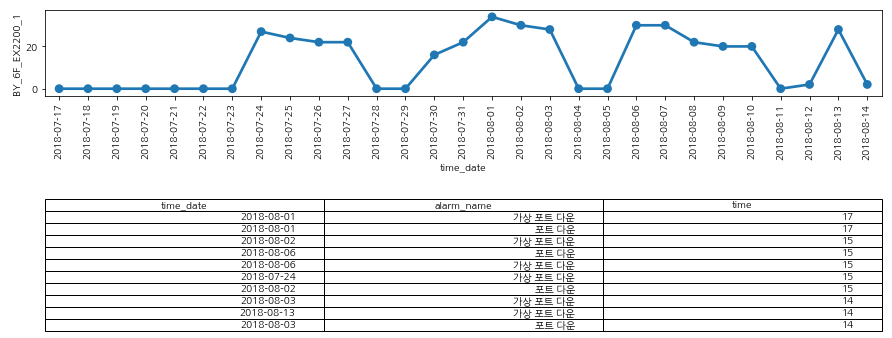

######### ('bnleaps', 'tmwhite')
>>>>>>>> bnleaps


<Figure size 432x288 with 0 Axes>

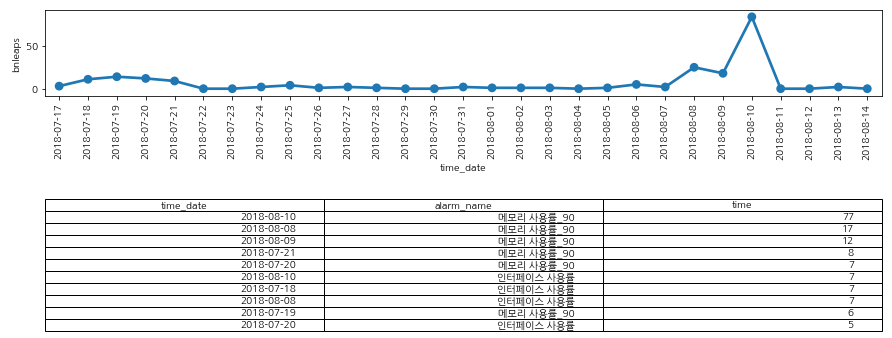

>>>>>>>> tmwhite


<Figure size 432x288 with 0 Axes>

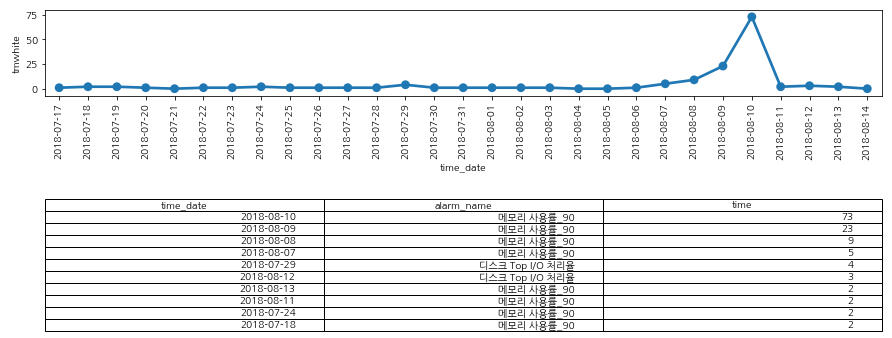

######### ('BY_INT_7F_C2960_B', 'BY_6F_INT_EX2200_3', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'Internet_EX2200_1', 'BY_2F_INT_EX2200_1', 'BY_3F_INT_C2960_3', 'BY_6FEX2200_2', 'BY_6F_EX2200_1', 'BY_5F_INT_C2960_4', 'BY_2F_INT_EX2200_2')
>>>>>>>> BY_INT_7F_C2960_B


<Figure size 432x288 with 0 Axes>

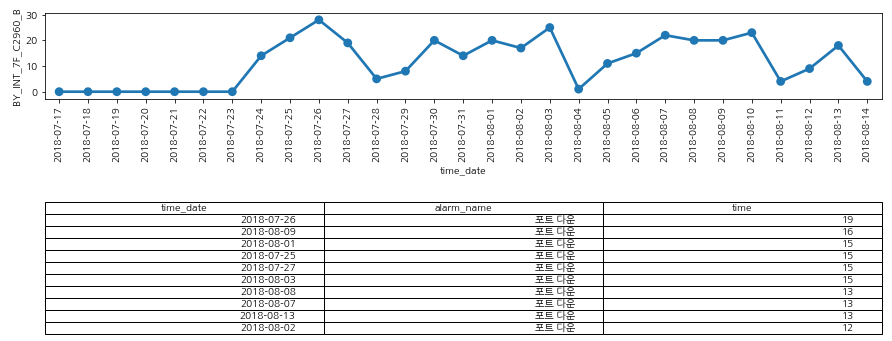

>>>>>>>> BY_6F_INT_EX2200_3


<Figure size 432x288 with 0 Axes>

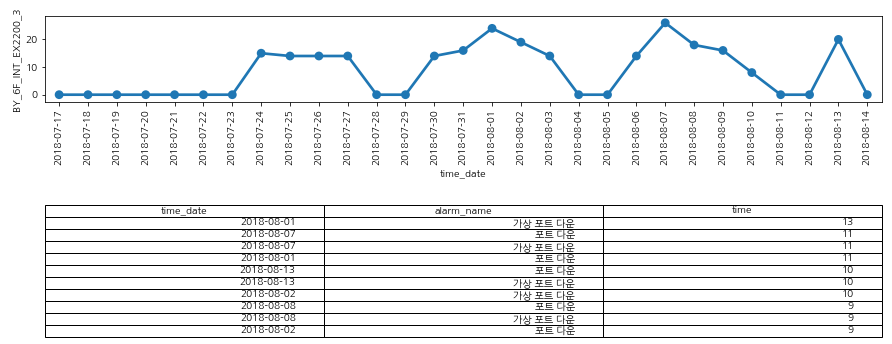

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

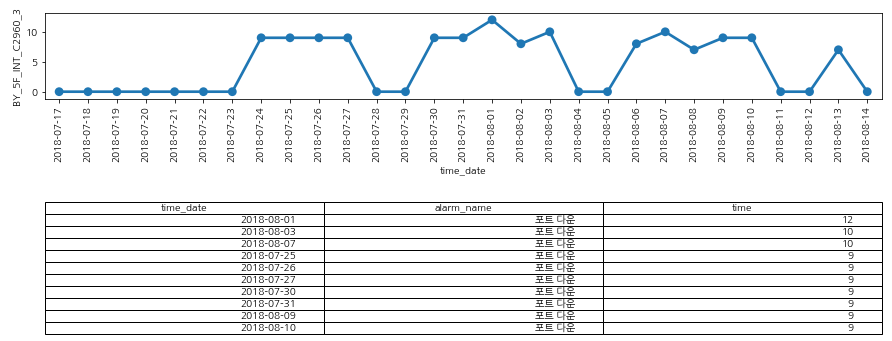

>>>>>>>> BY_INT_7F_C2960_A


<Figure size 432x288 with 0 Axes>

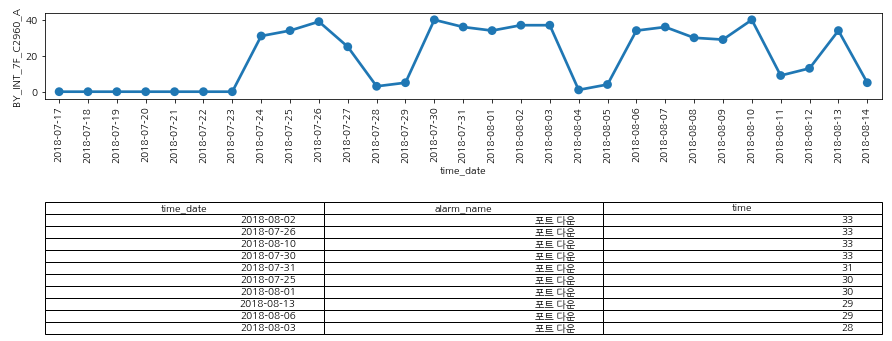

>>>>>>>> Internet_EX2200_1


<Figure size 432x288 with 0 Axes>

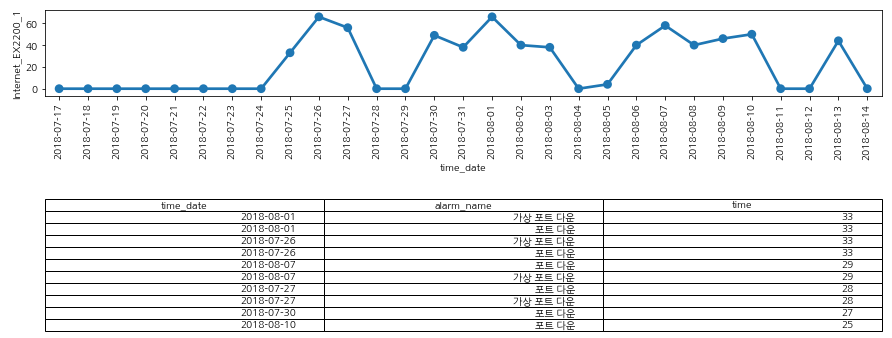

>>>>>>>> BY_2F_INT_EX2200_1


<Figure size 432x288 with 0 Axes>

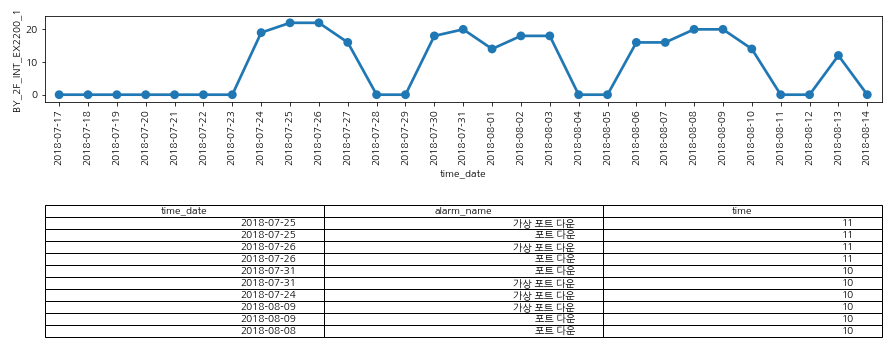

>>>>>>>> BY_3F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

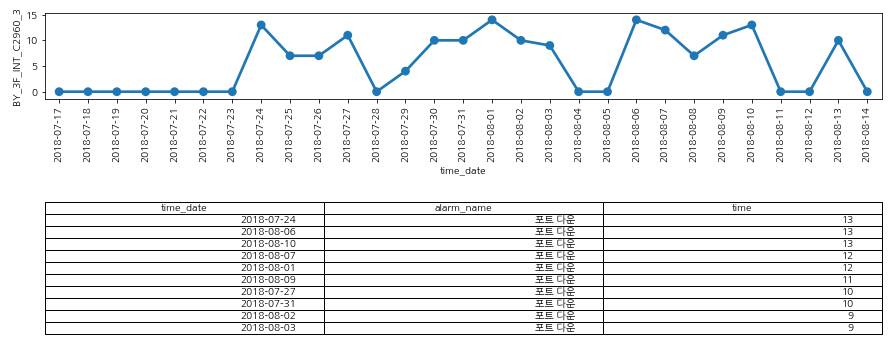

>>>>>>>> BY_6FEX2200_2


<Figure size 432x288 with 0 Axes>

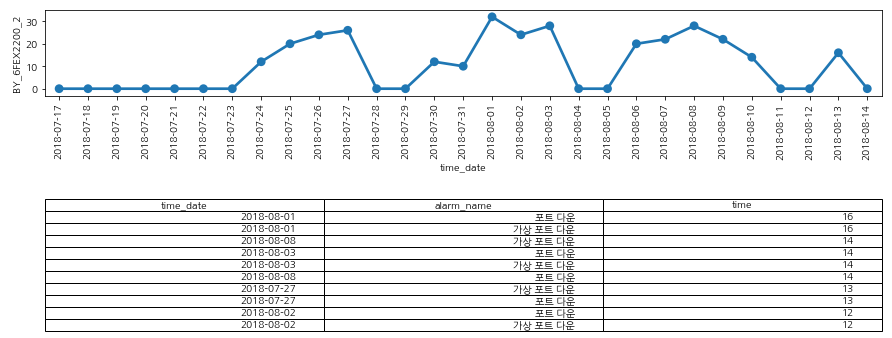

>>>>>>>> BY_6F_EX2200_1


<Figure size 432x288 with 0 Axes>

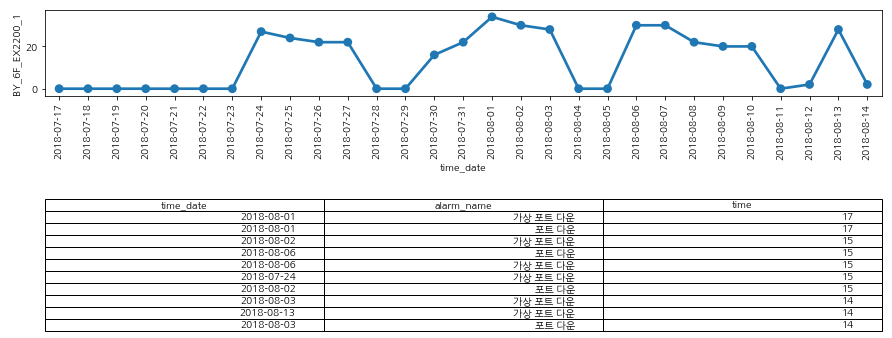

>>>>>>>> BY_5F_INT_C2960_4


<Figure size 432x288 with 0 Axes>

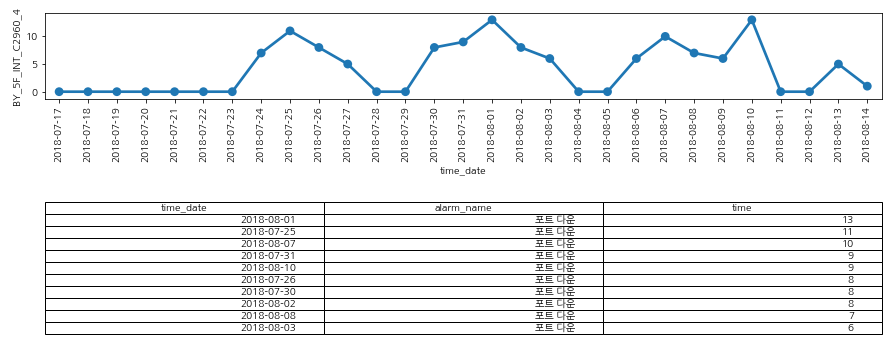

>>>>>>>> BY_2F_INT_EX2200_2


<Figure size 432x288 with 0 Axes>

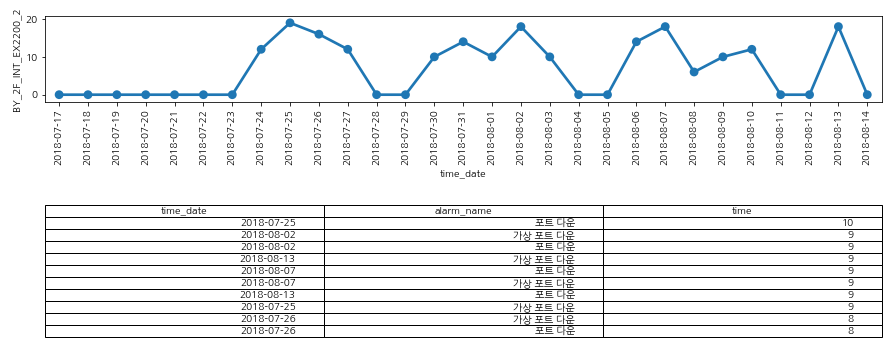

######### ('BY_6F_EX2200_1', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'BY_2F_INT_EX2200_2')
>>>>>>>> BY_6F_EX2200_1


<Figure size 432x288 with 0 Axes>

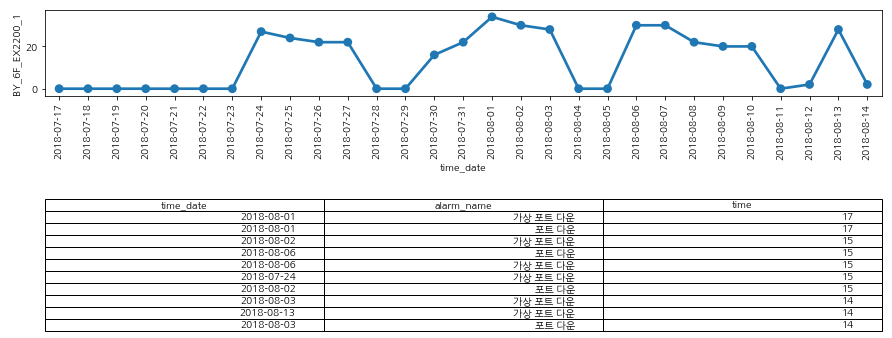

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

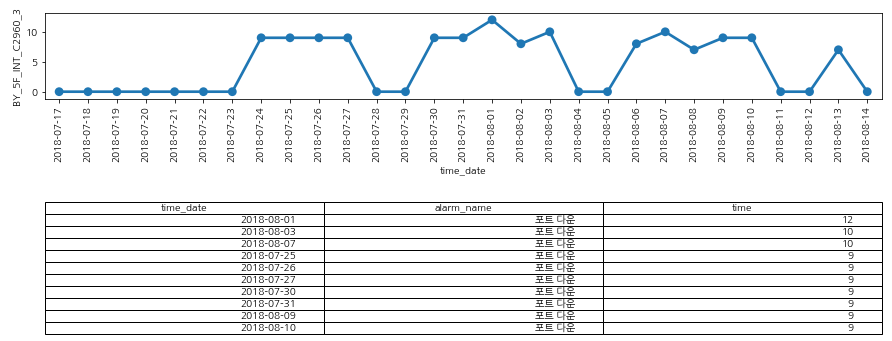

>>>>>>>> BY_INT_7F_C2960_A


<Figure size 432x288 with 0 Axes>

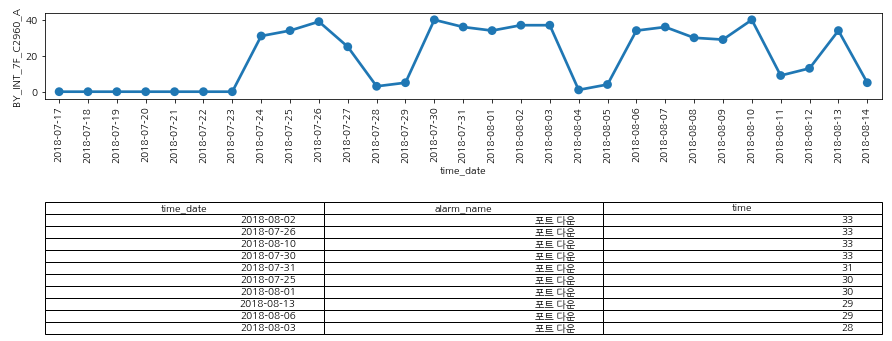

>>>>>>>> BY_2F_INT_EX2200_2


<Figure size 432x288 with 0 Axes>

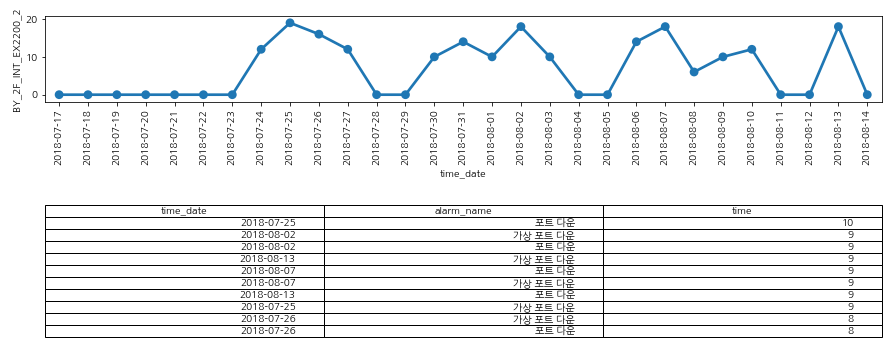

######### ('HLYDP_INT_BB_A', 'HLYDP_DWG_L3_B')
>>>>>>>> HLYDP_INT_BB_A


<Figure size 432x288 with 0 Axes>

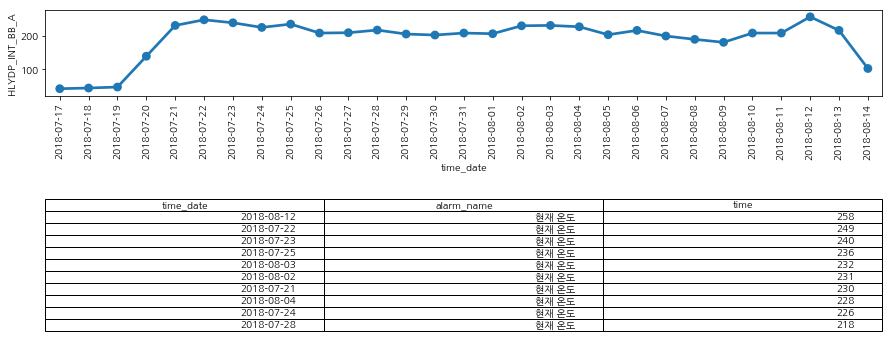

>>>>>>>> HLYDP_DWG_L3_B


<Figure size 432x288 with 0 Axes>

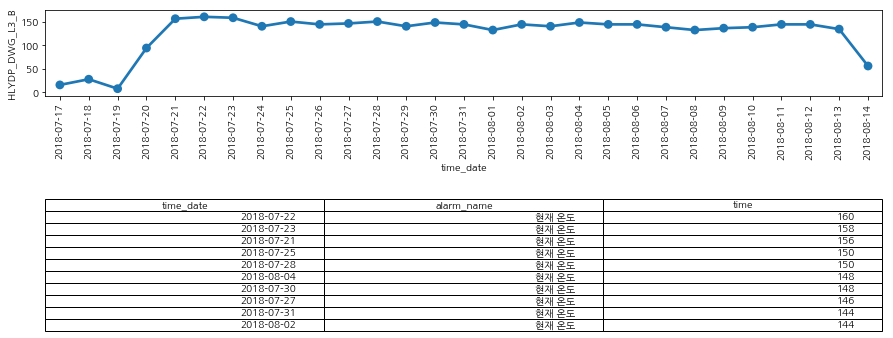

######### ('TBCC-TREC3', 'HKCC-TREC236', 'HKCC-TREC232', 'HKCC-TREC231', 'HKCC-TREC235')
>>>>>>>> TBCC-TREC3


<Figure size 432x288 with 0 Axes>

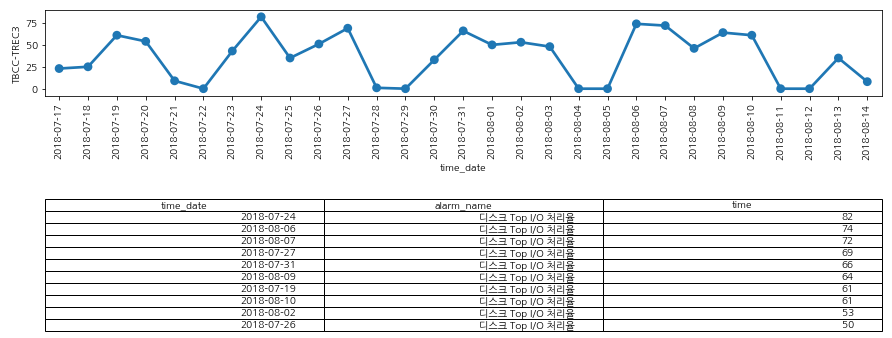

>>>>>>>> HKCC-TREC236


<Figure size 432x288 with 0 Axes>

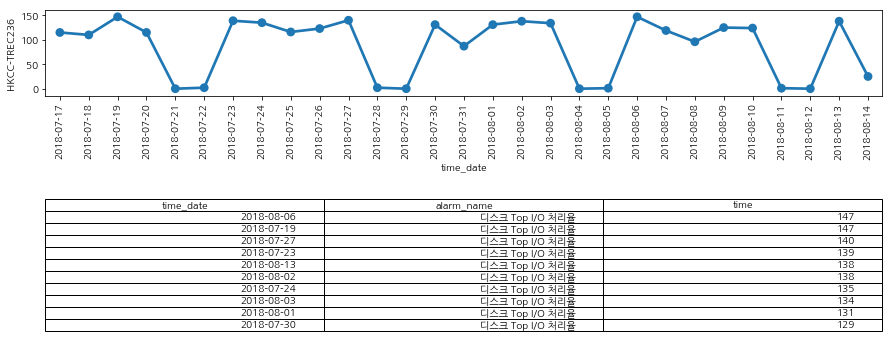

>>>>>>>> HKCC-TREC232


<Figure size 432x288 with 0 Axes>

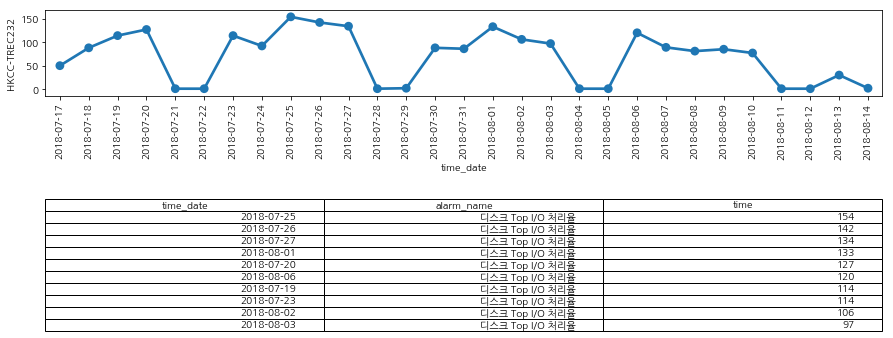

>>>>>>>> HKCC-TREC231


<Figure size 432x288 with 0 Axes>

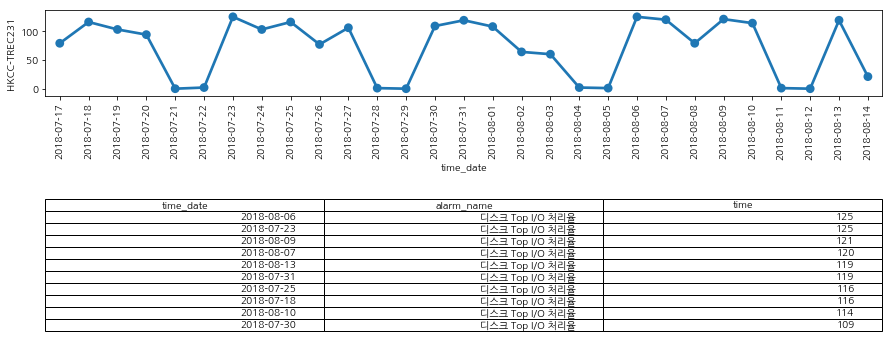

>>>>>>>> HKCC-TREC235


<Figure size 432x288 with 0 Axes>

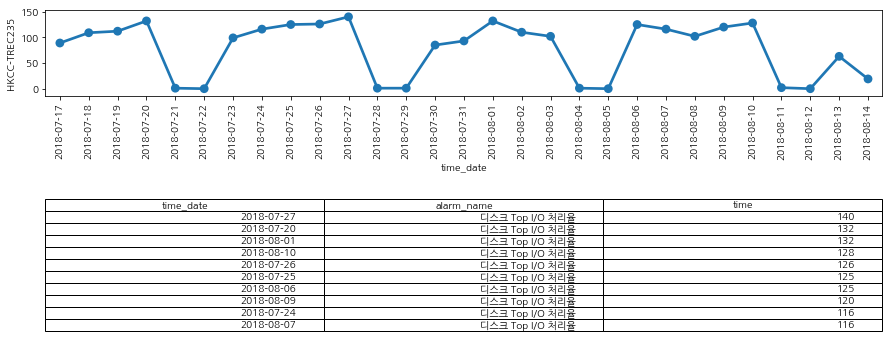

######### ('BY_6F_INT_EX2200_3', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'BY_2F_INT_EX2200_1', 'BY_3F_INT_C2960_3', 'BY_6FEX2200_2', 'BY_6F_EX2200_1', 'BY_2F_INT_EX2200_2')
>>>>>>>> BY_6F_INT_EX2200_3


<Figure size 432x288 with 0 Axes>

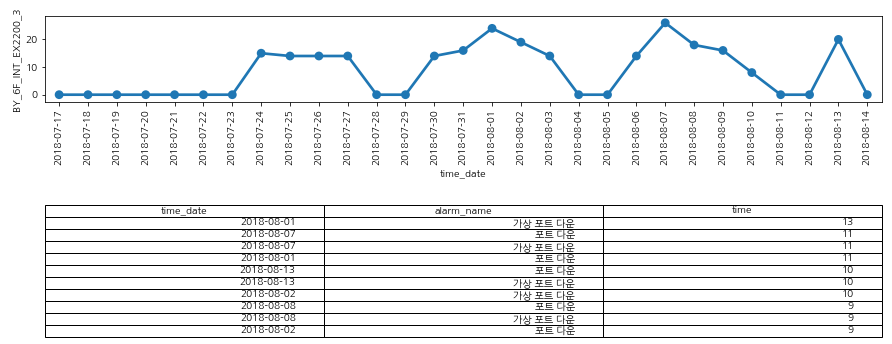

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

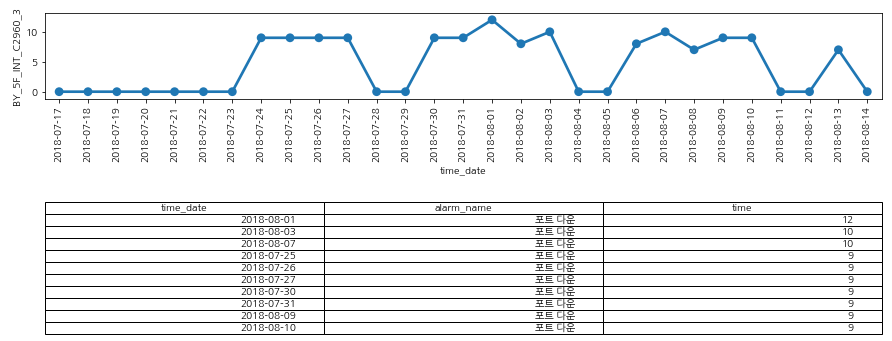

>>>>>>>> BY_INT_7F_C2960_A


<Figure size 432x288 with 0 Axes>

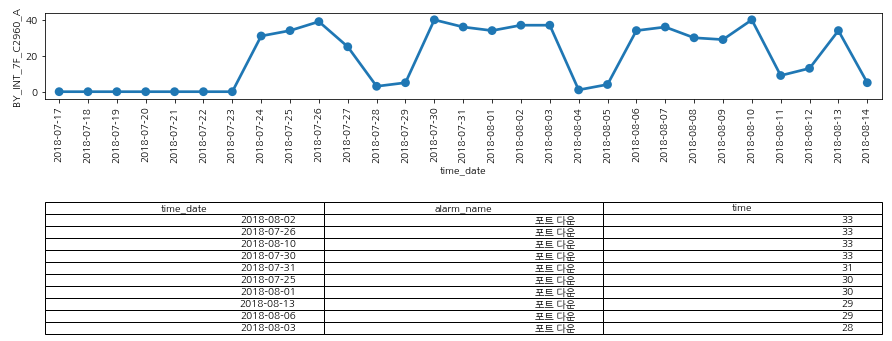

>>>>>>>> BY_2F_INT_EX2200_1


<Figure size 432x288 with 0 Axes>

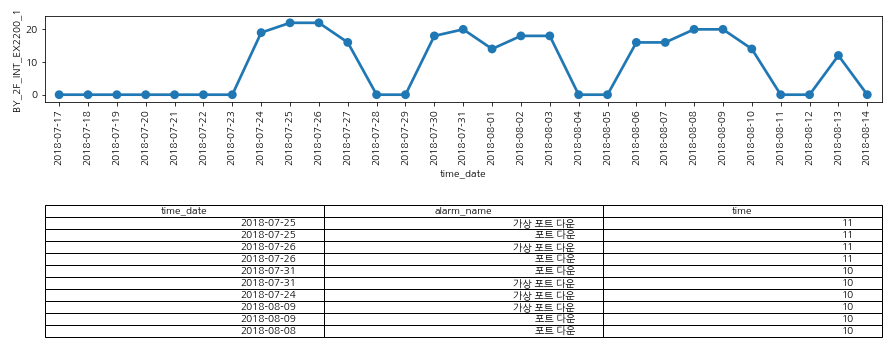

>>>>>>>> BY_3F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

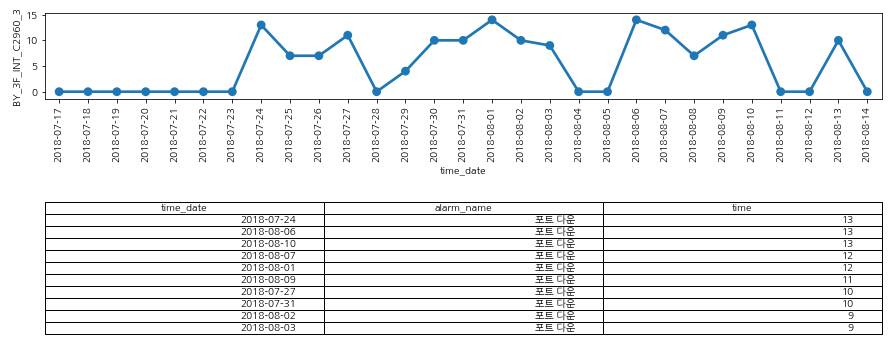

>>>>>>>> BY_6FEX2200_2


<Figure size 432x288 with 0 Axes>

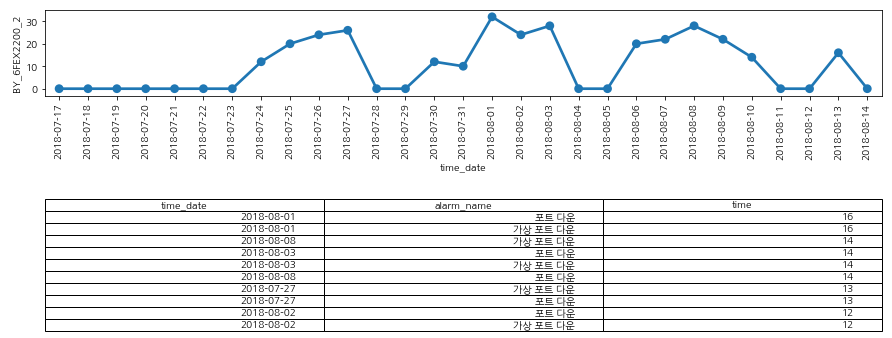

>>>>>>>> BY_6F_EX2200_1


<Figure size 432x288 with 0 Axes>

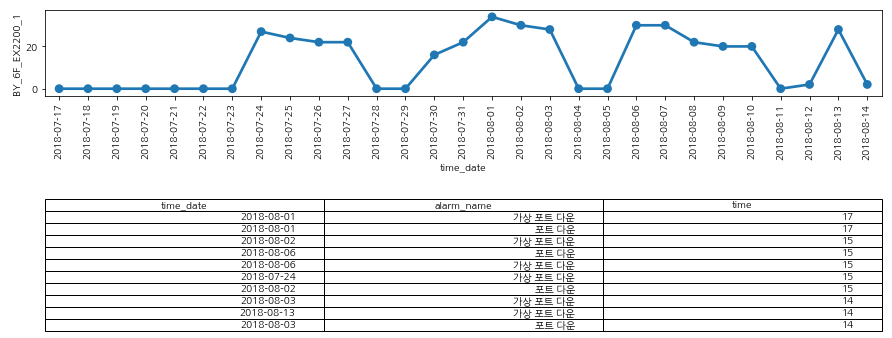

>>>>>>>> BY_2F_INT_EX2200_2


<Figure size 432x288 with 0 Axes>

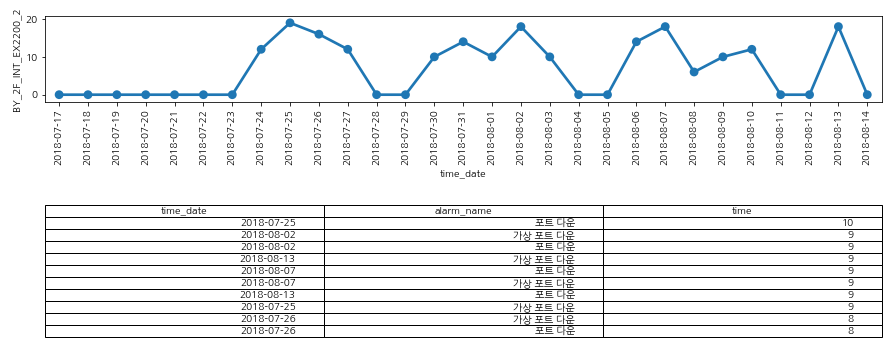

######### ('DO_HQ_EX2200_1', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'BY_2F_INT_EX2200_1', 'BY_6F_EX2200_1')
>>>>>>>> DO_HQ_EX2200_1


<Figure size 432x288 with 0 Axes>

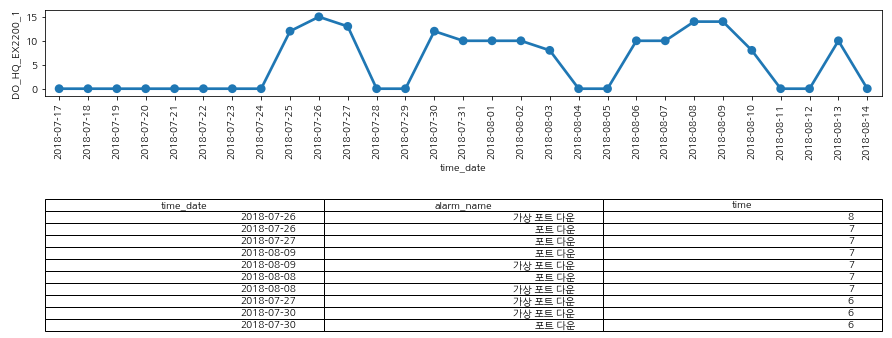

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

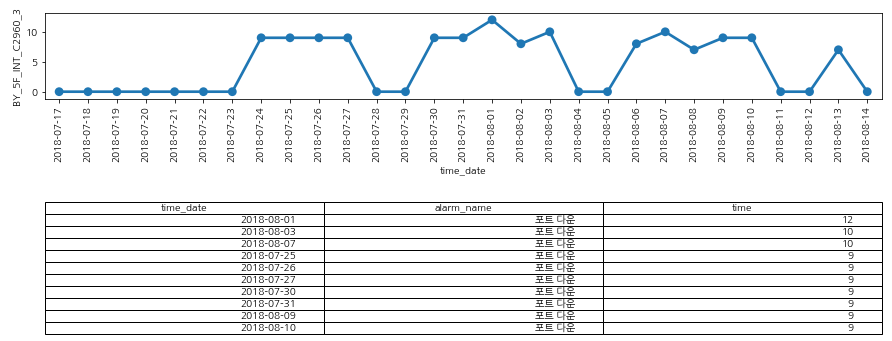

>>>>>>>> BY_INT_7F_C2960_A


<Figure size 432x288 with 0 Axes>

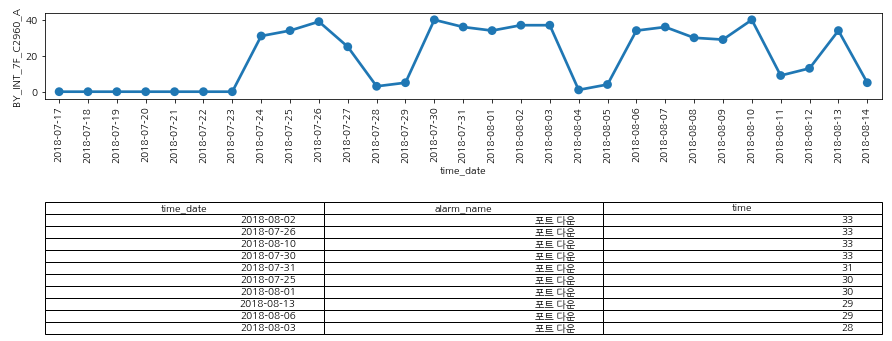

>>>>>>>> BY_2F_INT_EX2200_1


<Figure size 432x288 with 0 Axes>

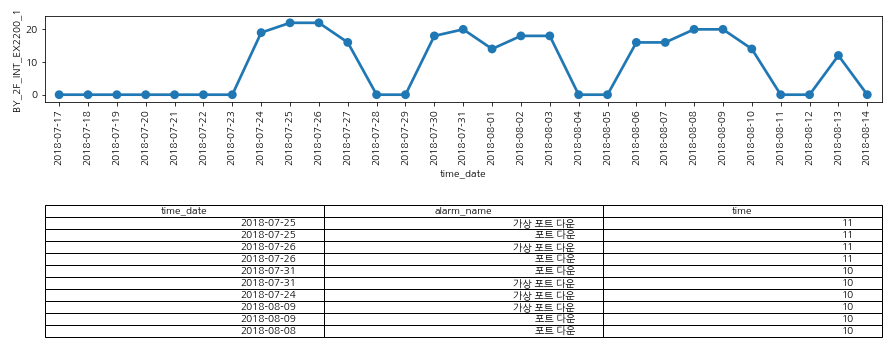

>>>>>>>> BY_6F_EX2200_1


<Figure size 432x288 with 0 Axes>

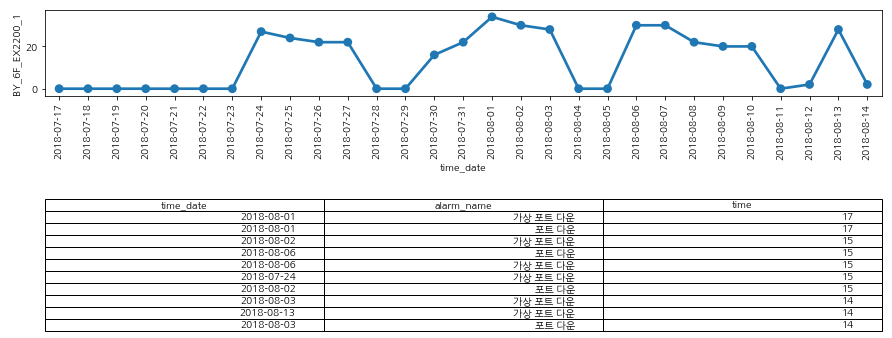

######### ('hfadext01', 'hfapexa01', 'hfapexa02')
>>>>>>>> hfadext01


<Figure size 432x288 with 0 Axes>

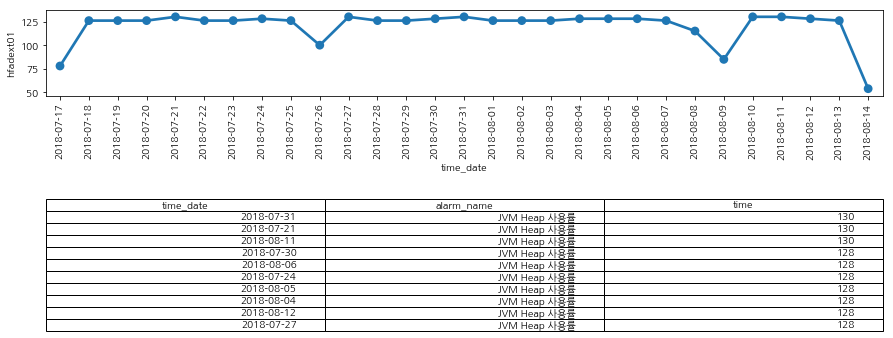

>>>>>>>> hfapexa01


<Figure size 432x288 with 0 Axes>

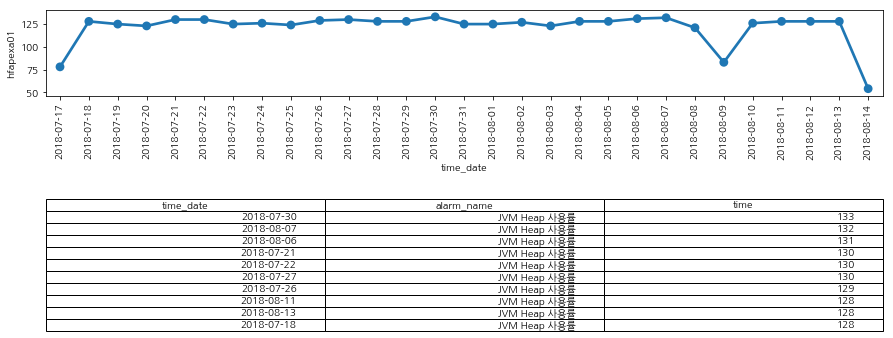

>>>>>>>> hfapexa02


<Figure size 432x288 with 0 Axes>

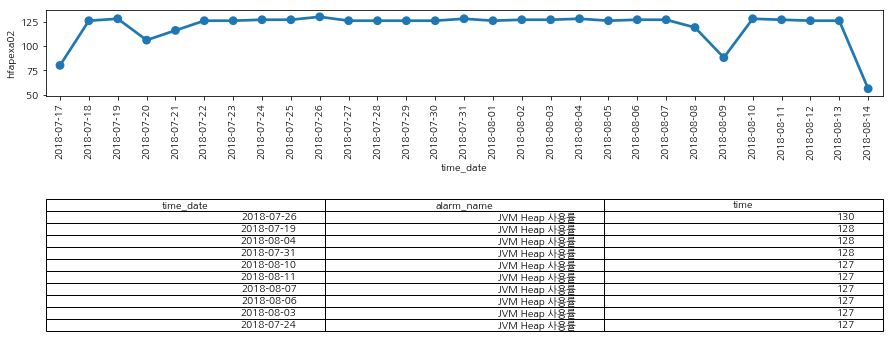

######### ('Internet_EX2200_1', 'DO_HQ_EX2200_1', 'BY_5F_INT_C2960_3', 'BY_6FEX2200_2')
>>>>>>>> Internet_EX2200_1


<Figure size 432x288 with 0 Axes>

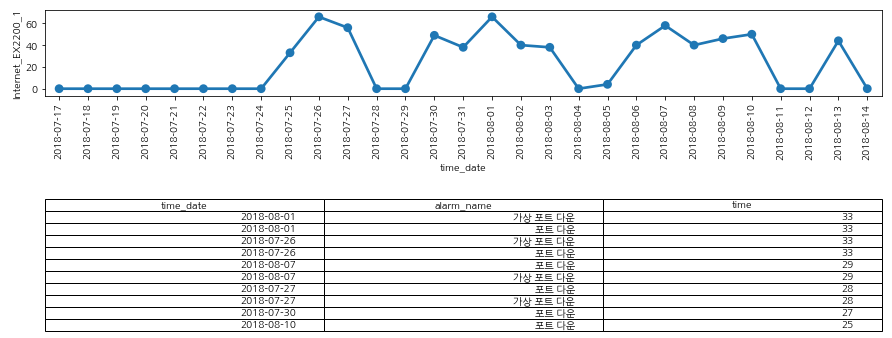

>>>>>>>> DO_HQ_EX2200_1


<Figure size 432x288 with 0 Axes>

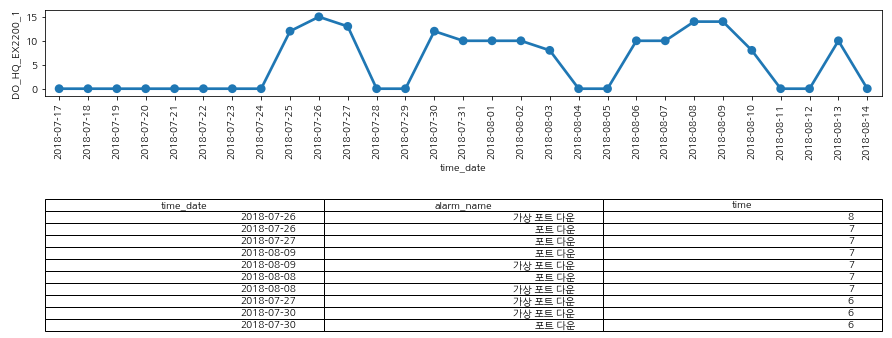

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

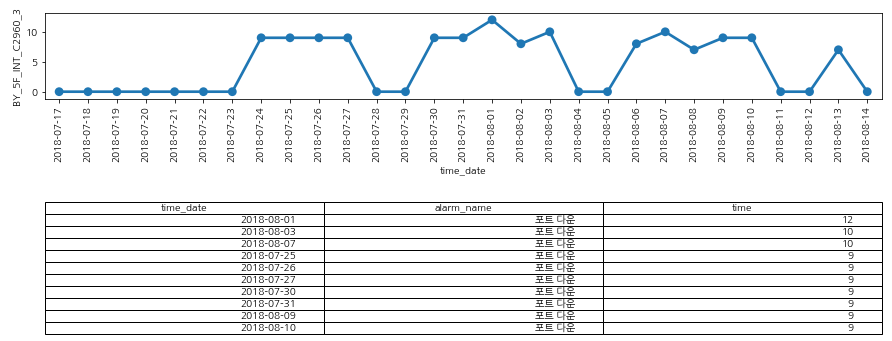

>>>>>>>> BY_6FEX2200_2


<Figure size 432x288 with 0 Axes>

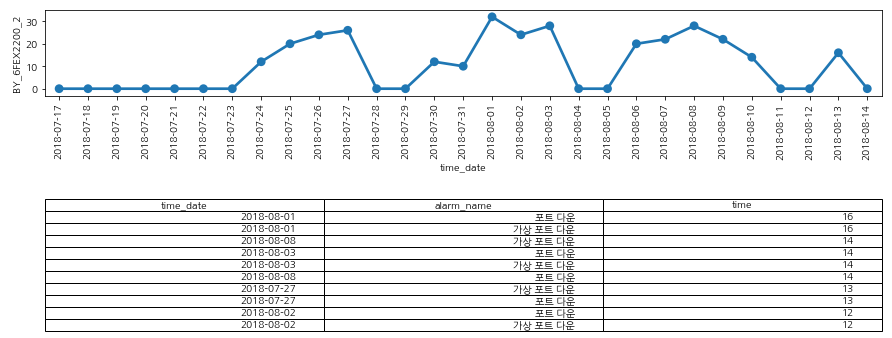

######### ('SIN5F_EX2200-48T_17', 'HKCC-TREC236', 'HF_DLP_LOG', 'TBCC-TREC1')
>>>>>>>> SIN5F_EX2200-48T_17


<Figure size 432x288 with 0 Axes>

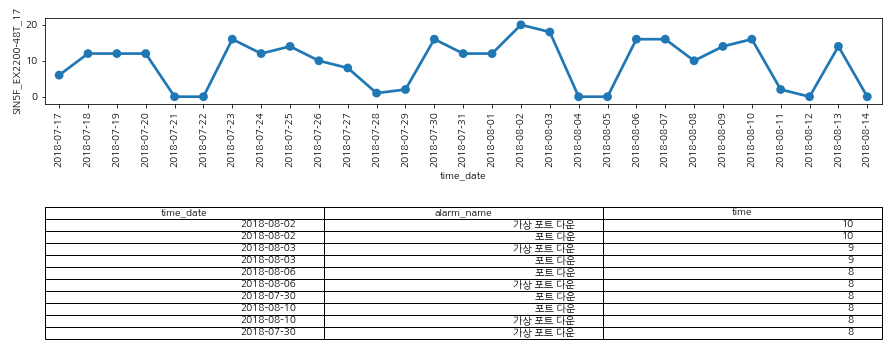

>>>>>>>> HKCC-TREC236


<Figure size 432x288 with 0 Axes>

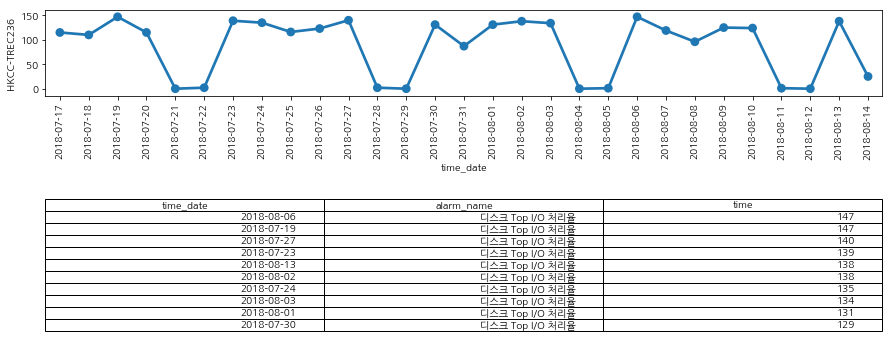

>>>>>>>> HF_DLP_LOG


<Figure size 432x288 with 0 Axes>

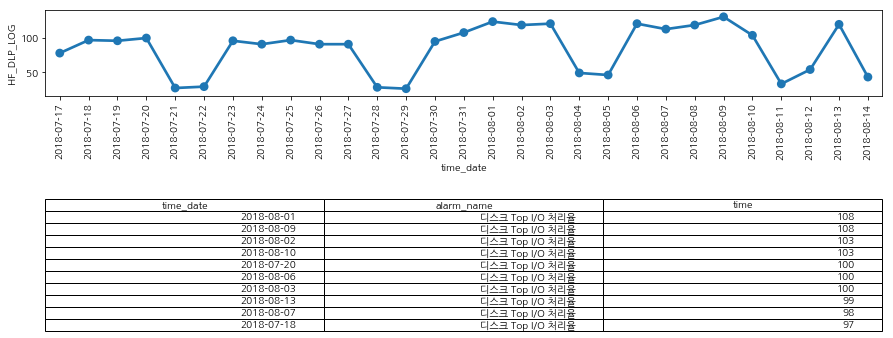

>>>>>>>> TBCC-TREC1


<Figure size 432x288 with 0 Axes>

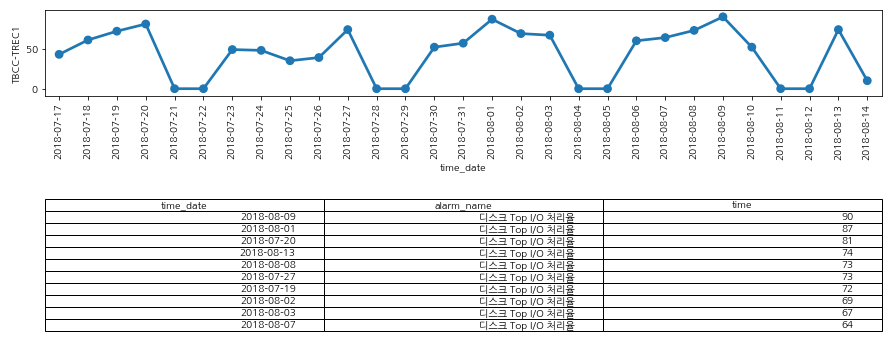

######### ('hlwpmoses18', 'hlwpmoses21', 'hlwpmoses19')
>>>>>>>> hlwpmoses18


<Figure size 432x288 with 0 Axes>

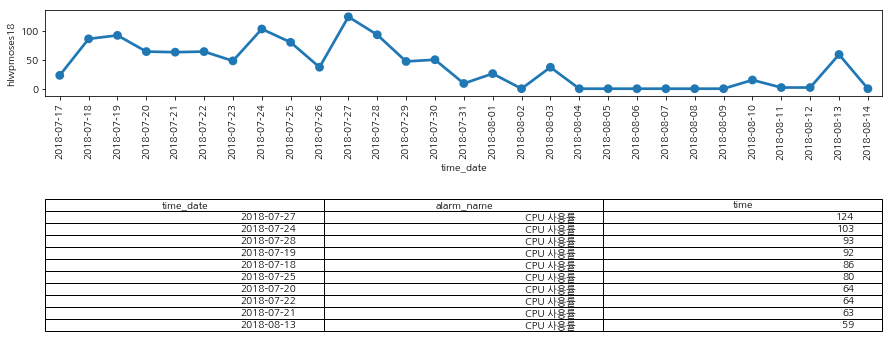

>>>>>>>> hlwpmoses21


<Figure size 432x288 with 0 Axes>

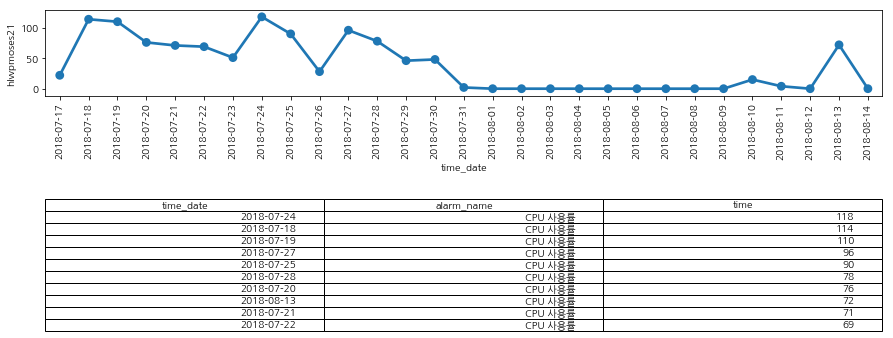

>>>>>>>> hlwpmoses19


<Figure size 432x288 with 0 Axes>

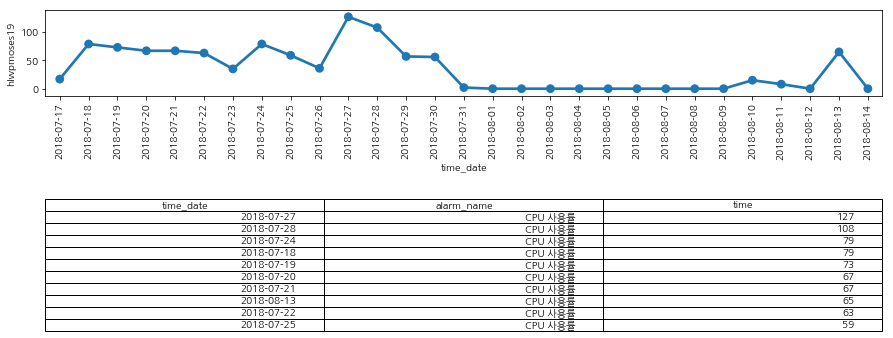

######### ('HKCC-TREC234', 'HKCC-TREC236')
>>>>>>>> HKCC-TREC234


<Figure size 432x288 with 0 Axes>

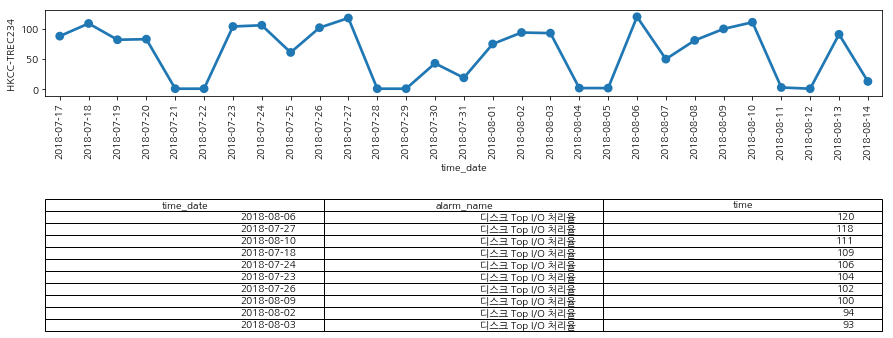

>>>>>>>> HKCC-TREC236


<Figure size 432x288 with 0 Axes>

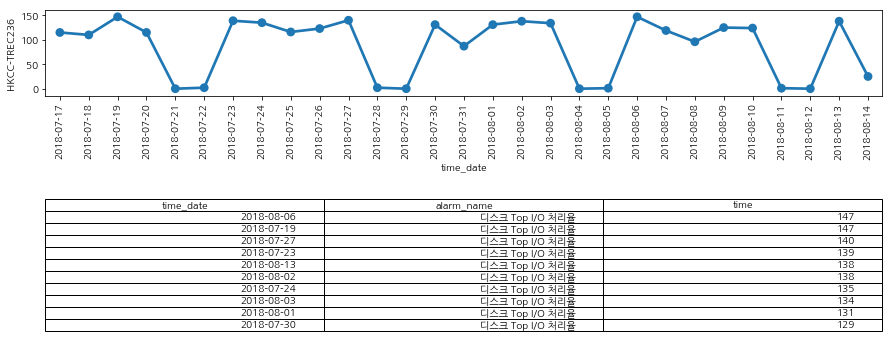

######### ('Internet_EX2200_1', 'DO_HQ_EX2200_1', 'BY_2F_INT_EX2200_1')
>>>>>>>> Internet_EX2200_1


<Figure size 432x288 with 0 Axes>

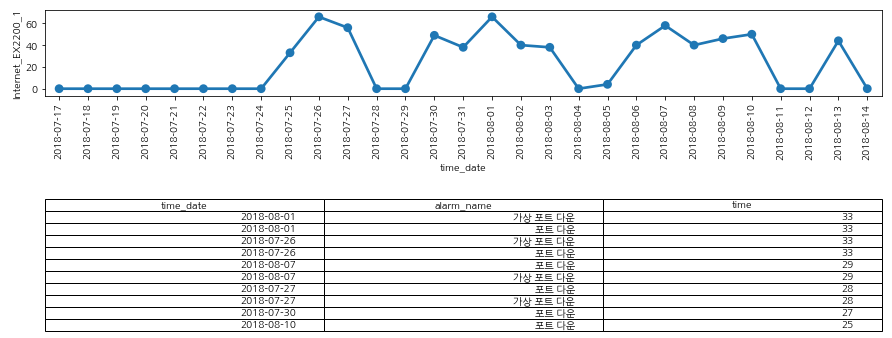

>>>>>>>> DO_HQ_EX2200_1


<Figure size 432x288 with 0 Axes>

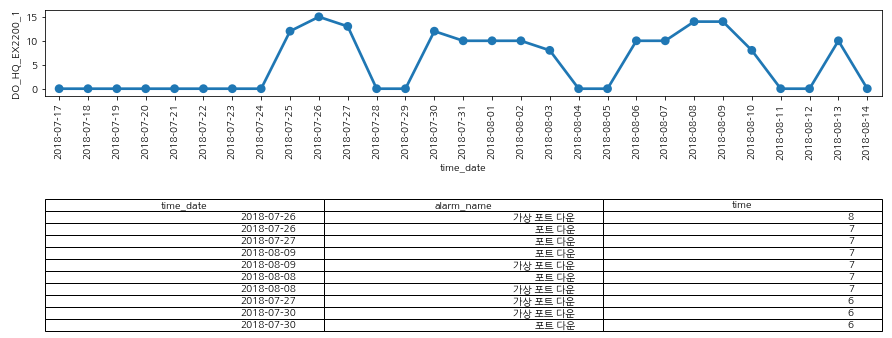

>>>>>>>> BY_2F_INT_EX2200_1


<Figure size 432x288 with 0 Axes>

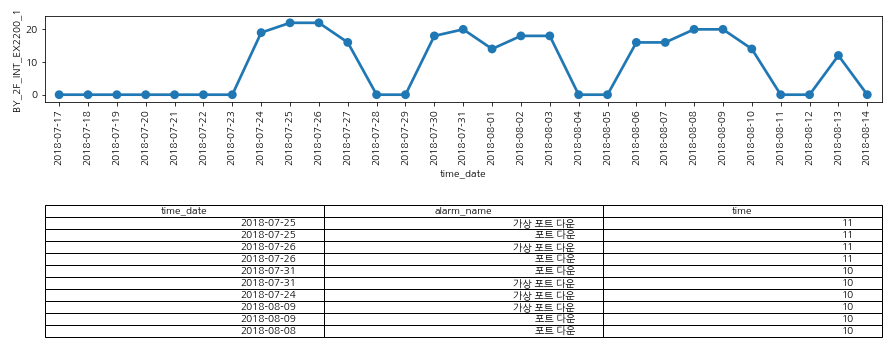

######### ('hlwpmoses26', 'hlwpmoses21', 'hlwpmoses20')
>>>>>>>> hlwpmoses26


<Figure size 432x288 with 0 Axes>

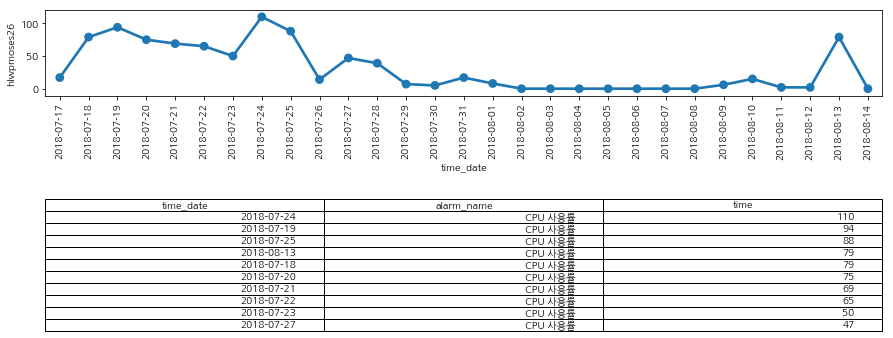

>>>>>>>> hlwpmoses21


<Figure size 432x288 with 0 Axes>

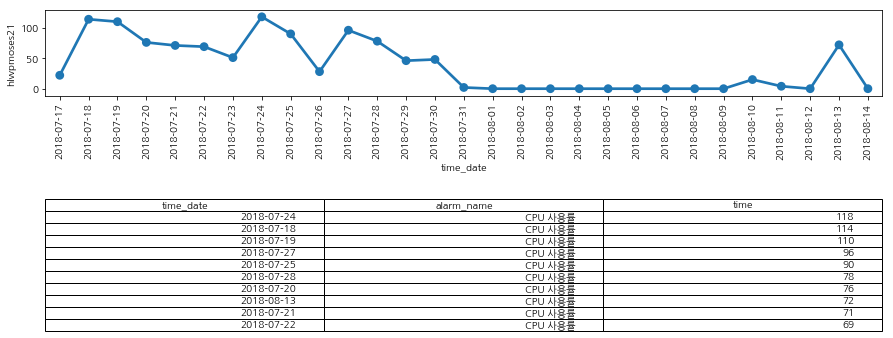

>>>>>>>> hlwpmoses20


<Figure size 432x288 with 0 Axes>

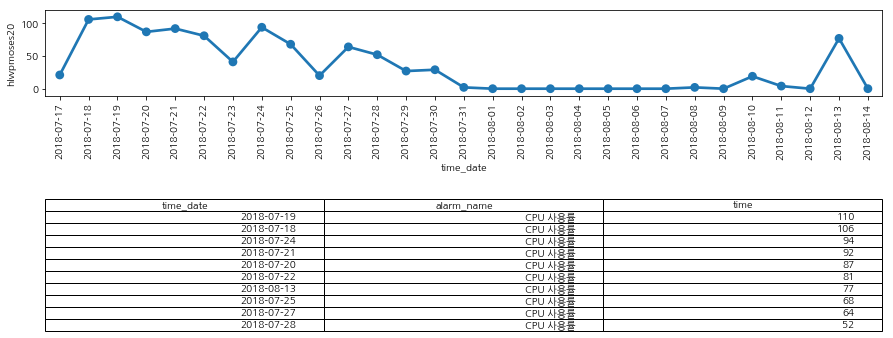

######### ('sntmoweb01', 'sntmoweb02')
>>>>>>>> sntmoweb01


<Figure size 432x288 with 0 Axes>

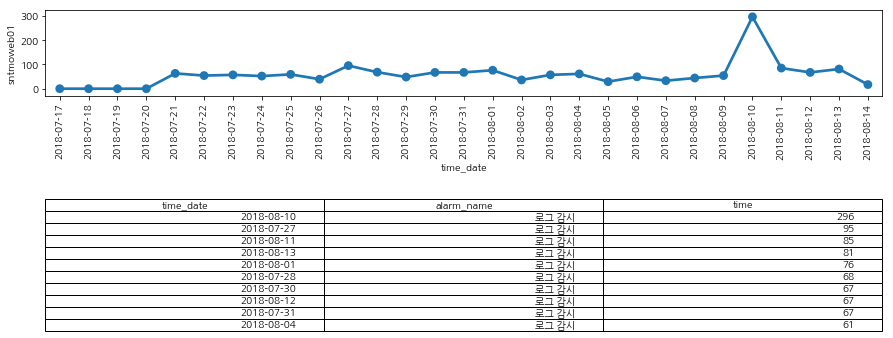

>>>>>>>> sntmoweb02


<Figure size 432x288 with 0 Axes>

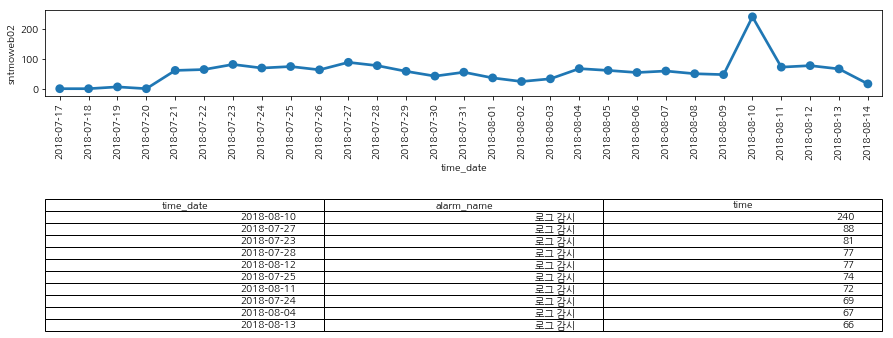

######### ('tslpemsap04', 'tslpemsap03', 'tslpemsap05', 'tslpemsap01')
>>>>>>>> tslpemsap04


<Figure size 432x288 with 0 Axes>

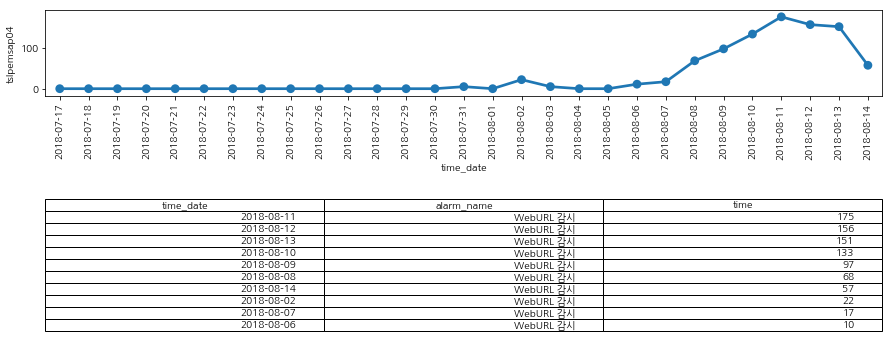

>>>>>>>> tslpemsap03


<Figure size 432x288 with 0 Axes>

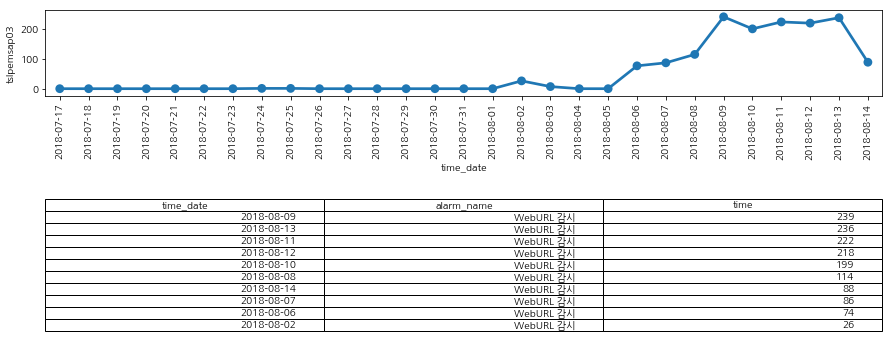

>>>>>>>> tslpemsap05


<Figure size 432x288 with 0 Axes>

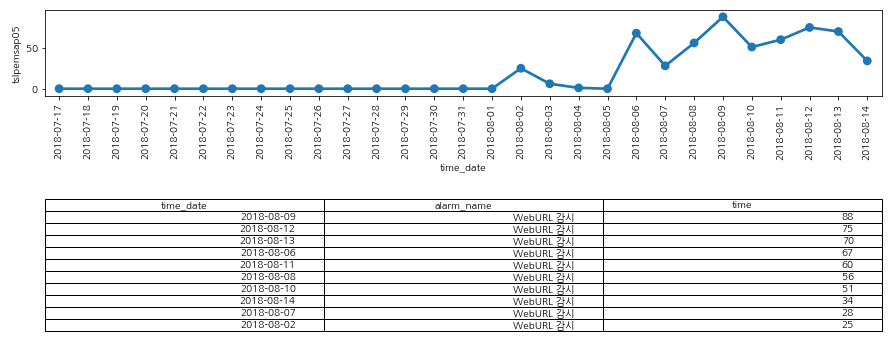

>>>>>>>> tslpemsap01


<Figure size 432x288 with 0 Axes>

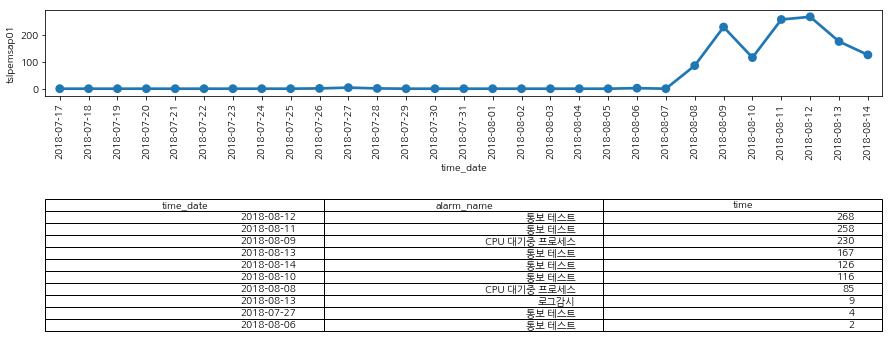

######### ('BY_5F_INT_C2960_3', 'BY_5F_INT_C2960_4', 'BY_INT_7F_C2960_A')
>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

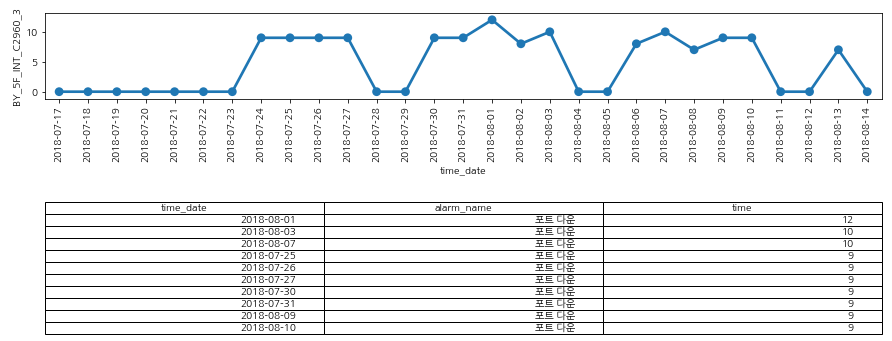

>>>>>>>> BY_5F_INT_C2960_4


<Figure size 432x288 with 0 Axes>

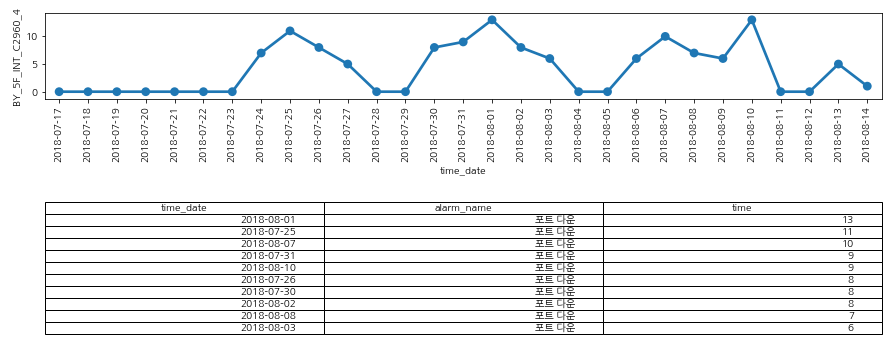

>>>>>>>> BY_INT_7F_C2960_A


<Figure size 432x288 with 0 Axes>

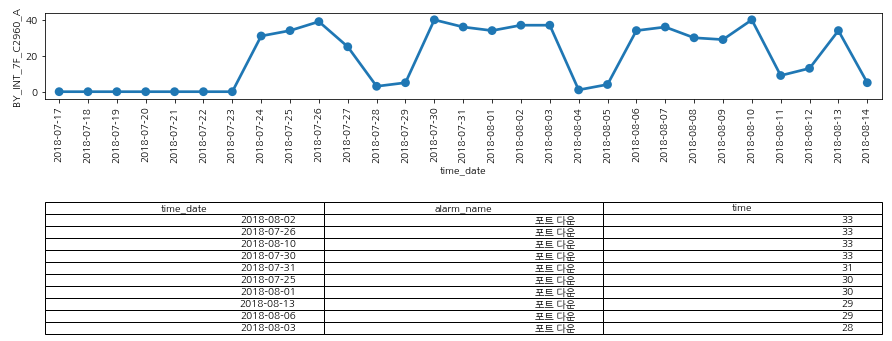

######### ('BY_6F_EX2200_1', 'BY_6F_INT_EX2200_3', 'BY_5F_INT_C2960_3', 'BY_6FEX2200_2')
>>>>>>>> BY_6F_EX2200_1


<Figure size 432x288 with 0 Axes>

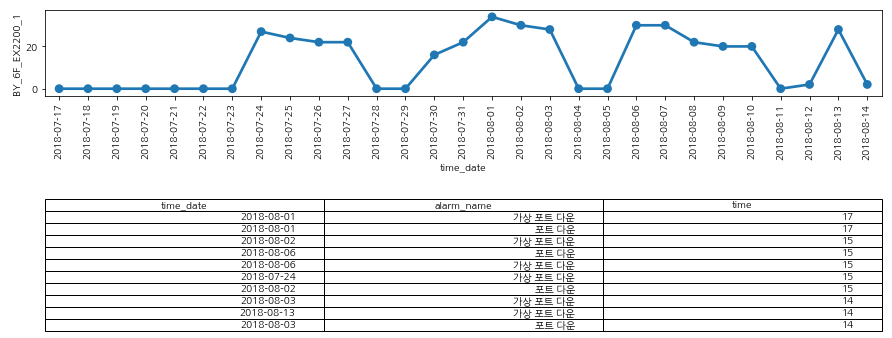

>>>>>>>> BY_6F_INT_EX2200_3


<Figure size 432x288 with 0 Axes>

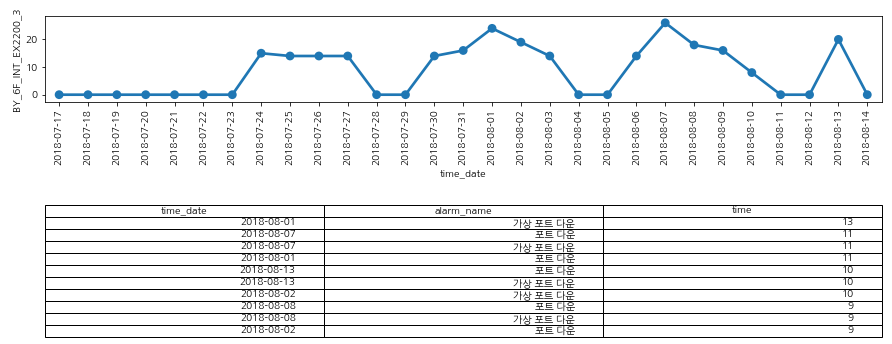

>>>>>>>> BY_5F_INT_C2960_3


<Figure size 432x288 with 0 Axes>

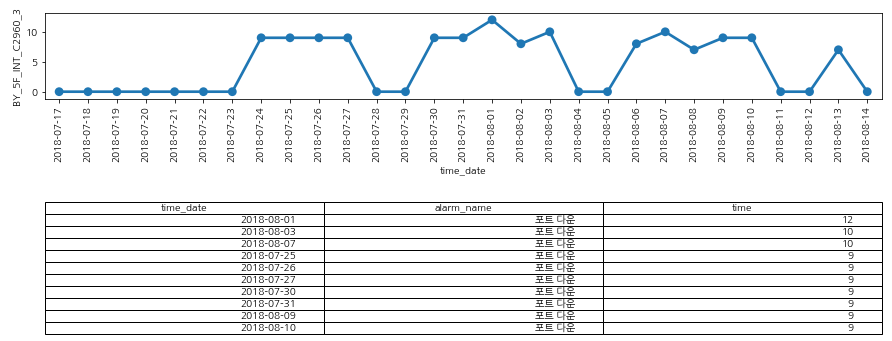

>>>>>>>> BY_6FEX2200_2


<Figure size 432x288 with 0 Axes>

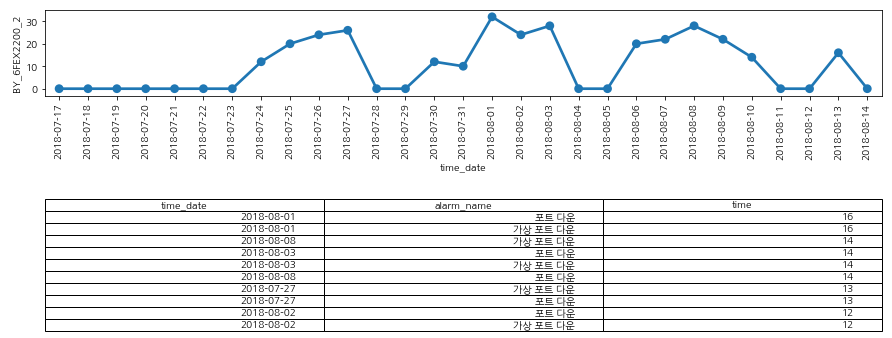

######### ('SVR-DRM1', 'almwhite')
>>>>>>>> SVR-DRM1


<Figure size 432x288 with 0 Axes>

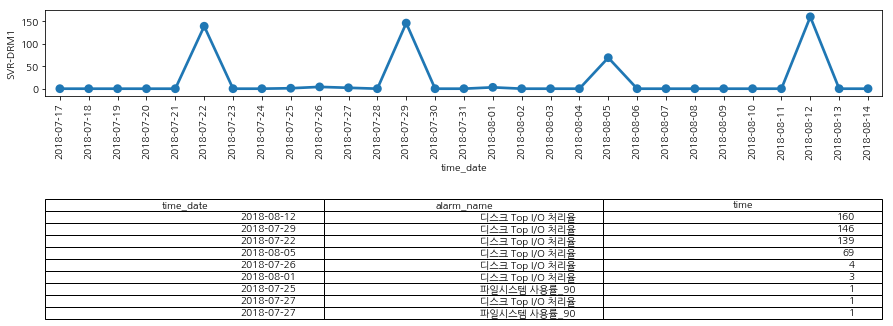

>>>>>>>> almwhite


<Figure size 432x288 with 0 Axes>

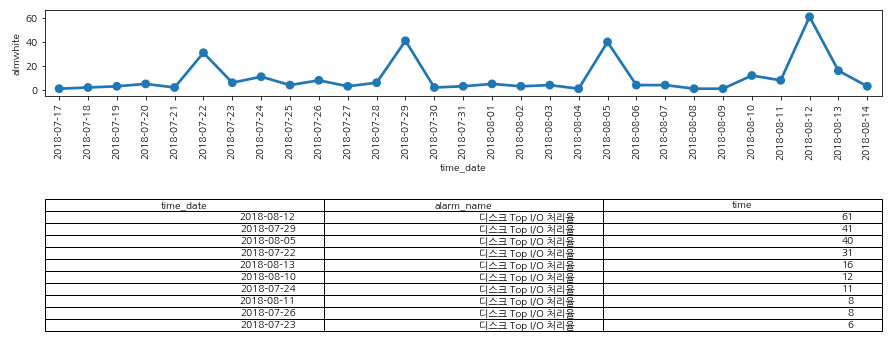

######### ('HKTM-TREC177', 'HKCC-TREC235', 'HKCC-TREC232')
>>>>>>>> HKTM-TREC177


<Figure size 432x288 with 0 Axes>

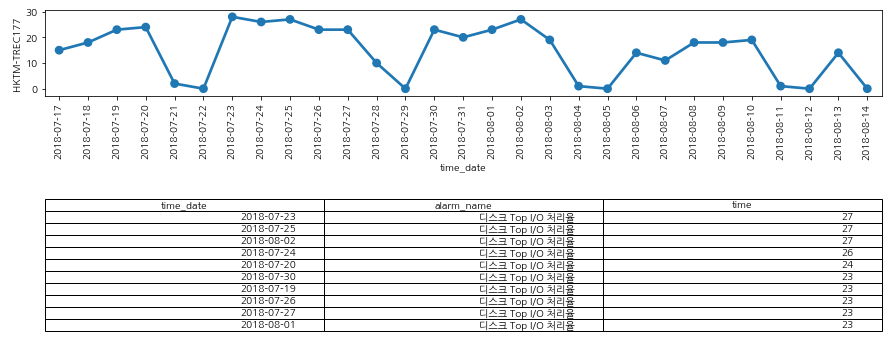

>>>>>>>> HKCC-TREC235


<Figure size 432x288 with 0 Axes>

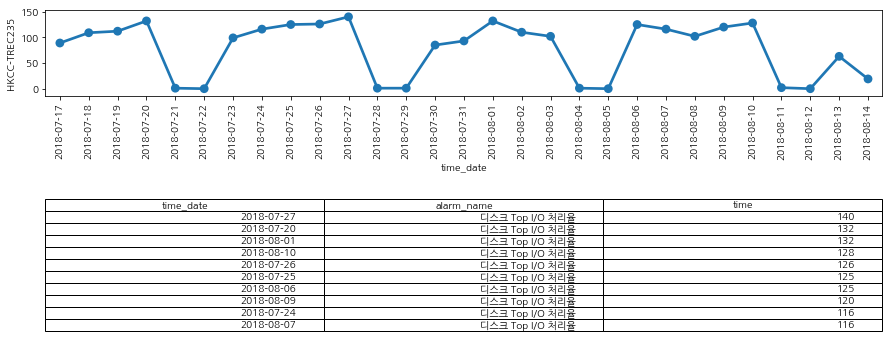

>>>>>>>> HKCC-TREC232


<Figure size 432x288 with 0 Axes>

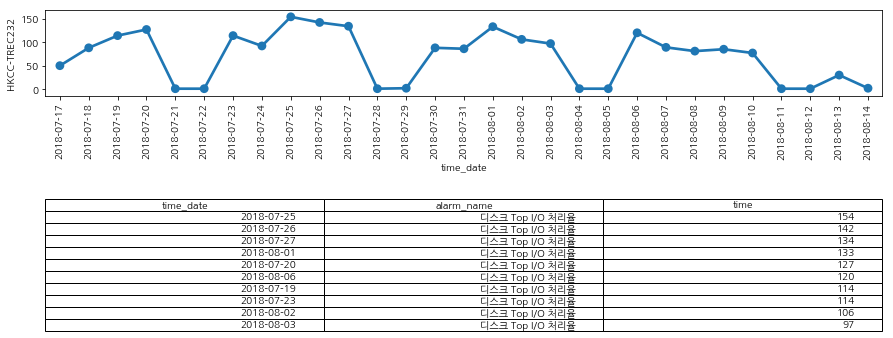

######### ('hfhrcca2', 'sntcodb02', 'hllplinkdb02', 'hllplinkdb01')
>>>>>>>> hfhrcca2


<Figure size 432x288 with 0 Axes>

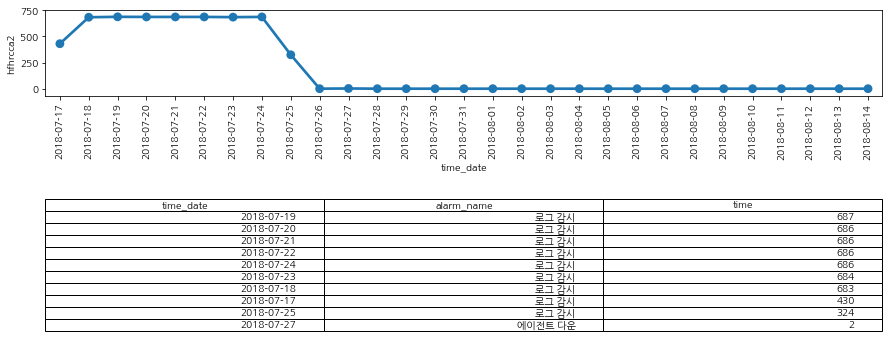

>>>>>>>> sntcodb02


<Figure size 432x288 with 0 Axes>

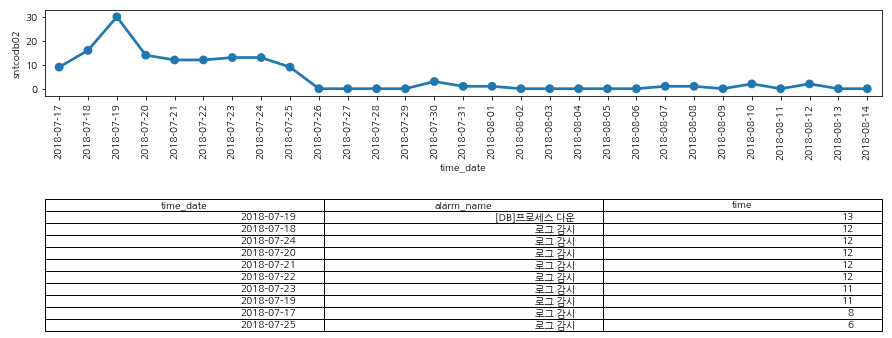

>>>>>>>> hllplinkdb02


<Figure size 432x288 with 0 Axes>

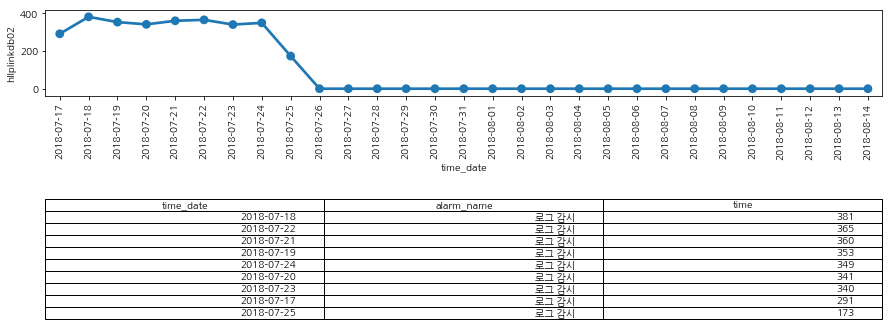

>>>>>>>> hllplinkdb01


<Figure size 432x288 with 0 Axes>

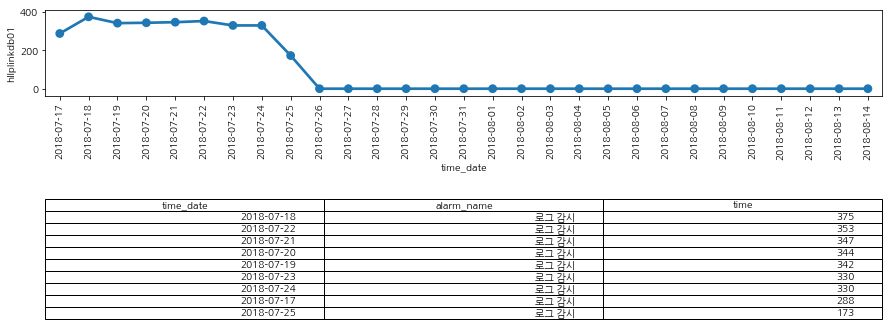

######### ('TBCC-TREC1', 'TBCC-TREC4')
>>>>>>>> TBCC-TREC1


<Figure size 432x288 with 0 Axes>

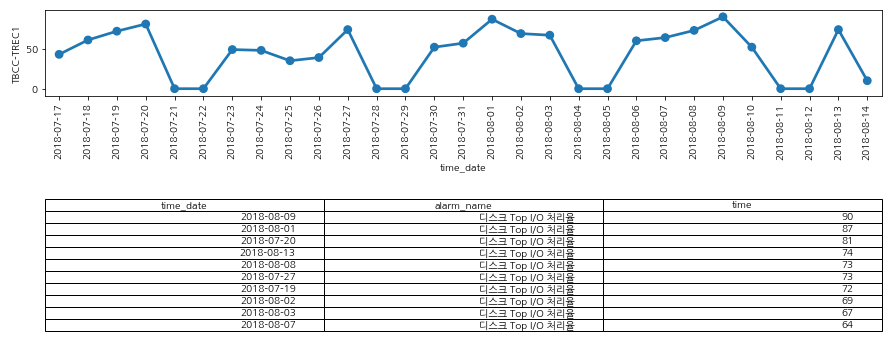

>>>>>>>> TBCC-TREC4


<Figure size 432x288 with 0 Axes>

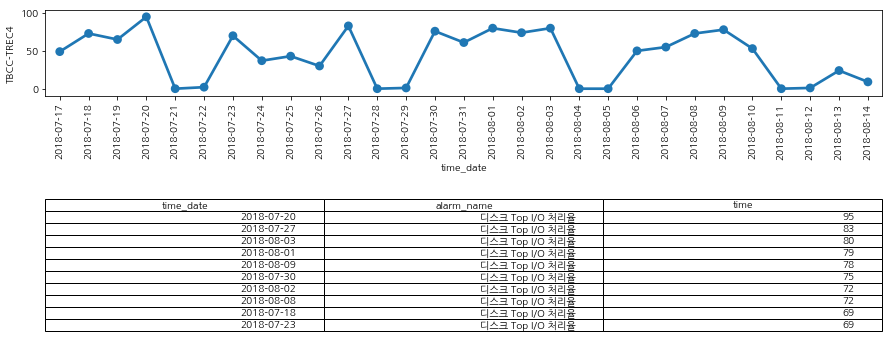

######### ('tslpemsap04', 'tslpemsap03', 'tslpemsap01')
>>>>>>>> tslpemsap04


<Figure size 432x288 with 0 Axes>

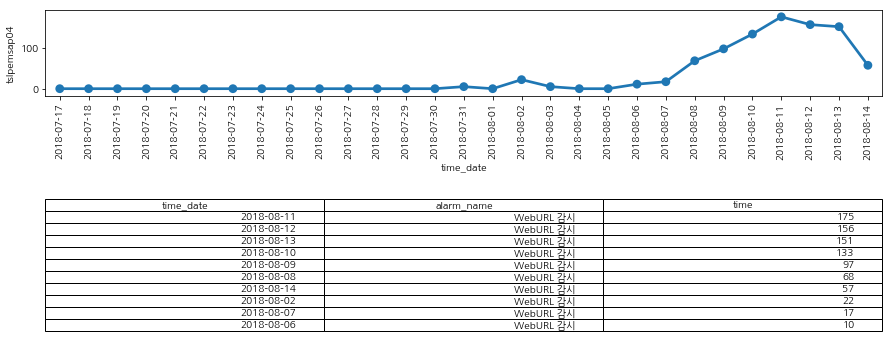

>>>>>>>> tslpemsap03


<Figure size 432x288 with 0 Axes>

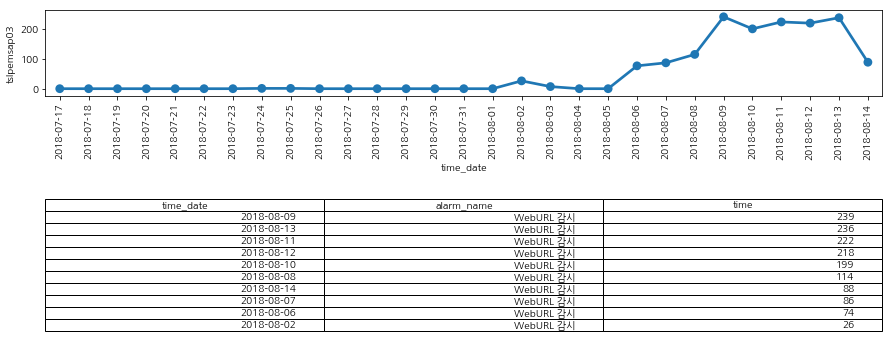

>>>>>>>> tslpemsap01


<Figure size 432x288 with 0 Axes>

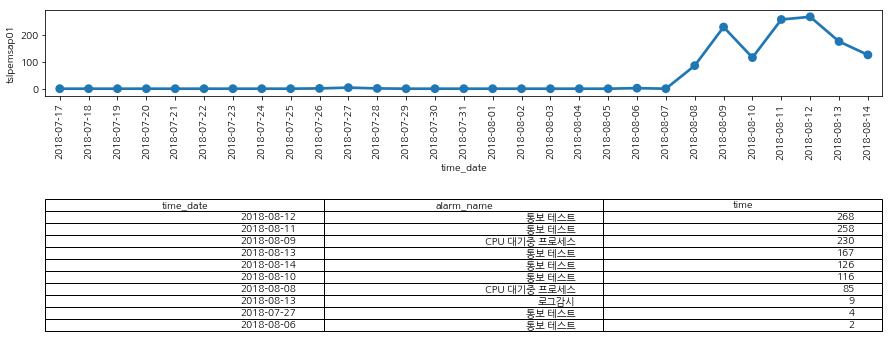

######### ('hlwpmoses04', 'hlwpmoses05')
>>>>>>>> hlwpmoses04


<Figure size 432x288 with 0 Axes>

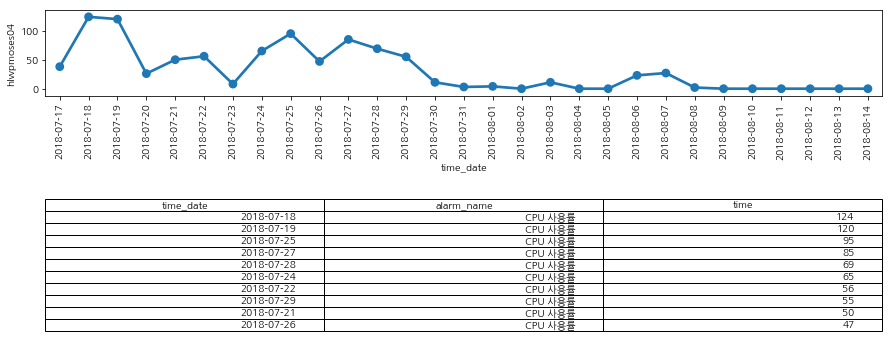

>>>>>>>> hlwpmoses05


<Figure size 432x288 with 0 Axes>

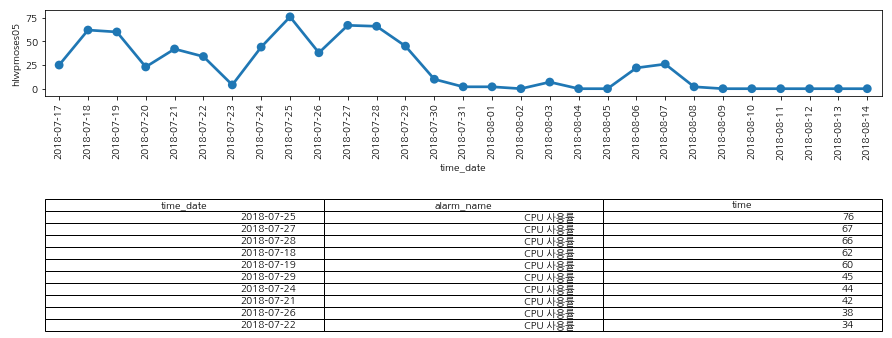

######### ('HK_SIN2F_C2950G', 'HK_SIN2F_C2950_3')
>>>>>>>> HK_SIN2F_C2950G


<Figure size 432x288 with 0 Axes>

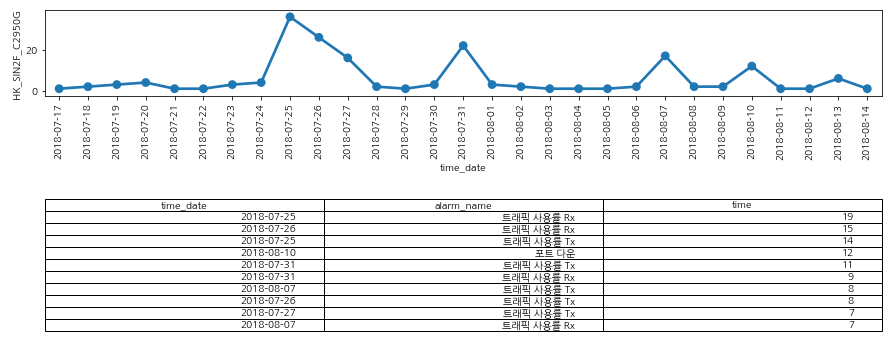

>>>>>>>> HK_SIN2F_C2950_3


<Figure size 432x288 with 0 Axes>

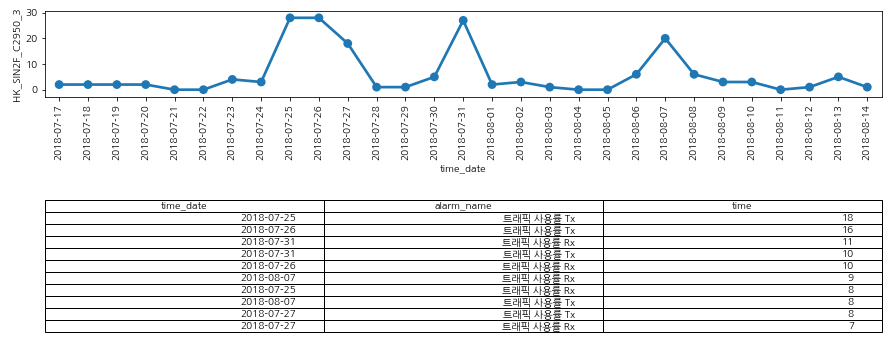

######### ('hlwpmoses11', 'hlwpmoses06', 'hlwpmoses12', 'hlwpmoses07', 'hlwpmoses13')
>>>>>>>> hlwpmoses11


<Figure size 432x288 with 0 Axes>

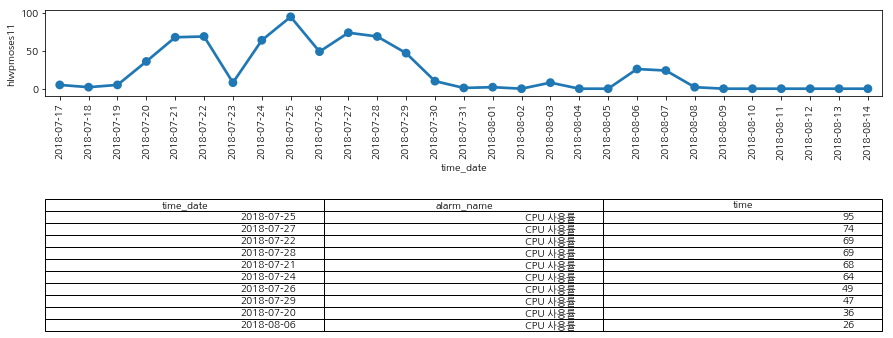

>>>>>>>> hlwpmoses06


<Figure size 432x288 with 0 Axes>

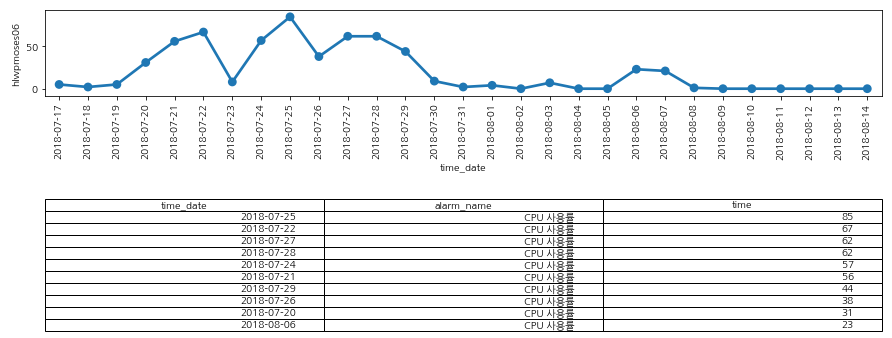

>>>>>>>> hlwpmoses12


<Figure size 432x288 with 0 Axes>

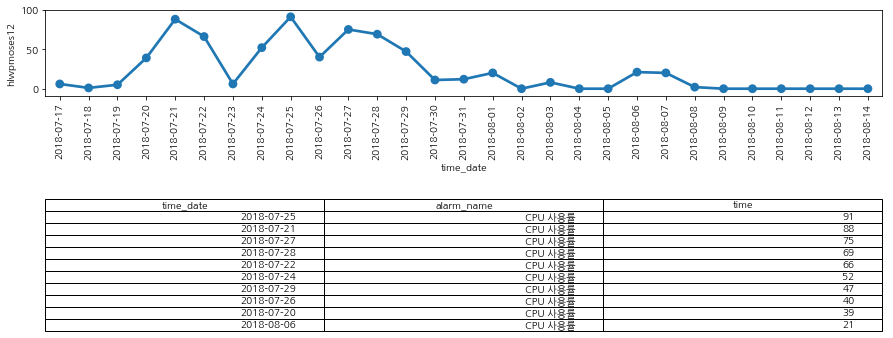

>>>>>>>> hlwpmoses07


<Figure size 432x288 with 0 Axes>

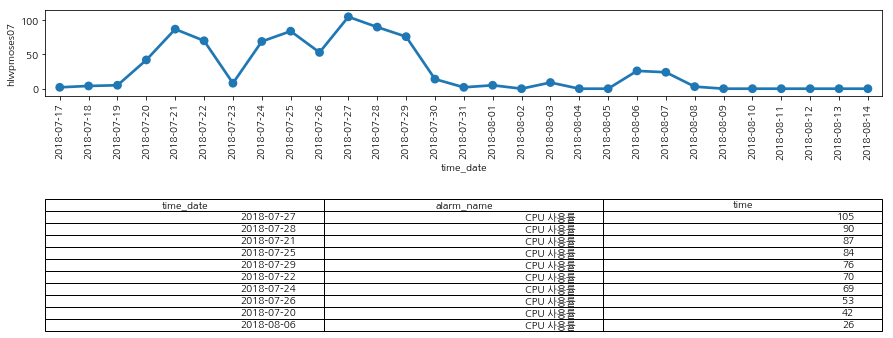

>>>>>>>> hlwpmoses13


<Figure size 432x288 with 0 Axes>

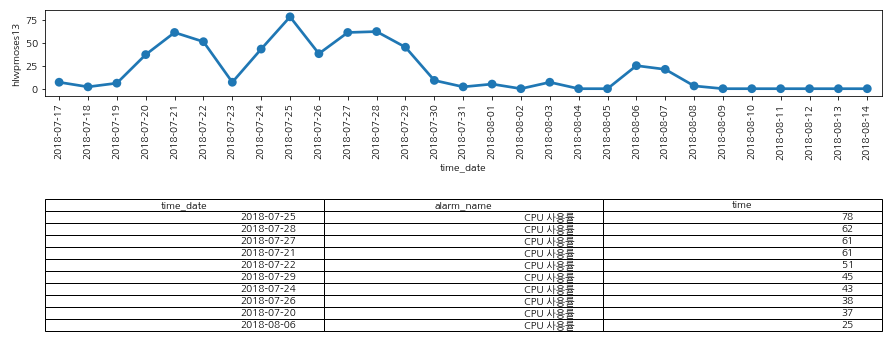

######### ('tbct-main', 'tsgwap')
>>>>>>>> tbct-main


<Figure size 432x288 with 0 Axes>

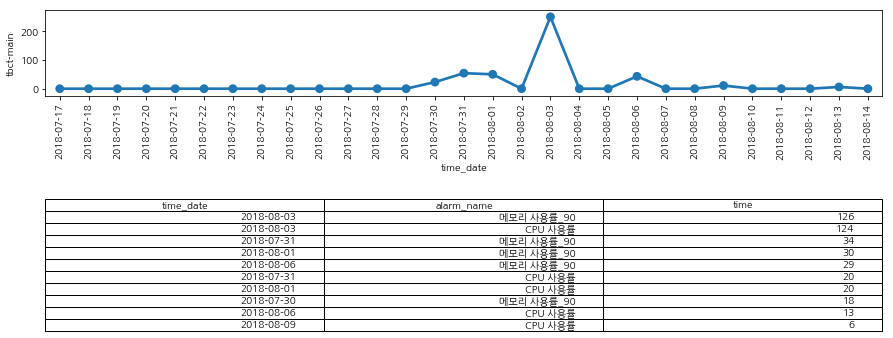

>>>>>>>> tsgwap


<Figure size 432x288 with 0 Axes>

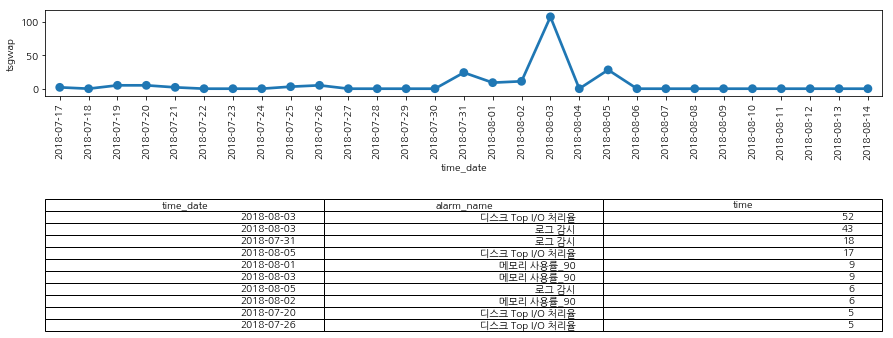

######### ('HKTM-TREC171', 'HKTM-TREC177', 'HKCC-TREC232')
>>>>>>>> HKTM-TREC171


<Figure size 432x288 with 0 Axes>

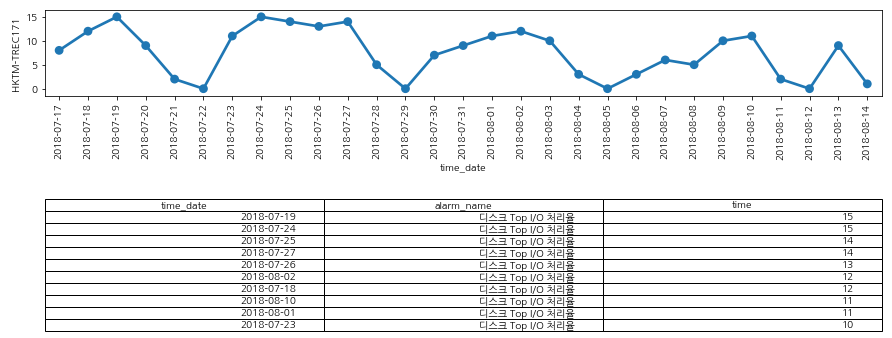

>>>>>>>> HKTM-TREC177


<Figure size 432x288 with 0 Axes>

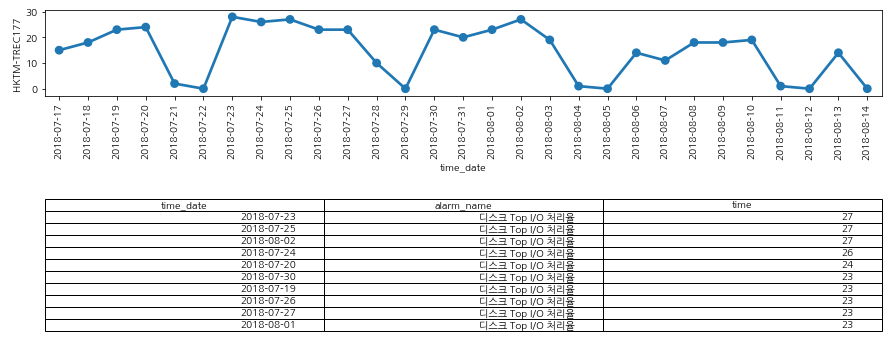

>>>>>>>> HKCC-TREC232


<Figure size 432x288 with 0 Axes>

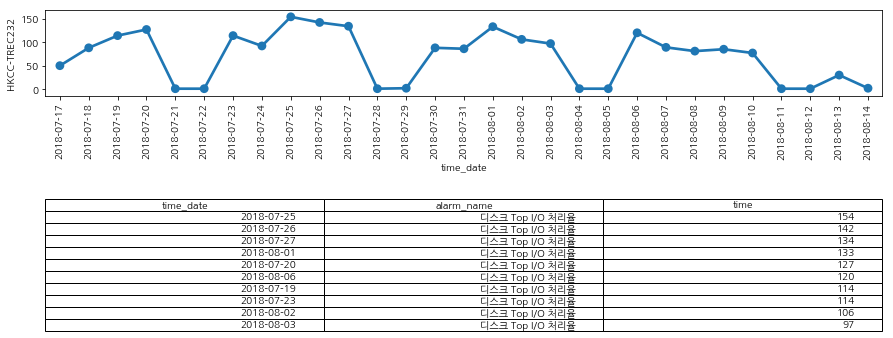

######### ('hllpsecms01', 'hludfrdb')
>>>>>>>> hllpsecms01


<Figure size 432x288 with 0 Axes>

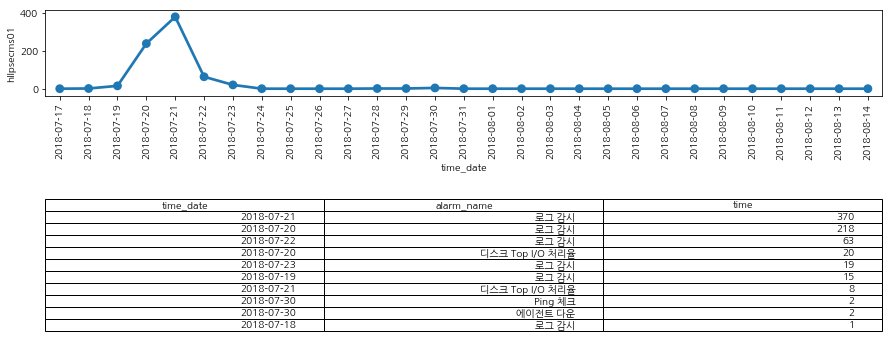

>>>>>>>> hludfrdb


<Figure size 432x288 with 0 Axes>

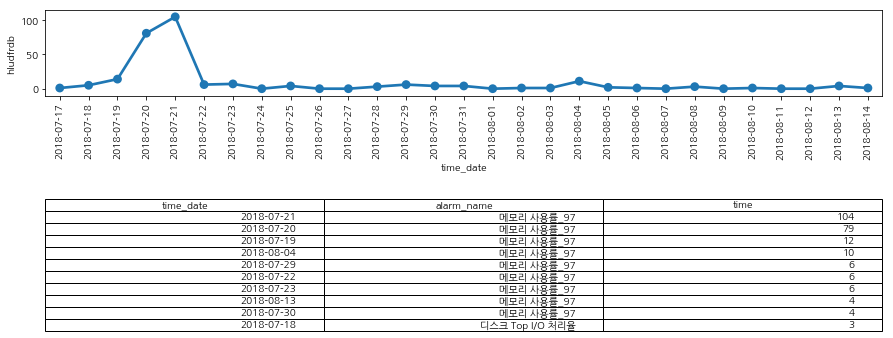

######### ('hlwpmoses18', 'hlwpmoses21', 'hlwpmoses19', 'hlwpmoses26', 'hlwpmoses20')
>>>>>>>> hlwpmoses18


<Figure size 432x288 with 0 Axes>

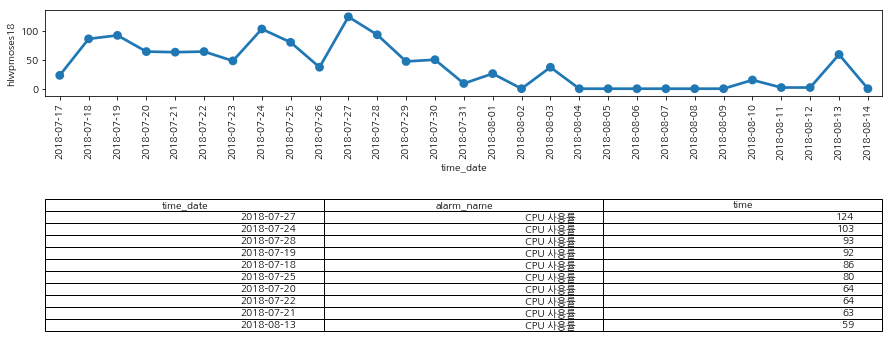

>>>>>>>> hlwpmoses21


<Figure size 432x288 with 0 Axes>

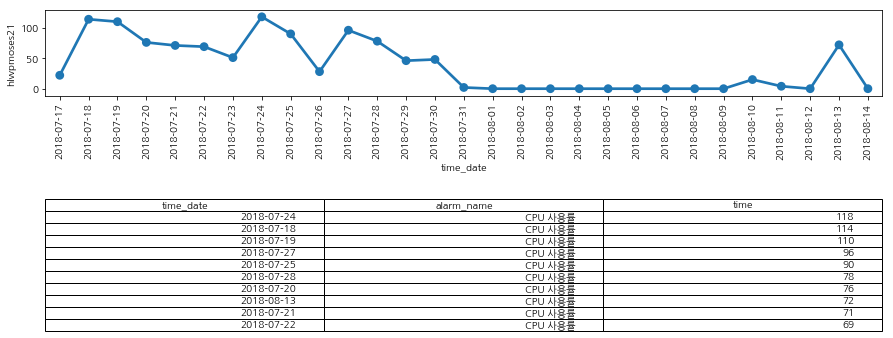

>>>>>>>> hlwpmoses19


<Figure size 432x288 with 0 Axes>

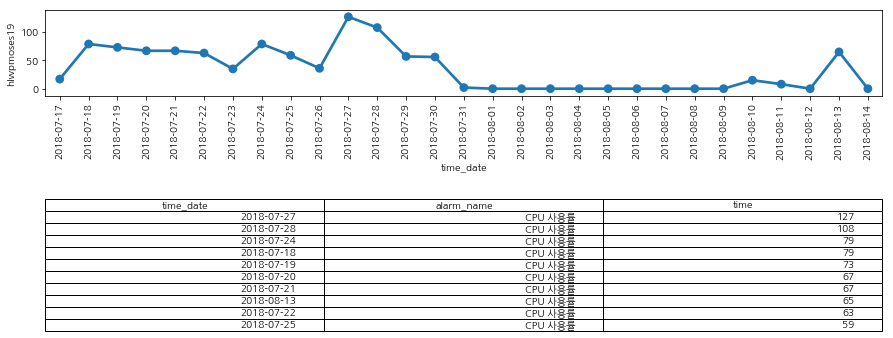

>>>>>>>> hlwpmoses26


<Figure size 432x288 with 0 Axes>

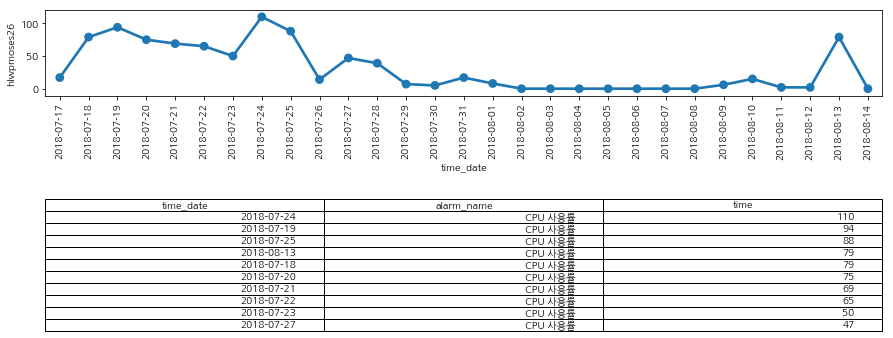

>>>>>>>> hlwpmoses20


<Figure size 432x288 with 0 Axes>

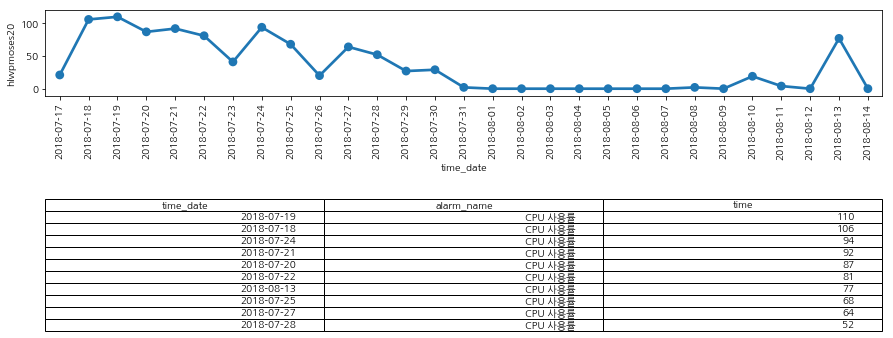

######### ('HKTM-TREC171', 'HKTM-TREC177', 'HKTM-TREC172')
>>>>>>>> HKTM-TREC171


<Figure size 432x288 with 0 Axes>

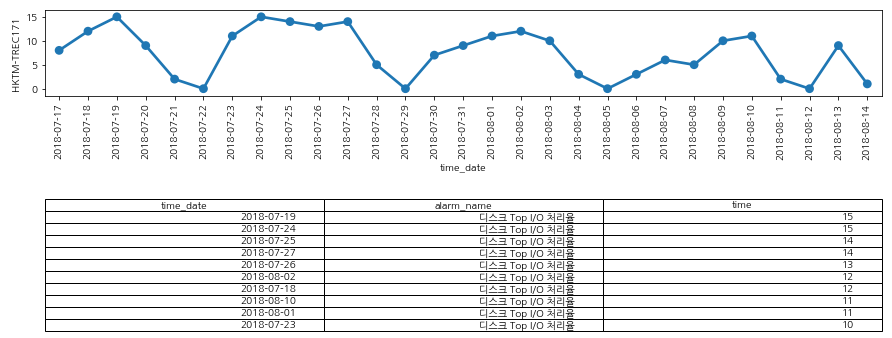

>>>>>>>> HKTM-TREC177


<Figure size 432x288 with 0 Axes>

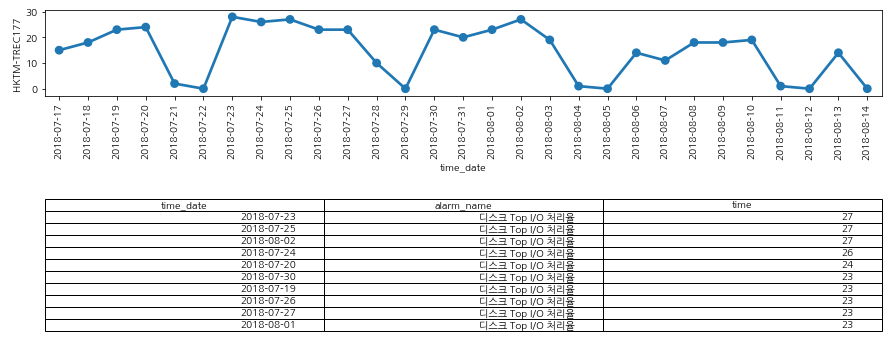

>>>>>>>> HKTM-TREC172


<Figure size 432x288 with 0 Axes>

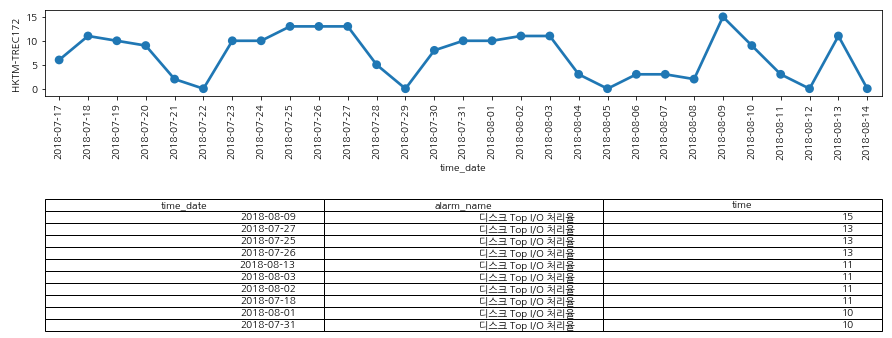

######### ('TBCC-TREC3', 'HKCC-TREC235')
>>>>>>>> TBCC-TREC3


<Figure size 432x288 with 0 Axes>

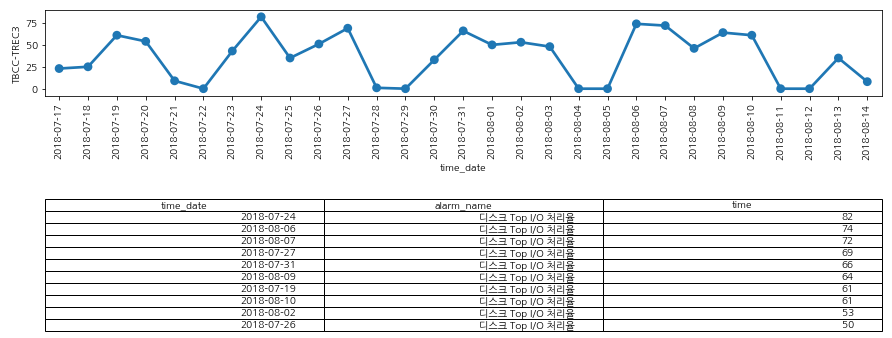

>>>>>>>> HKCC-TREC235


<Figure size 432x288 with 0 Axes>

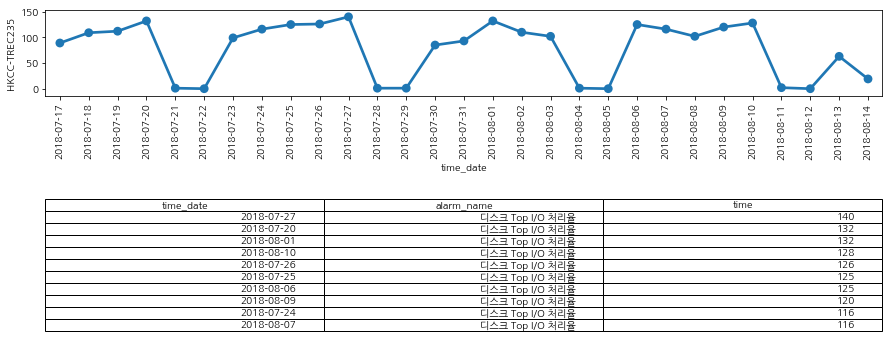

######### ('SIN5F_EX2200-48T_17', 'HKCC-TREC234', 'HFEU-TREC234', 'HKCC-TREC236', 'TBCC-TREC1', 'HKCC-TREC231', 'thpina01', 'HKCC-TREC235', 'HF_DLP_LOG')
>>>>>>>> SIN5F_EX2200-48T_17


<Figure size 432x288 with 0 Axes>

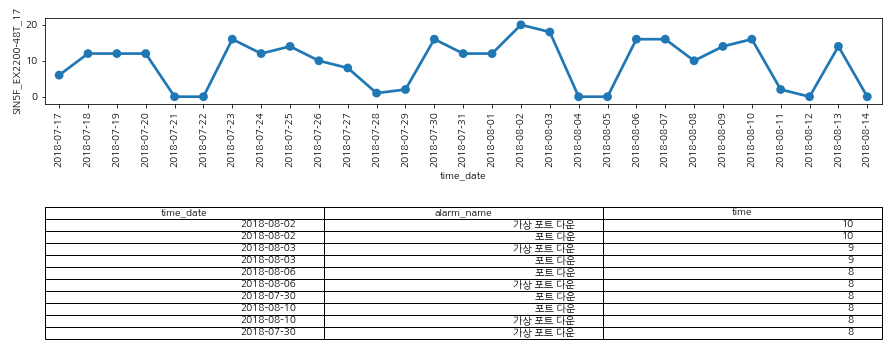

>>>>>>>> HKCC-TREC234


<Figure size 432x288 with 0 Axes>

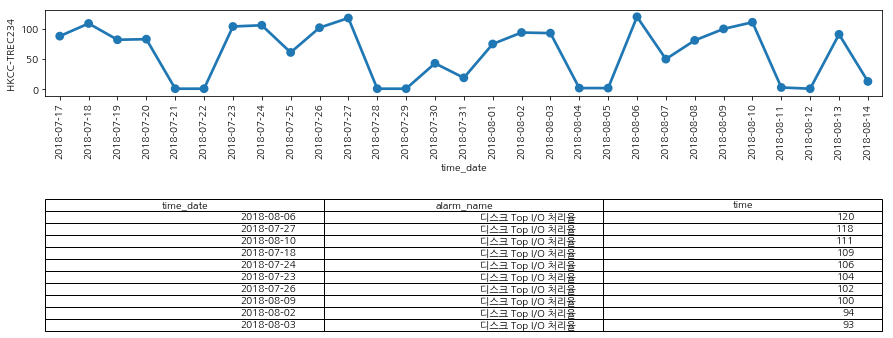

>>>>>>>> HFEU-TREC234


<Figure size 432x288 with 0 Axes>

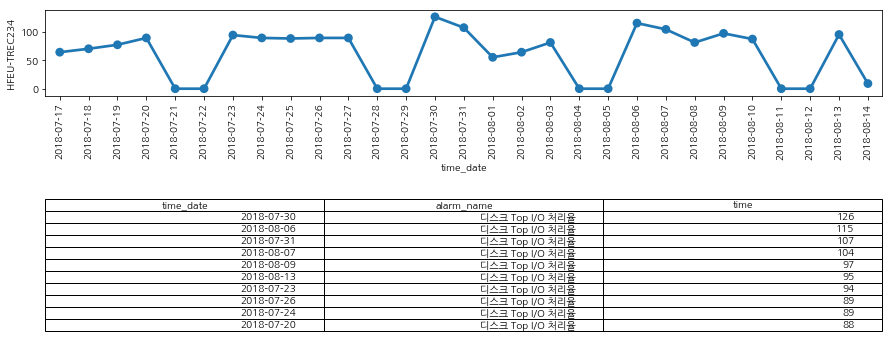

>>>>>>>> HKCC-TREC236


<Figure size 432x288 with 0 Axes>

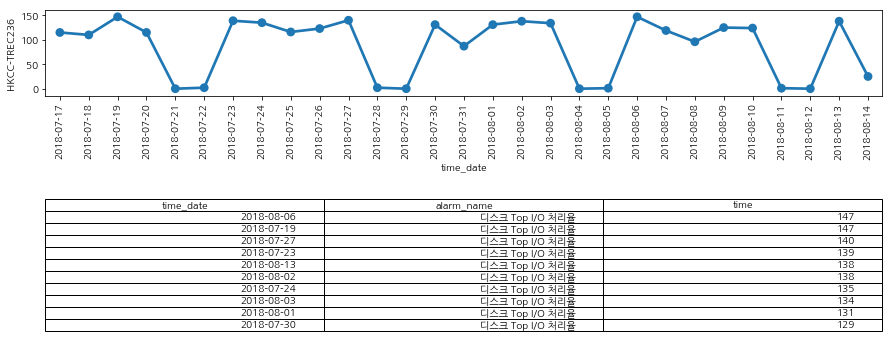

>>>>>>>> TBCC-TREC1


<Figure size 432x288 with 0 Axes>

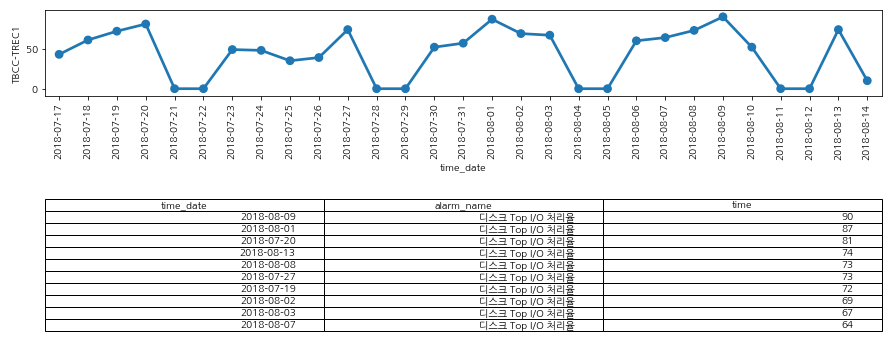

>>>>>>>> HKCC-TREC231


<Figure size 432x288 with 0 Axes>

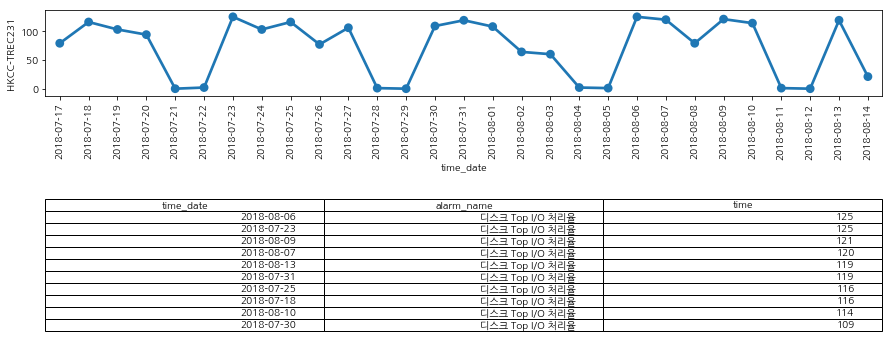

>>>>>>>> thpina01


<Figure size 432x288 with 0 Axes>

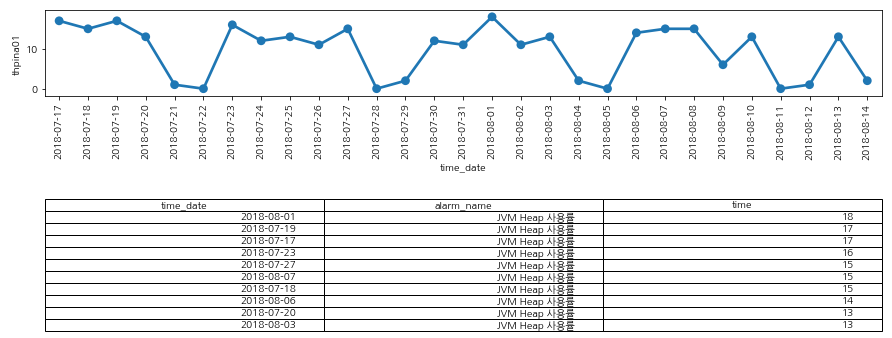

>>>>>>>> HKCC-TREC235


<Figure size 432x288 with 0 Axes>

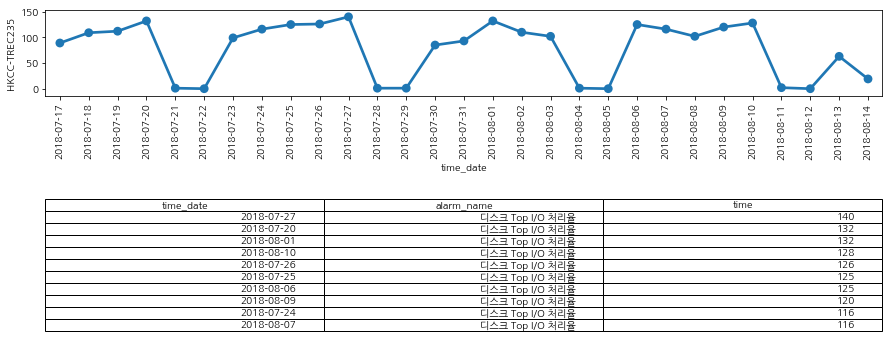

>>>>>>>> HF_DLP_LOG


<Figure size 432x288 with 0 Axes>

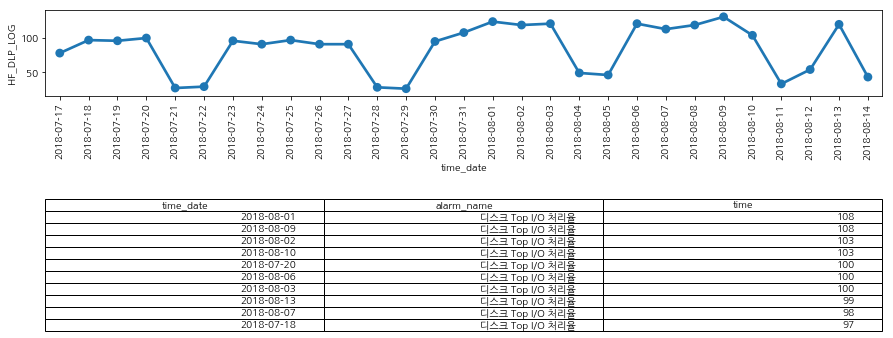

<Figure size 432x288 with 0 Axes>

In [82]:
for cluster in clusters_new:
    print('######### '+ str(cluster))
    for node in cluster:
        print('>>>>>>>> '+node)
        fig = plt.figure(figsize=(15, 7))
        ax1 = fig.add_subplot(2, 1, 1)
        ax2 = fig.add_subplot(2, 1, 2)
        plt.subplots_adjust(top=0.5)
        ax2.axis('off')
        ax2.axis('tight')
        c_nodes = data[data['system_name']==node]
        dataset = c_nodes.groupby(['time_date','alarm_name'])['time'].count().reindex().reset_index().sort_values('time', ascending=False).head(10)
        ax2.table(cellText=dataset.values, colLabels=dataset.columns, loc='bottom')
        plt.setp(ax1.get_xticklabels(), rotation=90)
        sns.pointplot(x=data_df_date.index, y=node, data=data_df_date,ax=ax1,rotation=90)
        plt.show()
        plt.clf()

### 10-1 클러스터 별로 한달 알람 발생 추의와 주요 알람 지표를 출력

In [111]:
data_df_date = data_df_date.reset_index()

>>>>>>>>>cluster0


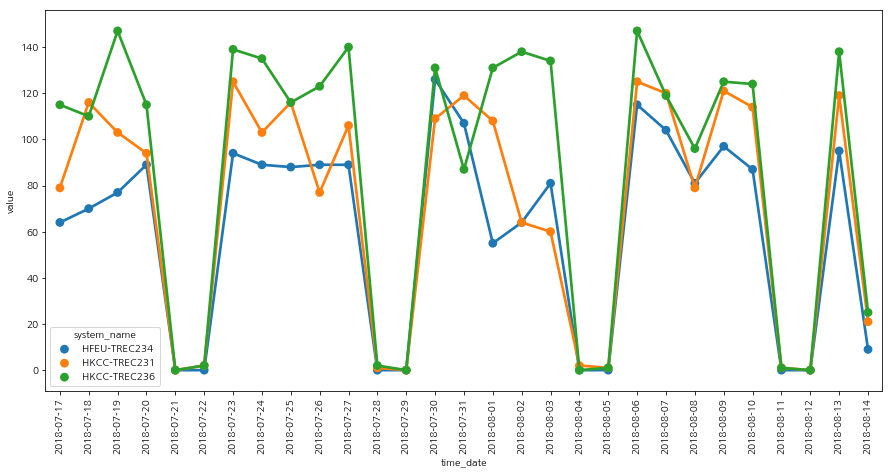

>>>>>>>>>cluster1


<Figure size 432x288 with 0 Axes>

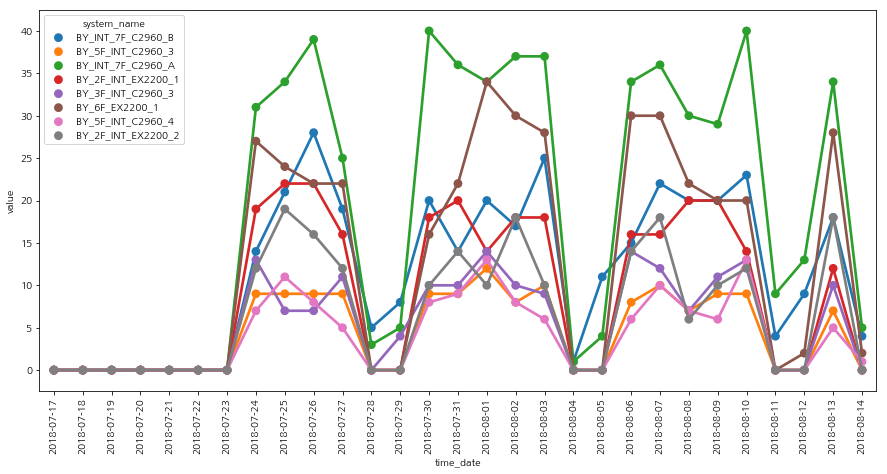

>>>>>>>>>cluster2


<Figure size 432x288 with 0 Axes>

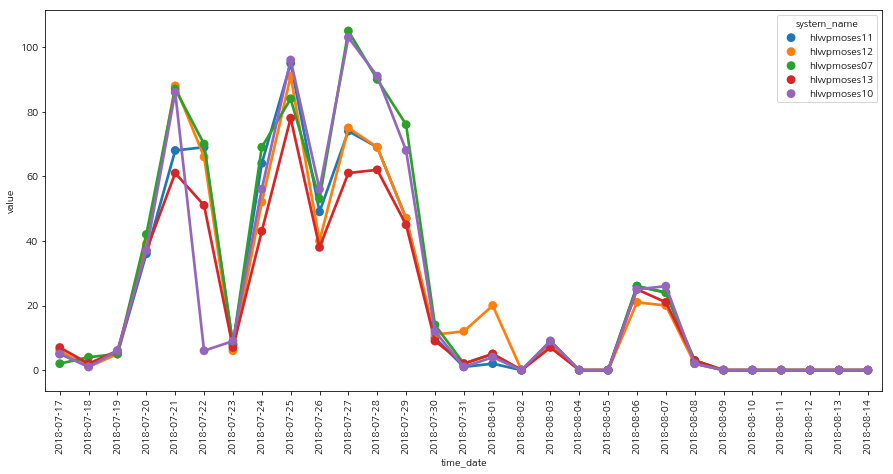

>>>>>>>>>cluster3


<Figure size 432x288 with 0 Axes>

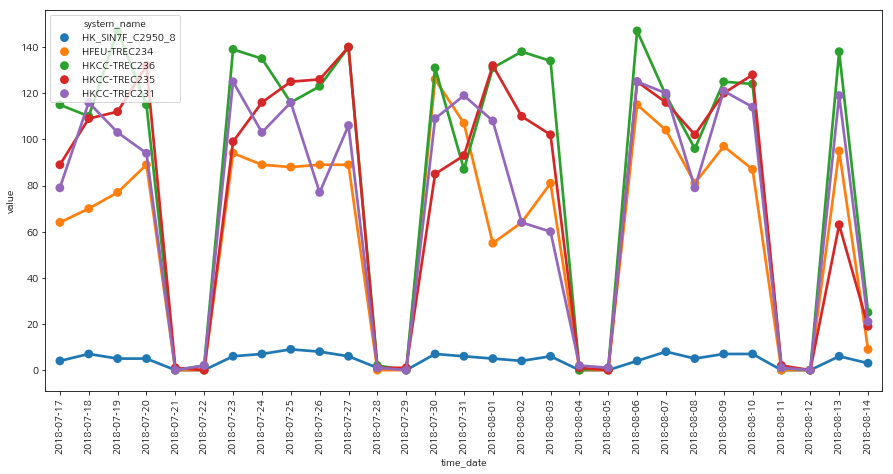

>>>>>>>>>cluster4


<Figure size 432x288 with 0 Axes>

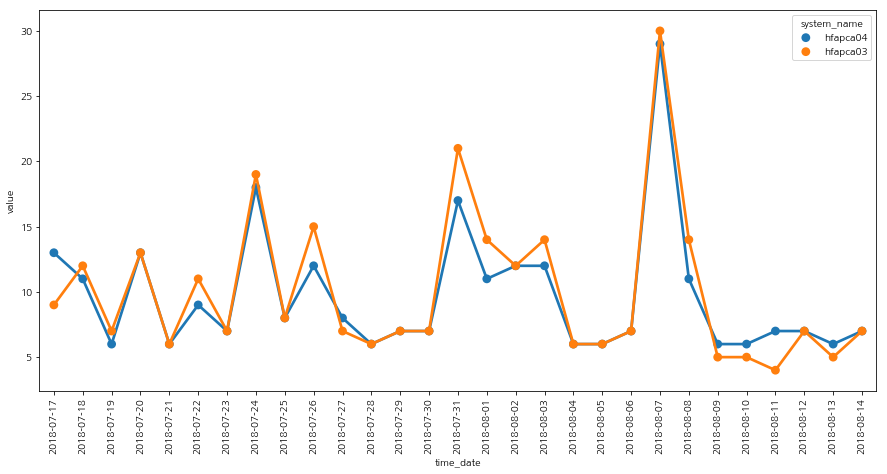

>>>>>>>>>cluster5


<Figure size 432x288 with 0 Axes>

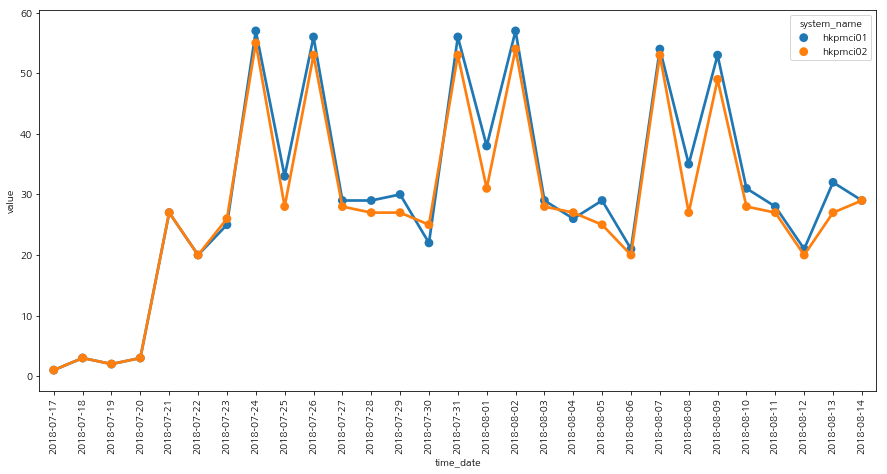

>>>>>>>>>cluster6


<Figure size 432x288 with 0 Axes>

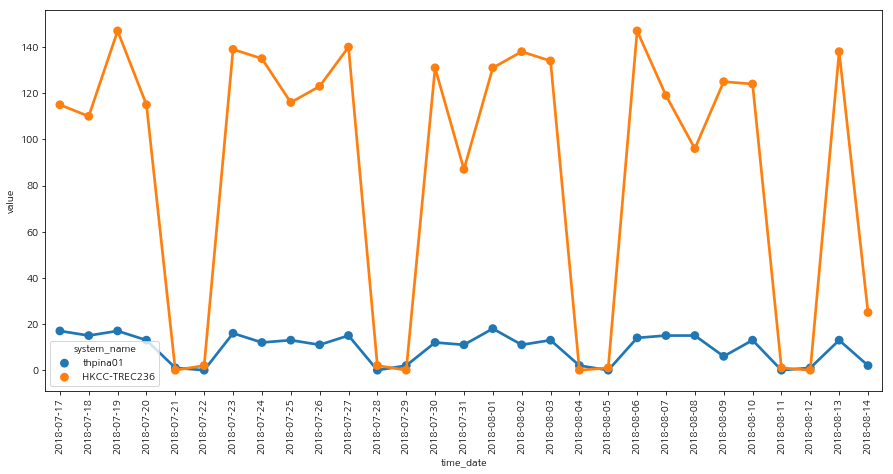

>>>>>>>>>cluster7


<Figure size 432x288 with 0 Axes>

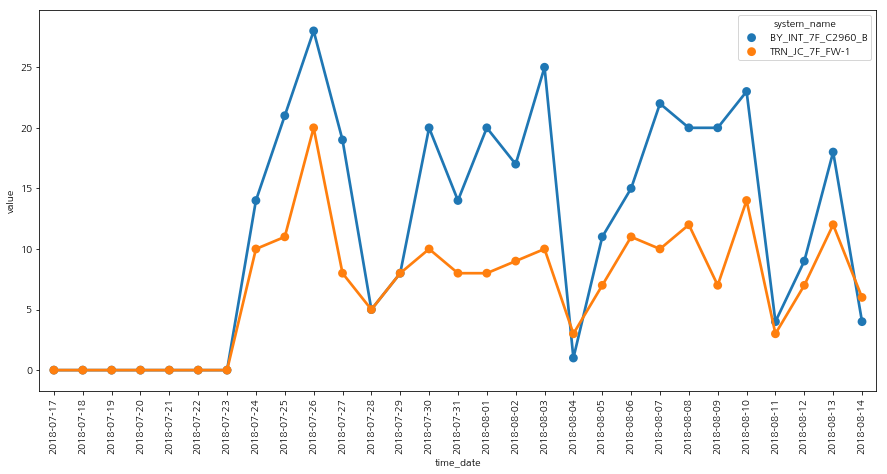

>>>>>>>>>cluster8


<Figure size 432x288 with 0 Axes>

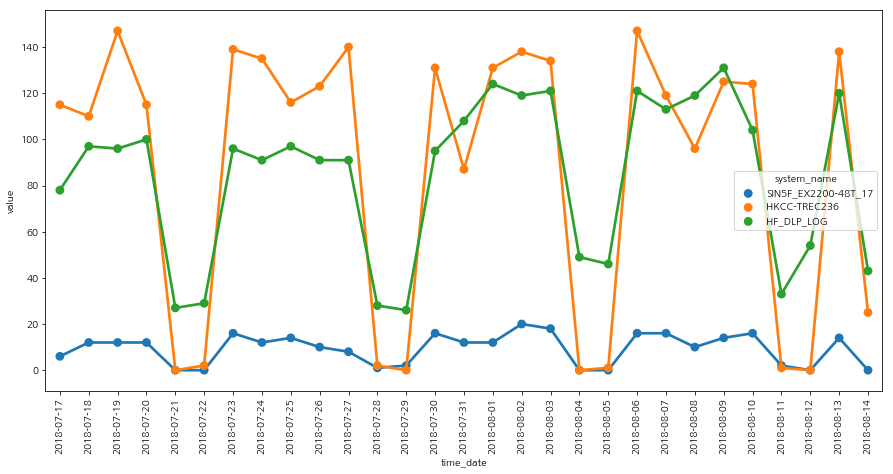

>>>>>>>>>cluster9


<Figure size 432x288 with 0 Axes>

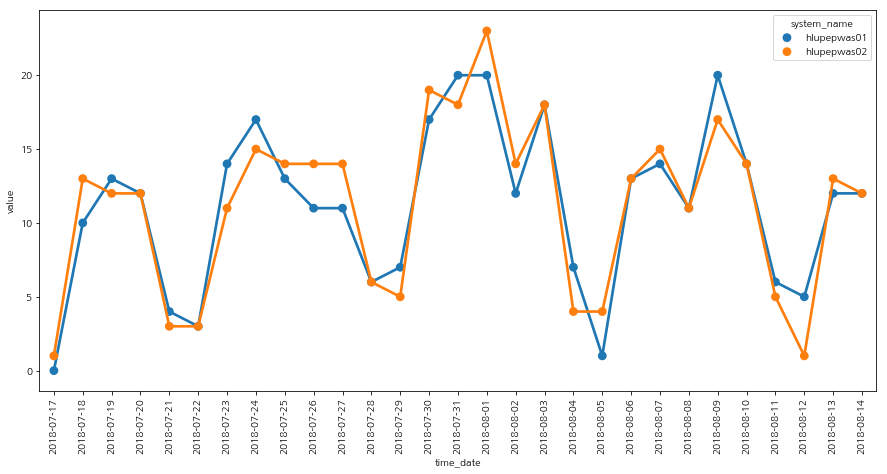

>>>>>>>>>cluster10


<Figure size 432x288 with 0 Axes>

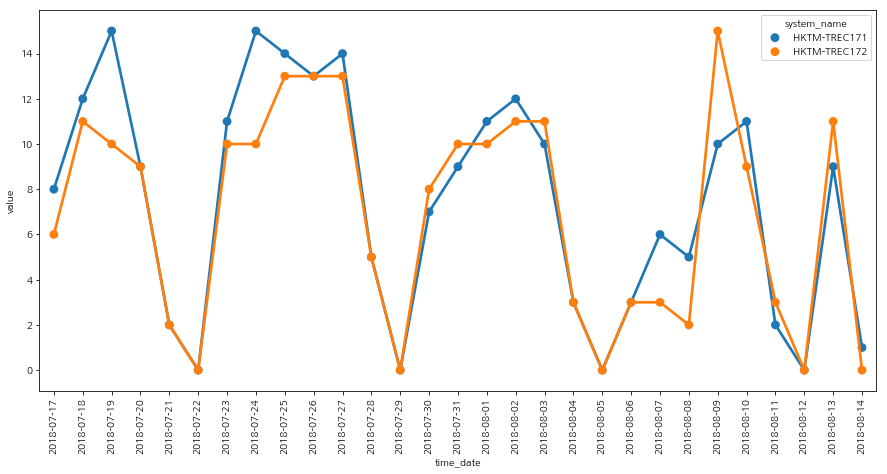

>>>>>>>>>cluster11


<Figure size 432x288 with 0 Axes>

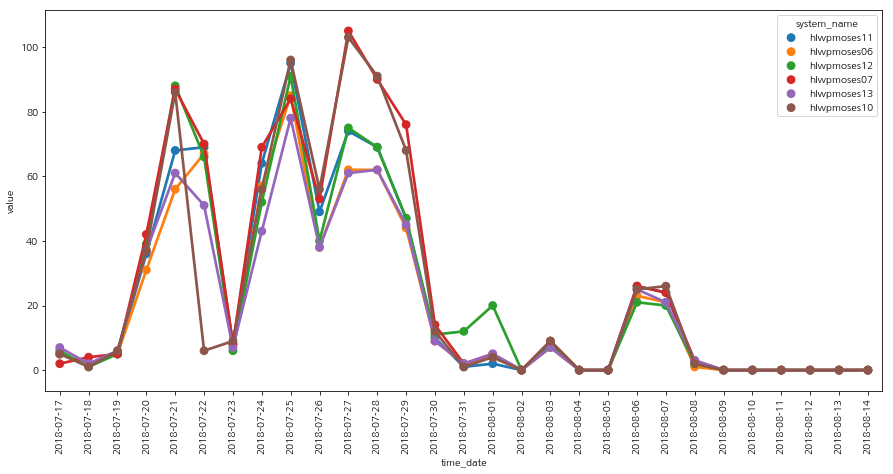

>>>>>>>>>cluster12


<Figure size 432x288 with 0 Axes>

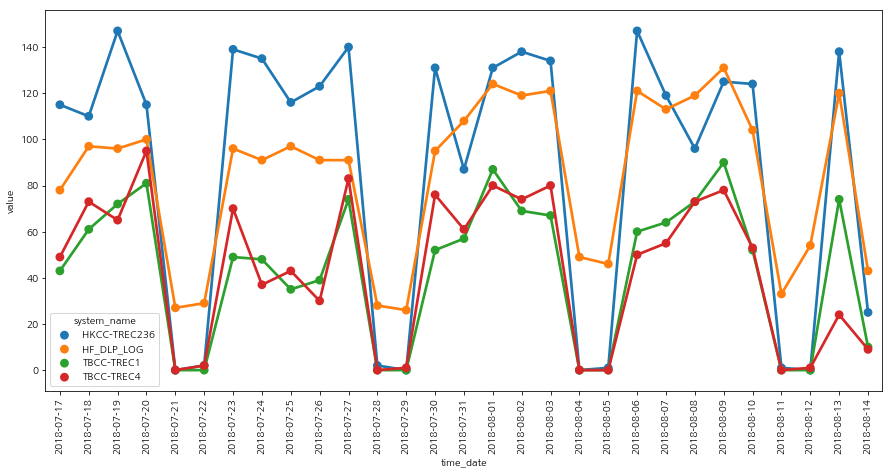

>>>>>>>>>cluster13


<Figure size 432x288 with 0 Axes>

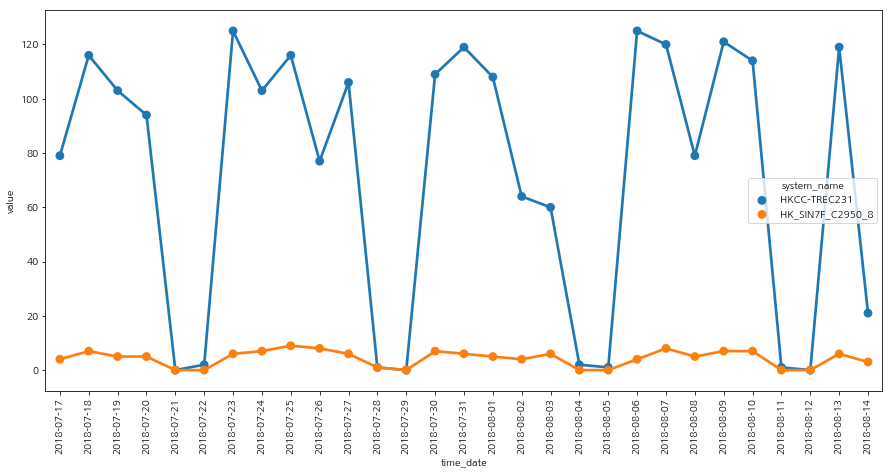

>>>>>>>>>cluster14


<Figure size 432x288 with 0 Axes>

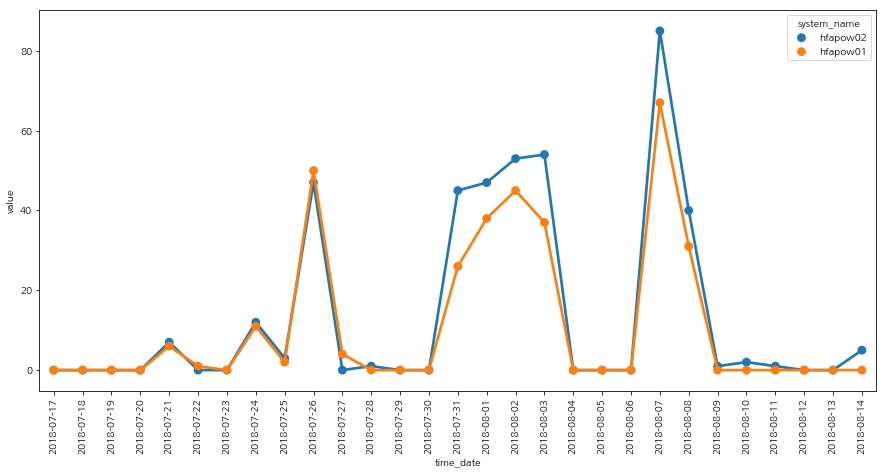

>>>>>>>>>cluster15


<Figure size 432x288 with 0 Axes>

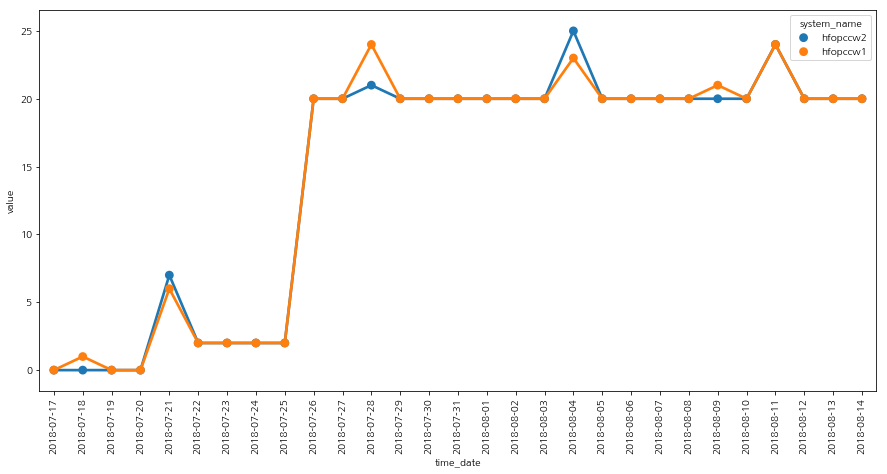

>>>>>>>>>cluster16


<Figure size 432x288 with 0 Axes>

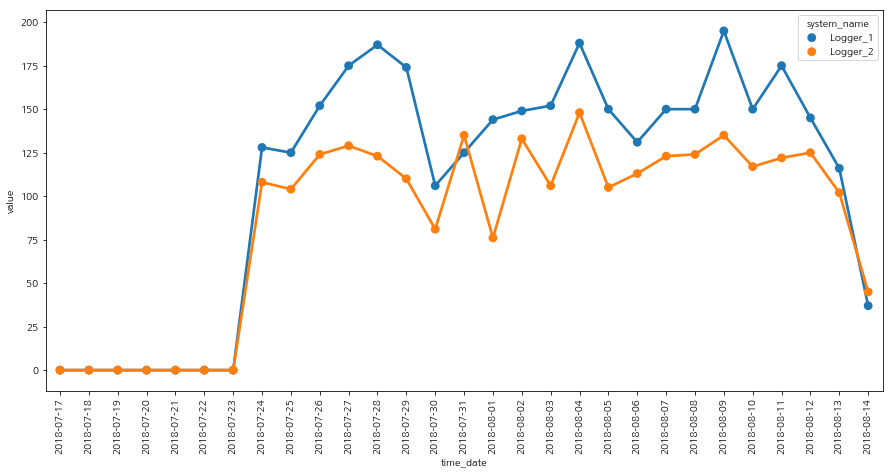

>>>>>>>>>cluster17


<Figure size 432x288 with 0 Axes>

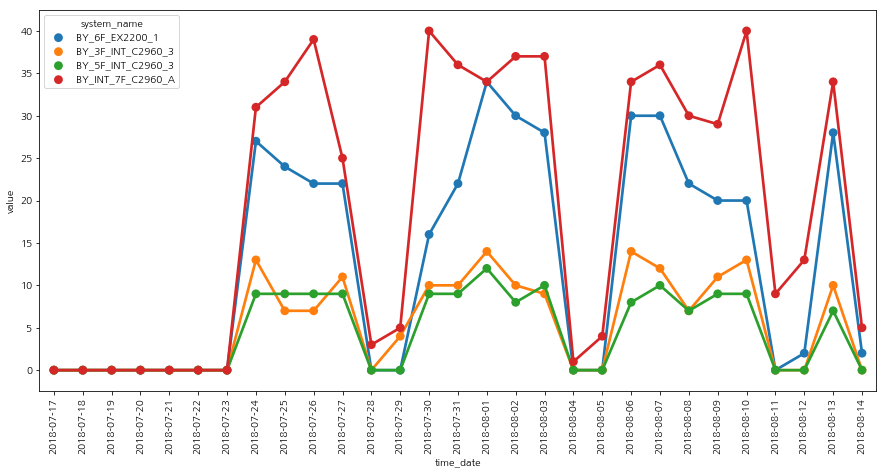

>>>>>>>>>cluster18


<Figure size 432x288 with 0 Axes>

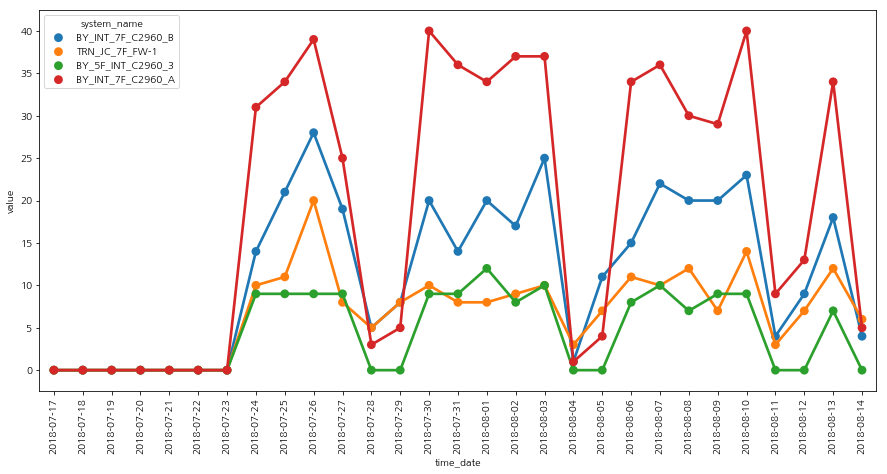

>>>>>>>>>cluster19


<Figure size 432x288 with 0 Axes>

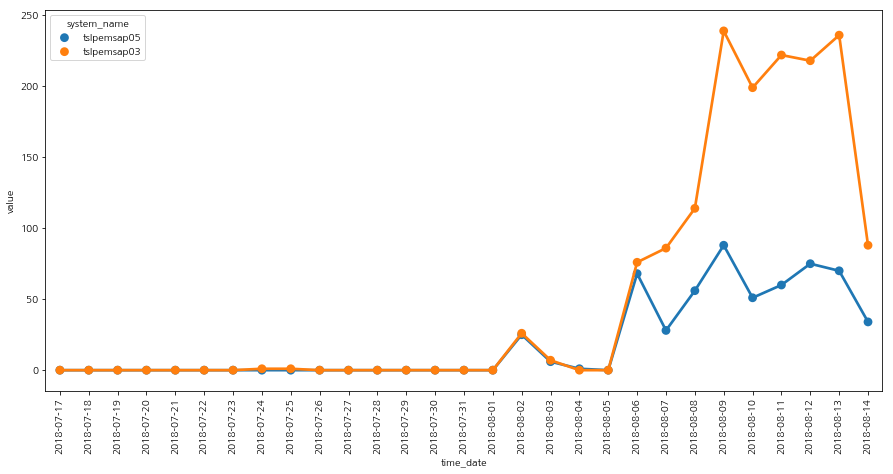

>>>>>>>>>cluster20


<Figure size 432x288 with 0 Axes>

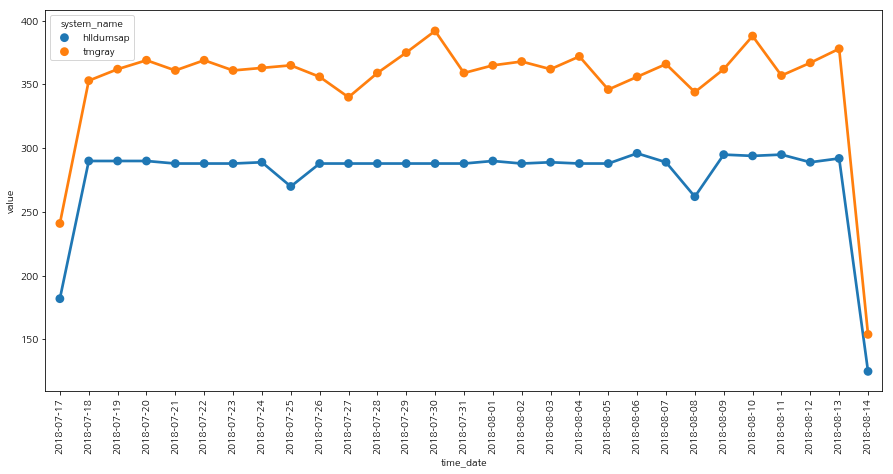

>>>>>>>>>cluster21


<Figure size 432x288 with 0 Axes>

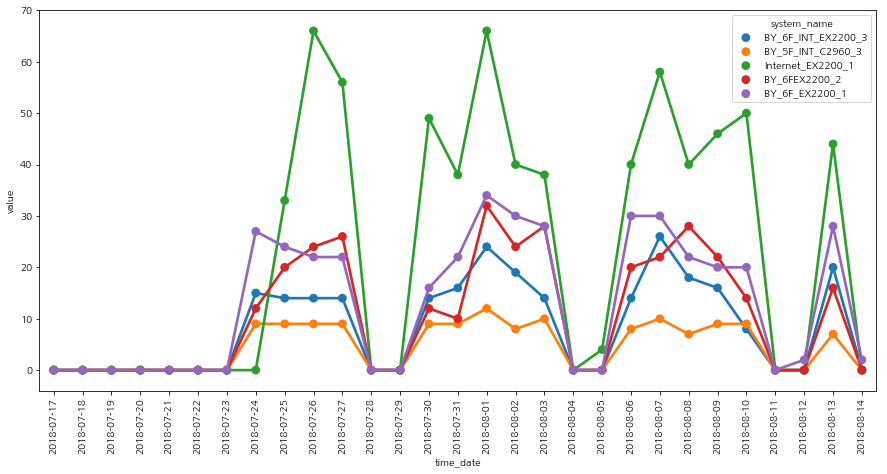

>>>>>>>>>cluster22


<Figure size 432x288 with 0 Axes>

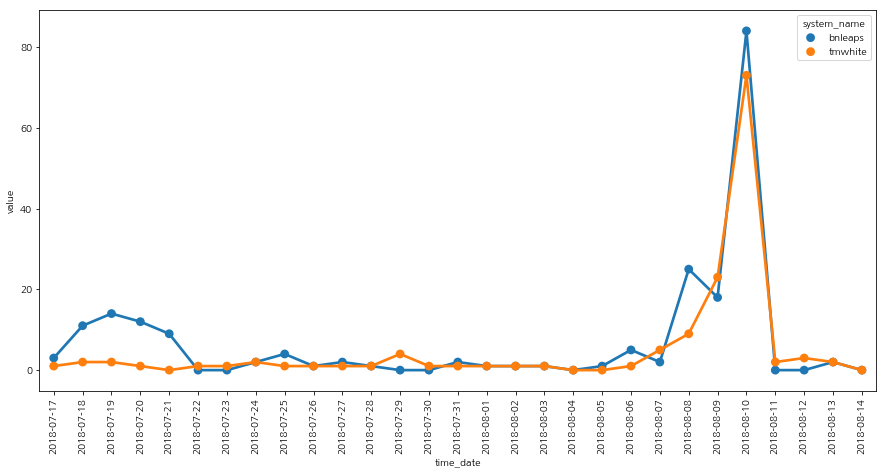

>>>>>>>>>cluster23


<Figure size 432x288 with 0 Axes>

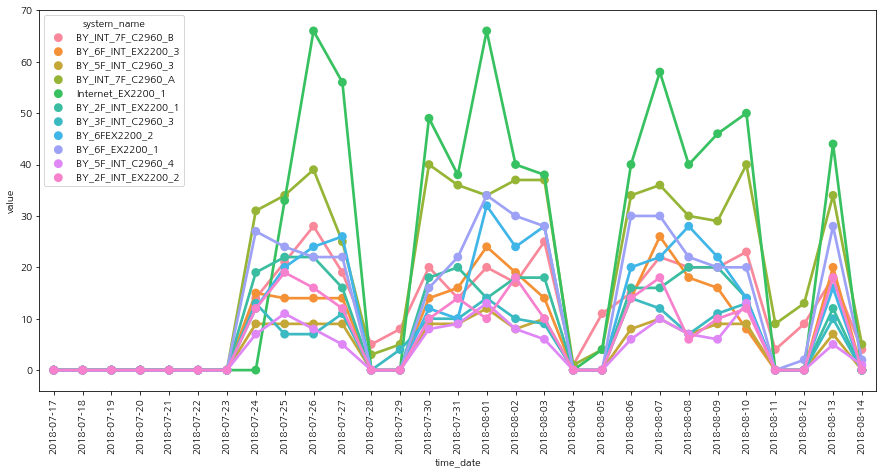

>>>>>>>>>cluster24


<Figure size 432x288 with 0 Axes>

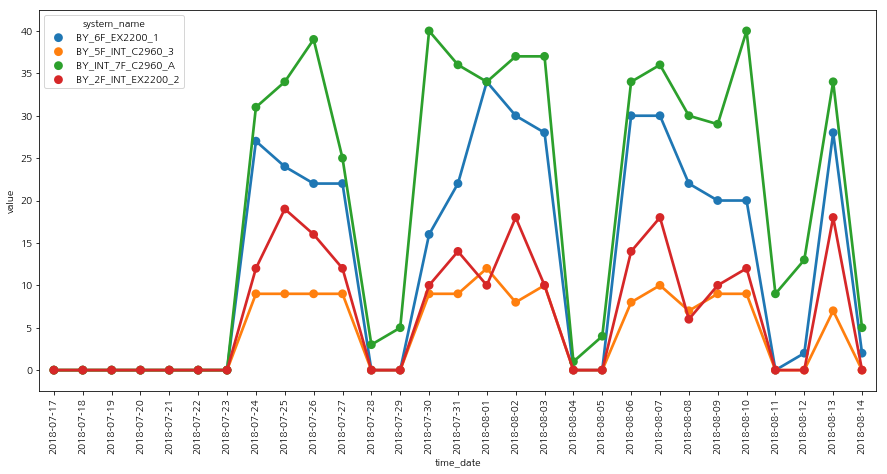

>>>>>>>>>cluster25


<Figure size 432x288 with 0 Axes>

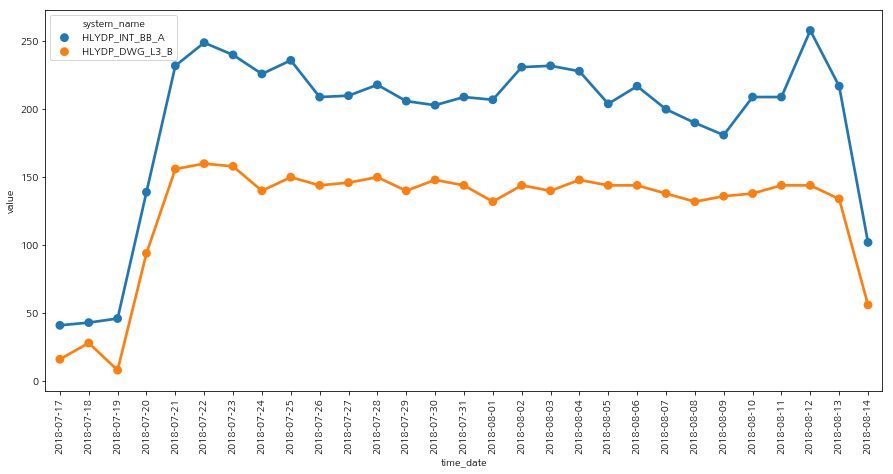

>>>>>>>>>cluster26


<Figure size 432x288 with 0 Axes>

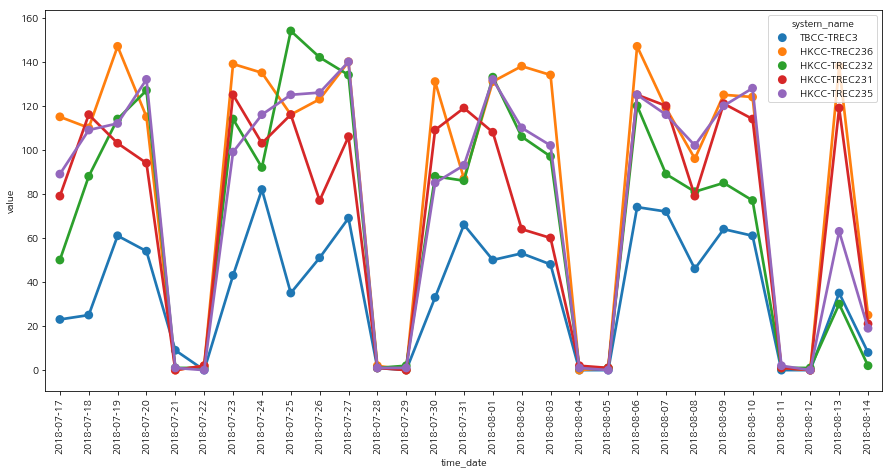

>>>>>>>>>cluster27


<Figure size 432x288 with 0 Axes>

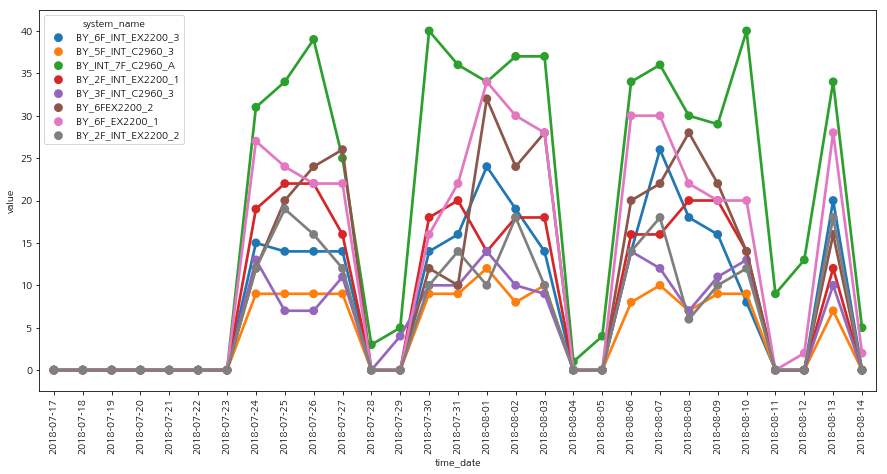

>>>>>>>>>cluster28


<Figure size 432x288 with 0 Axes>

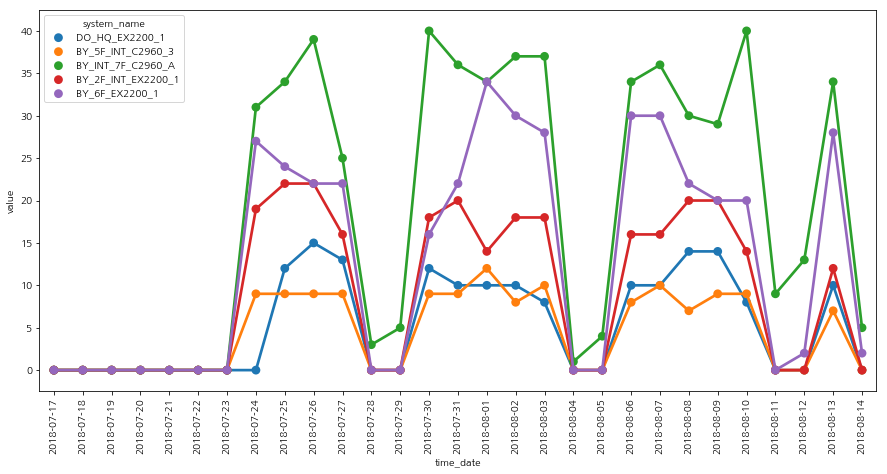

>>>>>>>>>cluster29


<Figure size 432x288 with 0 Axes>

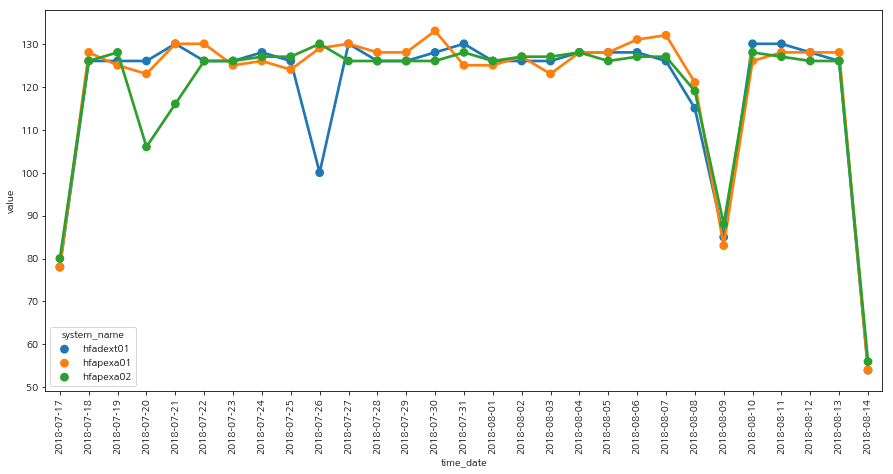

>>>>>>>>>cluster30


<Figure size 432x288 with 0 Axes>

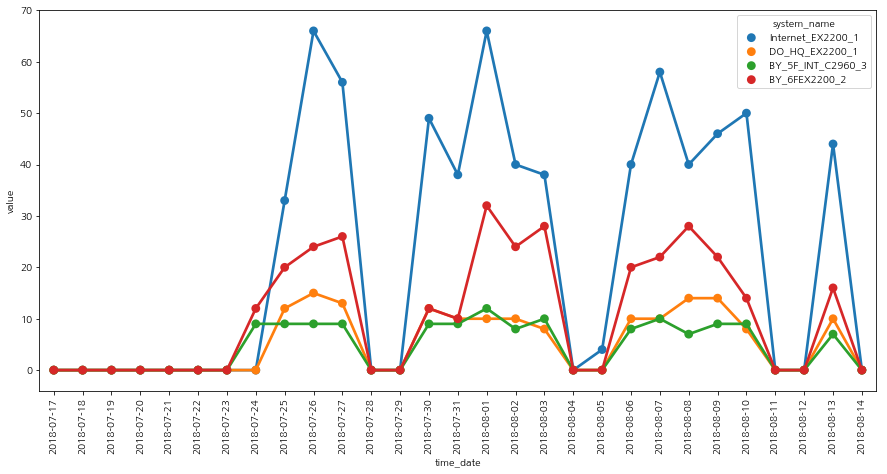

>>>>>>>>>cluster31


<Figure size 432x288 with 0 Axes>

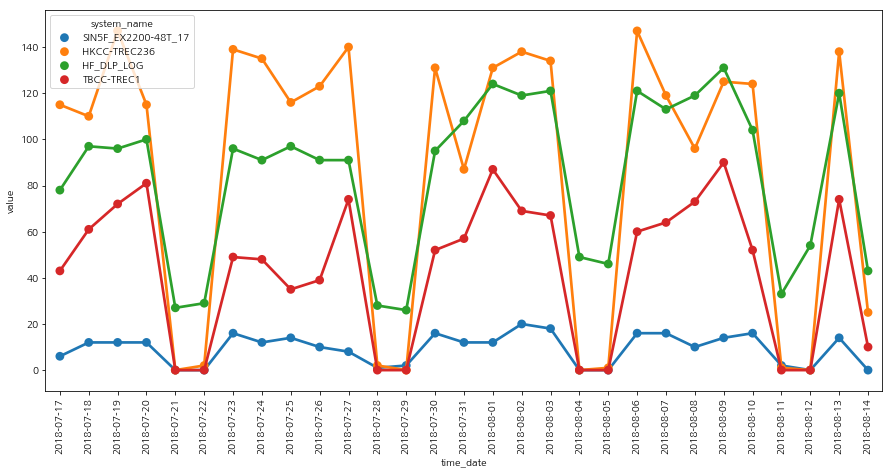

>>>>>>>>>cluster32


<Figure size 432x288 with 0 Axes>

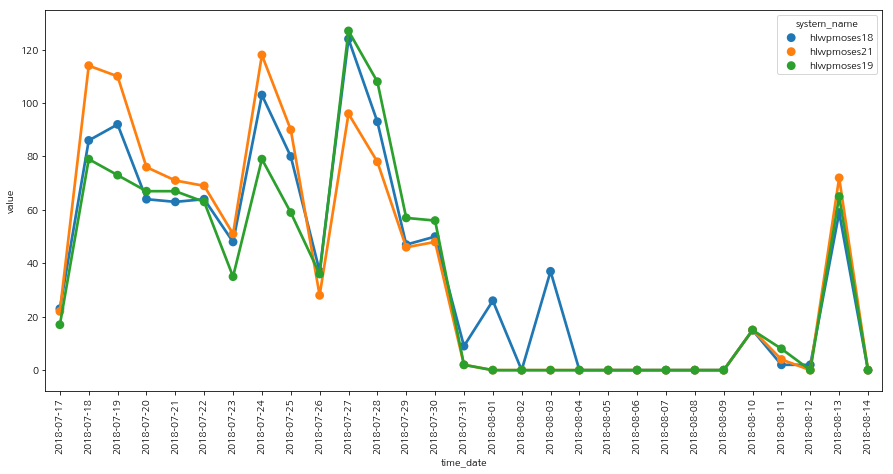

>>>>>>>>>cluster33


<Figure size 432x288 with 0 Axes>

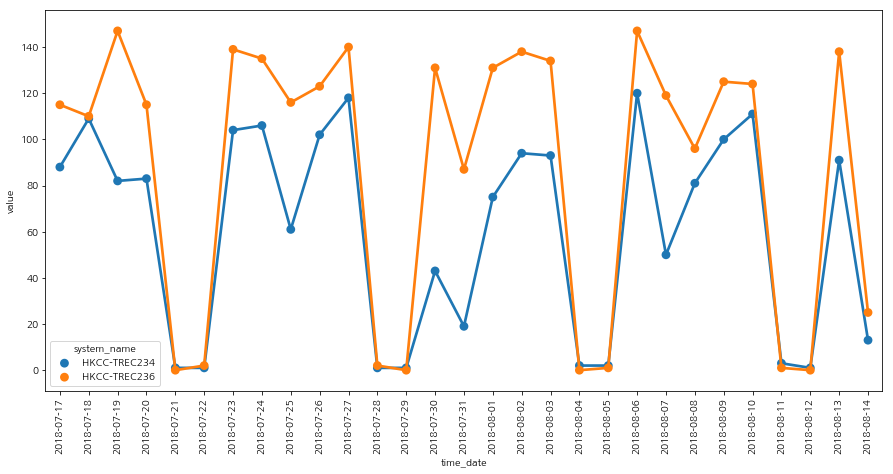

>>>>>>>>>cluster34


<Figure size 432x288 with 0 Axes>

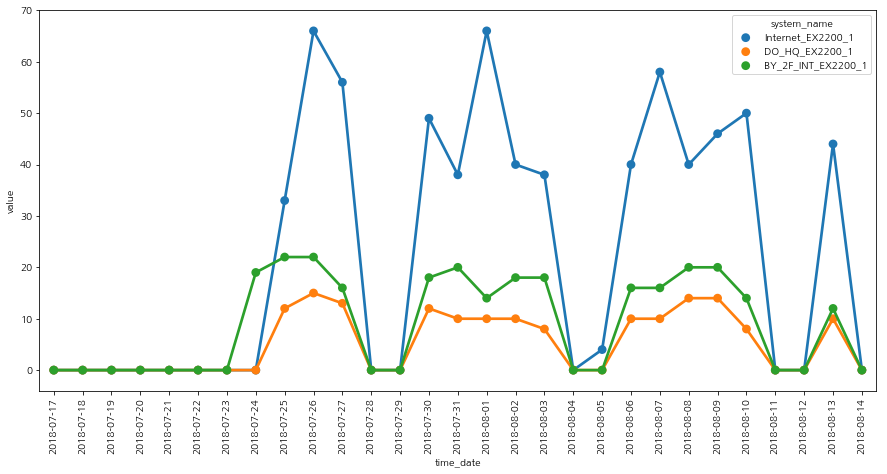

>>>>>>>>>cluster35


<Figure size 432x288 with 0 Axes>

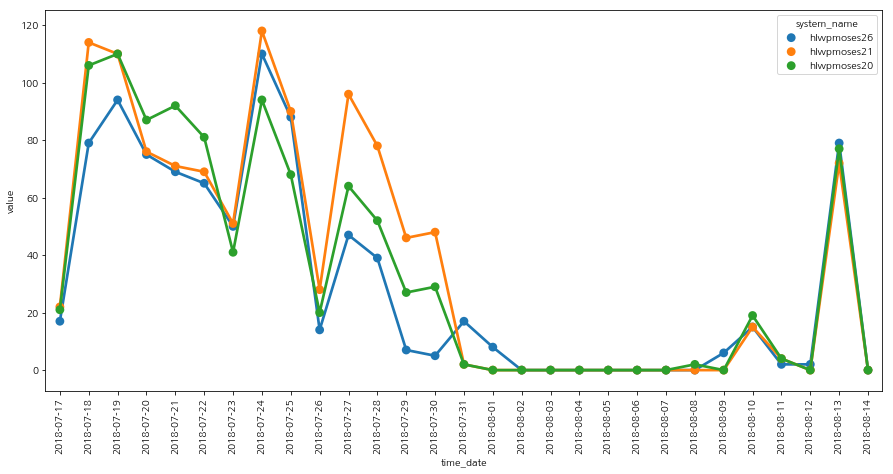

>>>>>>>>>cluster36


<Figure size 432x288 with 0 Axes>

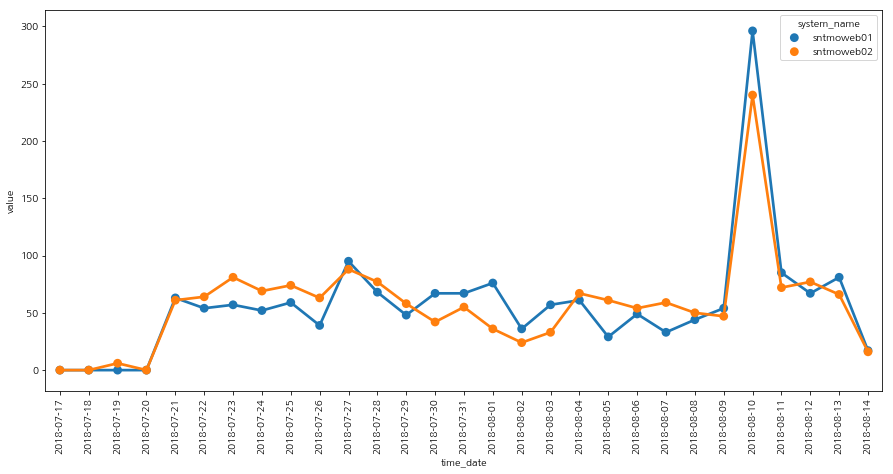

>>>>>>>>>cluster37


<Figure size 432x288 with 0 Axes>

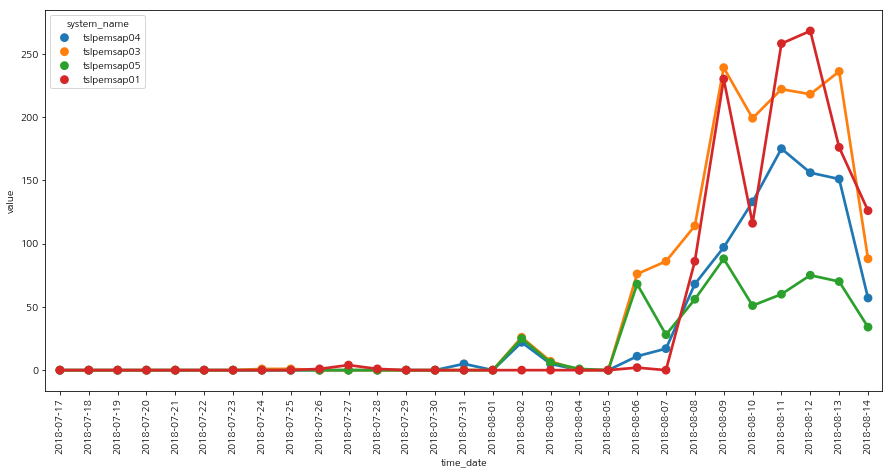

>>>>>>>>>cluster38


<Figure size 432x288 with 0 Axes>

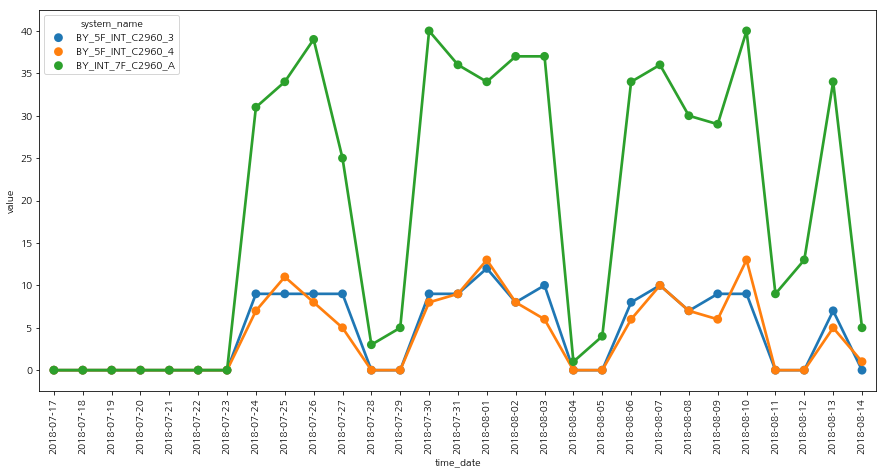

>>>>>>>>>cluster39


<Figure size 432x288 with 0 Axes>

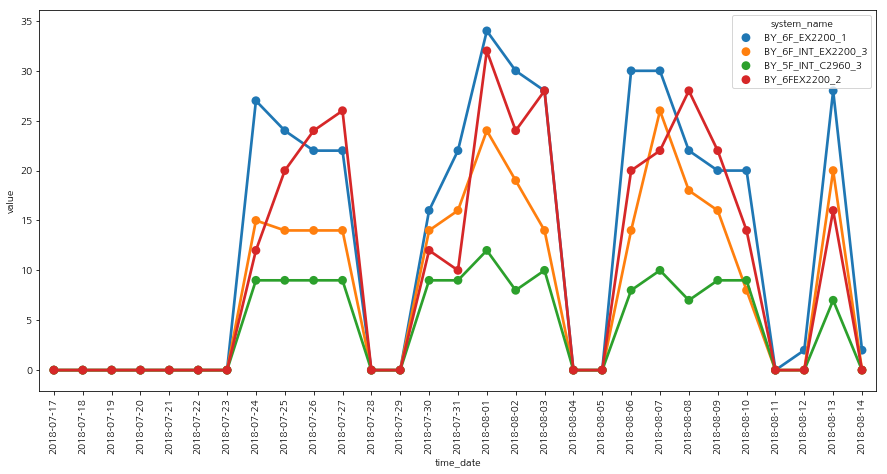

>>>>>>>>>cluster40


<Figure size 432x288 with 0 Axes>

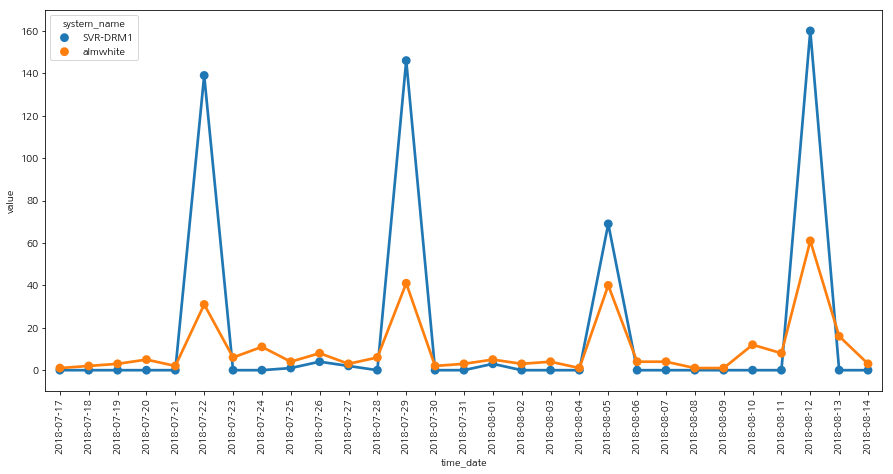

>>>>>>>>>cluster41


<Figure size 432x288 with 0 Axes>

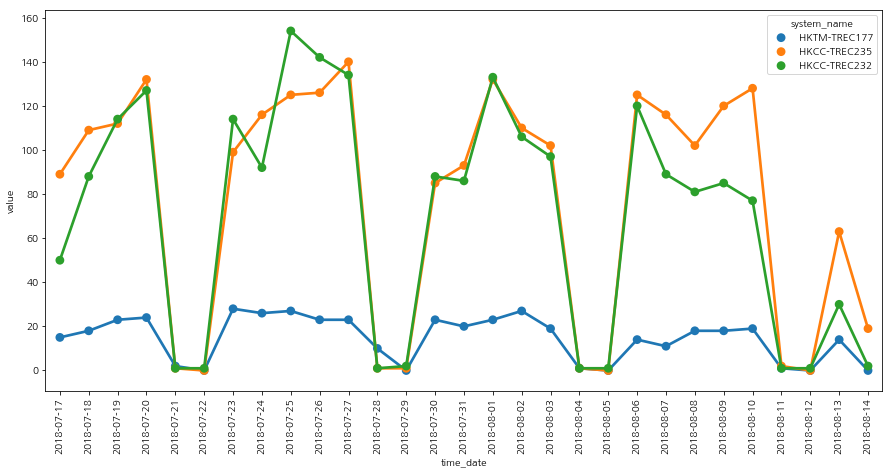

>>>>>>>>>cluster42


<Figure size 432x288 with 0 Axes>

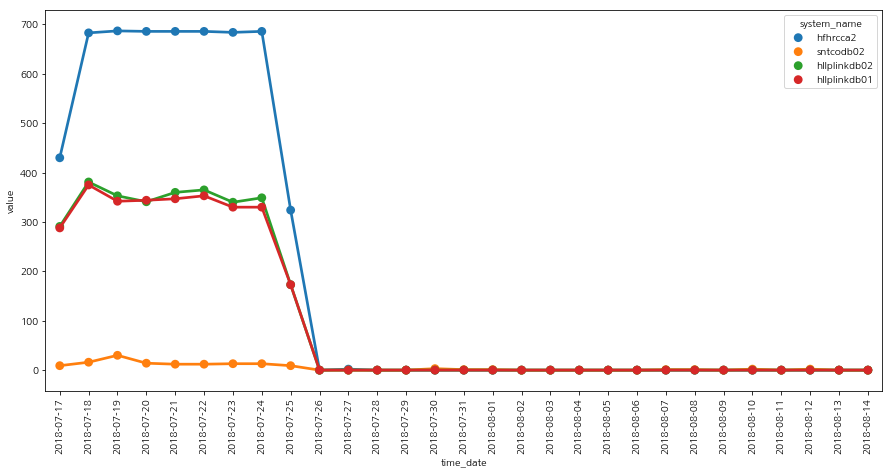

>>>>>>>>>cluster43


<Figure size 432x288 with 0 Axes>

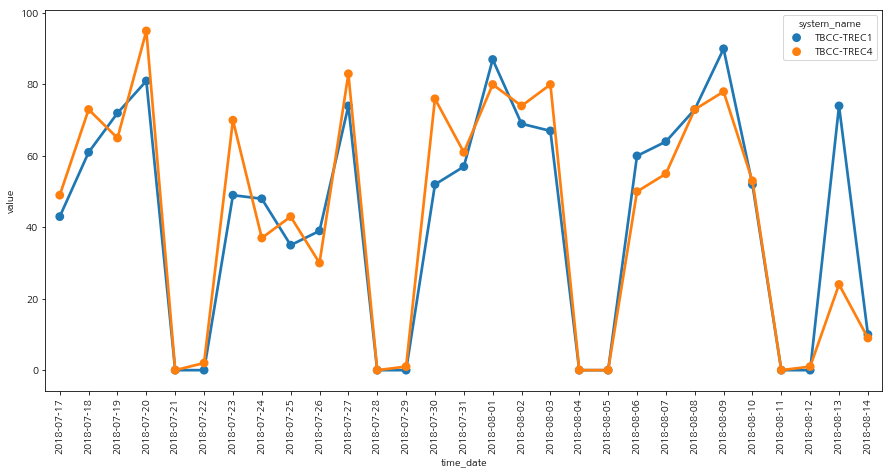

>>>>>>>>>cluster44


<Figure size 432x288 with 0 Axes>

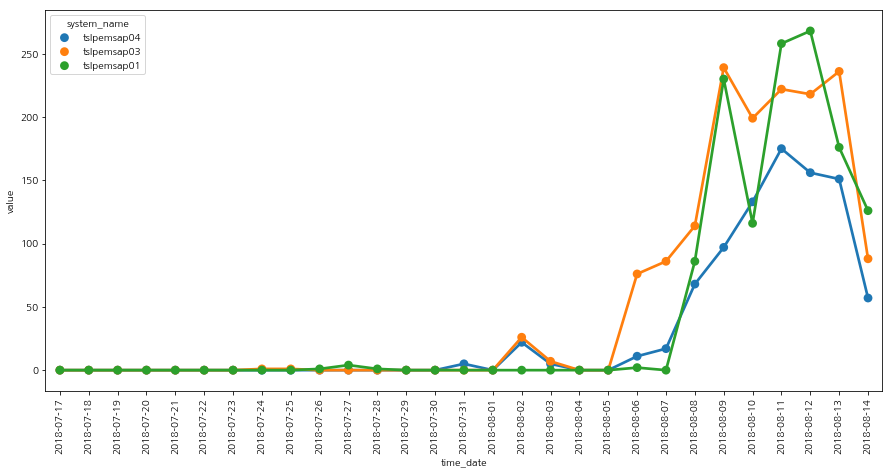

>>>>>>>>>cluster45


<Figure size 432x288 with 0 Axes>

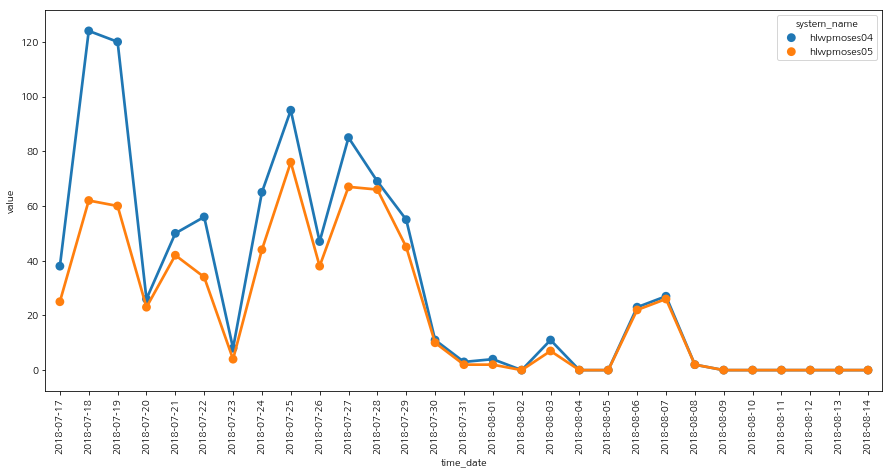

>>>>>>>>>cluster46


<Figure size 432x288 with 0 Axes>

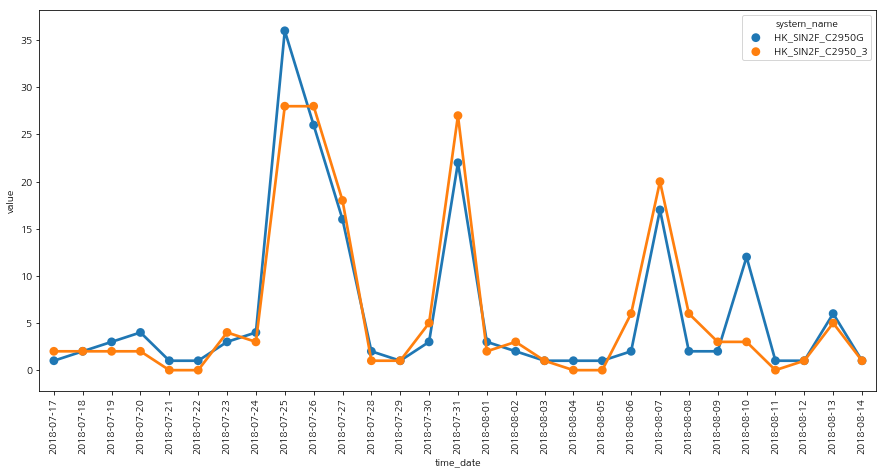

>>>>>>>>>cluster47


<Figure size 432x288 with 0 Axes>

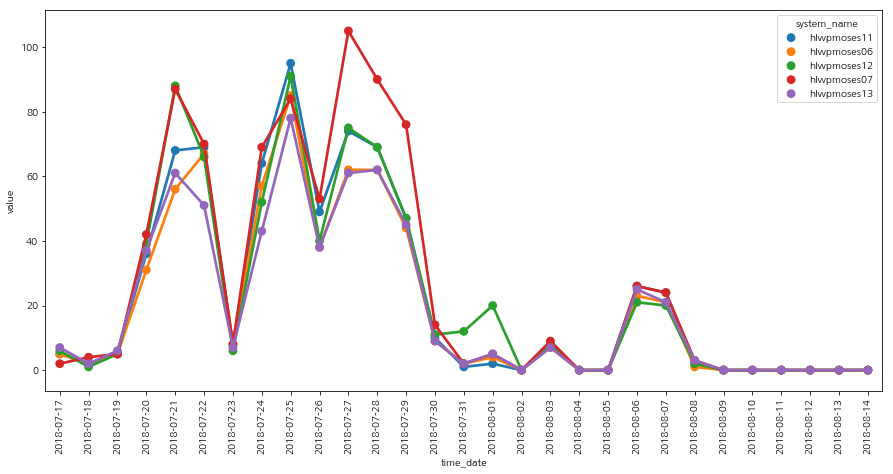

>>>>>>>>>cluster48


<Figure size 432x288 with 0 Axes>

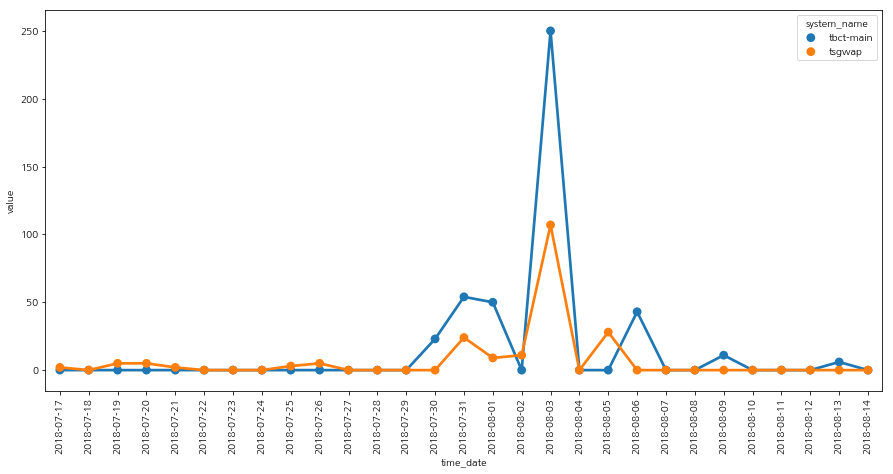

>>>>>>>>>cluster49


<Figure size 432x288 with 0 Axes>

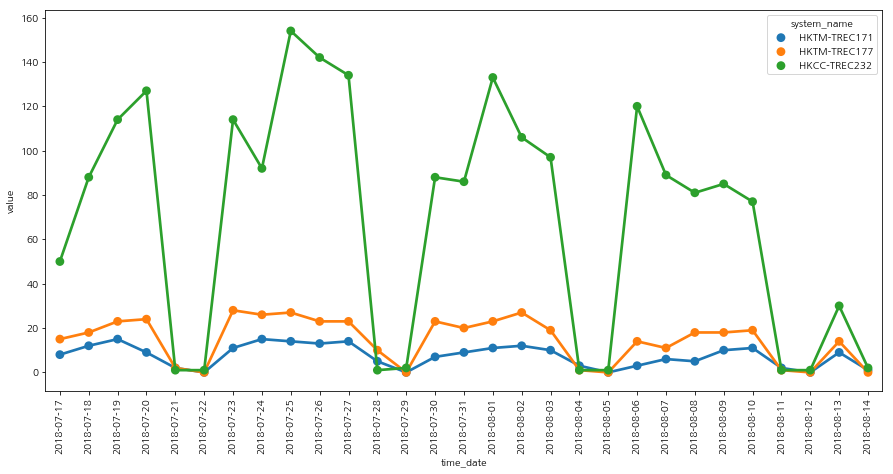

>>>>>>>>>cluster50


<Figure size 432x288 with 0 Axes>

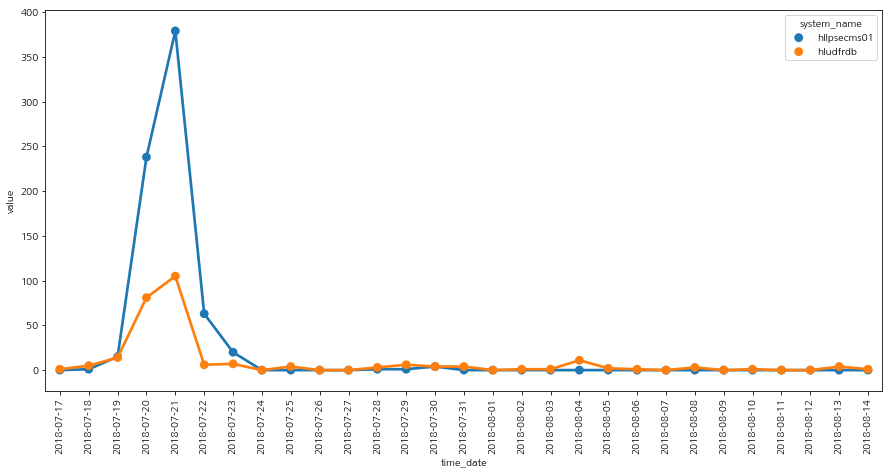

>>>>>>>>>cluster51


<Figure size 432x288 with 0 Axes>

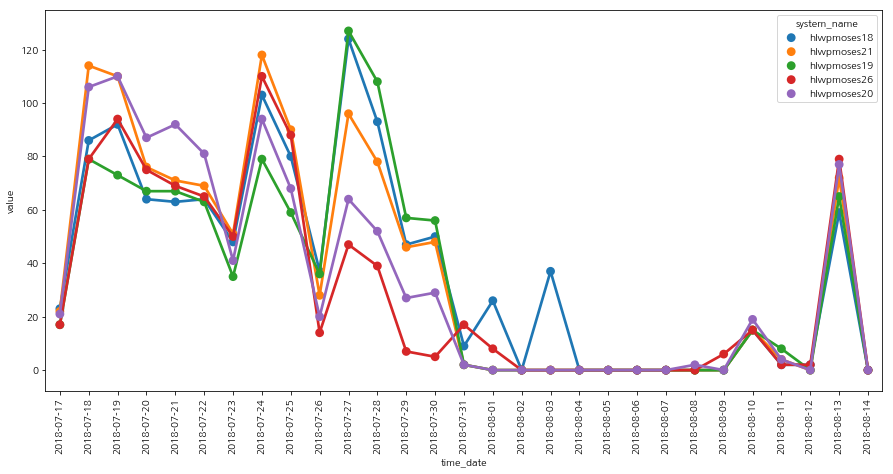

>>>>>>>>>cluster52


<Figure size 432x288 with 0 Axes>

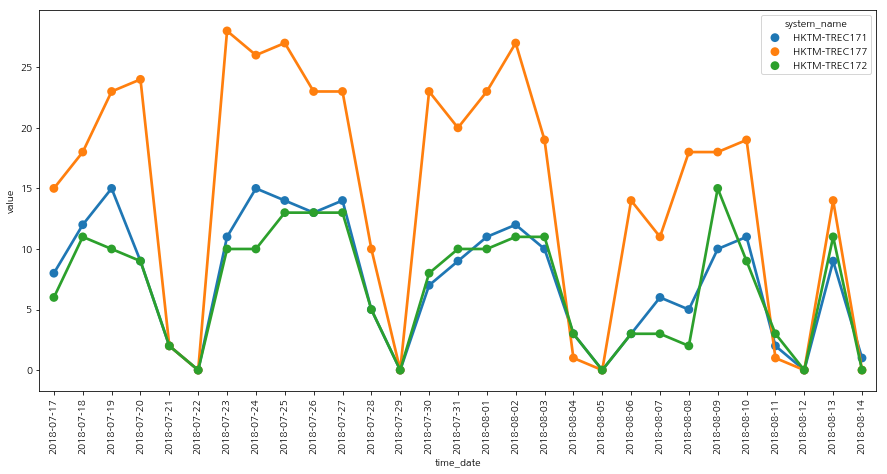

>>>>>>>>>cluster53


<Figure size 432x288 with 0 Axes>

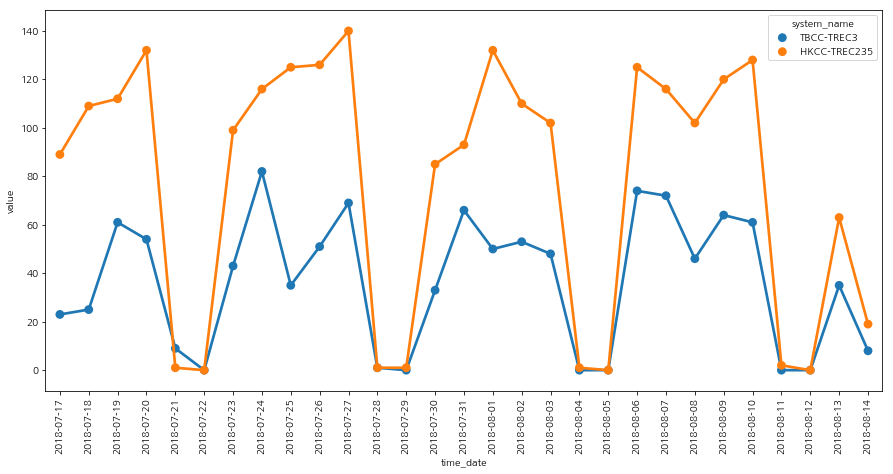

>>>>>>>>>cluster54


<Figure size 432x288 with 0 Axes>

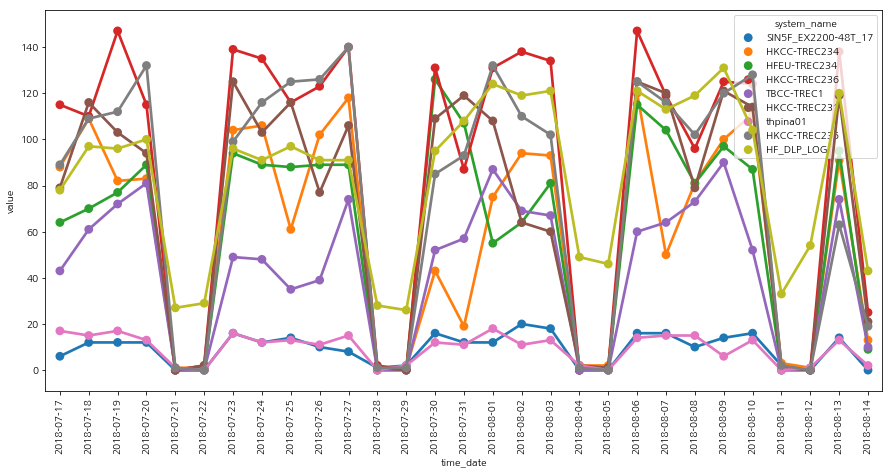

<Figure size 432x288 with 0 Axes>

In [132]:
i = 0
for cluster in clusters_new:
    print('>>>>>>>>>cluster{}'.format(i))
    test_data = pd.melt(data_df_date, id_vars=['time_date'],value_vars=cluster)
    fig = plt.figure(figsize=(15, 7))
    ax = sns.pointplot(x="time_date", y="value",hue=test_data.system_name, data=test_data)
    plt.xticks(rotation='vertical')
    plt.show()
    plt.clf()
    i += 1

In [179]:
i = 0
for cluster in clusters_new:
    print('>>>>>>>cluster{}\n{}'.format(i,cluster))
    c_nodes = data[data['system_name'].isin(cluster)]
    c_nodes = c_nodes.groupby(['time_date','alarm_name','system_name'])['time'].count().reindex().reset_index().sort_values('time_date', ascending=True)
    c_nodes = c_nodes.groupby(['alarm_name','system_name'])['time'].sum().reindex().reset_index().sort_values('time', ascending=False)
    c_nodes = c_nodes[c_nodes.time > c_nodes.time.mean()]
    display_side_by_side(c_nodes)
    i += 1

>>>>>>>cluster0
('HFEU-TREC234', 'HKCC-TREC231', 'HKCC-TREC236')


,alarm_name,system_name,time
3,디스크 Top I/O 처리율,HKCC-TREC236,2539
2,디스크 Top I/O 처리율,HKCC-TREC231,2085
1,디스크 Top I/O 처리율,HFEU-TREC234,1761


>>>>>>>cluster1
('BY_INT_7F_C2960_B', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'BY_2F_INT_EX2200_1', 'BY_3F_INT_C2960_3', 'BY_6F_EX2200_1', 'BY_5F_INT_C2960_4', 'BY_2F_INT_EX2200_2')


,alarm_name,system_name,time
19,포트 다운,BY_INT_7F_C2960_A,435
20,포트 다운,BY_INT_7F_C2960_B,203
7,가상 포트 다운,BY_6F_EX2200_1,189
18,포트 다운,BY_6F_EX2200_1,184
15,포트 다운,BY_3F_INT_C2960_3,149
16,포트 다운,BY_5F_INT_C2960_3,133
5,가상 포트 다운,BY_2F_INT_EX2200_1,133
13,포트 다운,BY_2F_INT_EX2200_1,130
22,현재 온도,BY_INT_7F_C2960_B,127
21,현재 온도,BY_INT_7F_C2960_A,121


>>>>>>>cluster2
('hlwpmoses11', 'hlwpmoses12', 'hlwpmoses07', 'hlwpmoses13', 'hlwpmoses10')


,alarm_name,system_name,time
0,CPU 사용률,hlwpmoses07,778
1,CPU 사용률,hlwpmoses10,699
3,CPU 사용률,hlwpmoses12,679


>>>>>>>cluster3
('HK_SIN7F_C2950_8', 'HFEU-TREC234', 'HKCC-TREC236', 'HKCC-TREC235', 'HKCC-TREC231')


,alarm_name,system_name,time
4,디스크 Top I/O 처리율,HKCC-TREC236,2539
3,디스크 Top I/O 처리율,HKCC-TREC235,2249
2,디스크 Top I/O 처리율,HKCC-TREC231,2085
1,디스크 Top I/O 처리율,HFEU-TREC234,1761


>>>>>>>cluster4
('hfapca04', 'hfapca03')


,alarm_name,system_name,time
0,[Server]프로세스 다운,hfapca03,270
1,[Server]프로세스 다운,hfapca04,260


>>>>>>>cluster5
('hkpmci01', 'hkpmci02')


,alarm_name,system_name,time
6,로그 감시,hkpmci02,755
5,로그 감시,hkpmci01,747


>>>>>>>cluster6
('thpina01', 'HKCC-TREC236')


,alarm_name,system_name,time
3,디스크 Top I/O 처리율,HKCC-TREC236,2539


>>>>>>>cluster7
('BY_INT_7F_C2960_B', 'TRN_JC_7F_FW-1')


,alarm_name,system_name,time
2,포트 다운,BY_INT_7F_C2960_B,203
4,현재 온도,TRN_JC_7F_FW-1,199
3,현재 온도,BY_INT_7F_C2960_B,127


>>>>>>>cluster8
('SIN5F_EX2200-48T_17', 'HKCC-TREC236', 'HF_DLP_LOG')


,alarm_name,system_name,time
2,디스크 Top I/O 처리율,HKCC-TREC236,2539
1,디스크 Top I/O 처리율,HF_DLP_LOG,2153


>>>>>>>cluster9
('hlupepwas01', 'hlupepwas02')


,alarm_name,system_name,time
1,[WAS]프로세스 다운,hlupepwas02,165
0,[WAS]프로세스 다운,hlupepwas01,162
2,디스크 Top I/O 처리율,hlupepwas01,147
3,디스크 Top I/O 처리율,hlupepwas02,145


>>>>>>>cluster10
('HKTM-TREC171', 'HKTM-TREC172')


,alarm_name,system_name,time
0,디스크 Top I/O 처리율,HKTM-TREC171,216
1,디스크 Top I/O 처리율,HKTM-TREC172,201


>>>>>>>cluster11
('hlwpmoses11', 'hlwpmoses06', 'hlwpmoses12', 'hlwpmoses07', 'hlwpmoses13', 'hlwpmoses10')


,alarm_name,system_name,time
1,CPU 사용률,hlwpmoses07,778
2,CPU 사용률,hlwpmoses10,699
4,CPU 사용률,hlwpmoses12,679
3,CPU 사용률,hlwpmoses11,664


>>>>>>>cluster12
('HKCC-TREC236', 'HF_DLP_LOG', 'TBCC-TREC1', 'TBCC-TREC4')


,alarm_name,system_name,time
3,디스크 Top I/O 처리율,HKCC-TREC236,2539
2,디스크 Top I/O 처리율,HF_DLP_LOG,2153
4,디스크 Top I/O 처리율,TBCC-TREC1,1250
5,디스크 Top I/O 처리율,TBCC-TREC4,1248


>>>>>>>cluster13
('HKCC-TREC231', 'HK_SIN7F_C2950_8')


,alarm_name,system_name,time
0,디스크 Top I/O 처리율,HKCC-TREC231,2085


>>>>>>>cluster14
('hfapow02', 'hfapow01')


,alarm_name,system_name,time
1,로그 감시,hfapow02,400
0,로그 감시,hfapow01,318


>>>>>>>cluster15
('hfopccw2', 'hfopccw1')


,alarm_name,system_name,time
2,로그 감시,hfopccw1,410
3,로그 감시,hfopccw2,410


>>>>>>>cluster16
('Logger_1', 'Logger_2')


,alarm_name,system_name,time
0,트래픽 사용률 Rx,Logger_1,2116
1,트래픽 사용률 Rx,Logger_2,1471


>>>>>>>cluster17
('BY_6F_EX2200_1', 'BY_3F_INT_C2960_3', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A')


,alarm_name,system_name,time
8,포트 다운,BY_INT_7F_C2960_A,435
2,가상 포트 다운,BY_6F_EX2200_1,189
7,포트 다운,BY_6F_EX2200_1,184
5,포트 다운,BY_3F_INT_C2960_3,149
6,포트 다운,BY_5F_INT_C2960_3,133


>>>>>>>cluster18
('BY_INT_7F_C2960_B', 'TRN_JC_7F_FW-1', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A')


,alarm_name,system_name,time
4,포트 다운,BY_INT_7F_C2960_A,435
5,포트 다운,BY_INT_7F_C2960_B,203
8,현재 온도,TRN_JC_7F_FW-1,199


>>>>>>>cluster19
('tslpemsap05', 'tslpemsap03')


,alarm_name,system_name,time
1,WebURL 감시,tslpemsap03,1509
2,WebURL 감시,tslpemsap05,561


>>>>>>>cluster20
('hlldumsap', 'tmgray')


,alarm_name,system_name,time
0,CPU 대기중 프로세스,tmgray,10179
6,로그 감시,hlldumsap,5688
7,로그 감시_2,hlldumsap,2334


>>>>>>>cluster21
('BY_6F_INT_EX2200_3', 'BY_5F_INT_C2960_3', 'Internet_EX2200_1', 'BY_6FEX2200_2', 'BY_6F_EX2200_1')


,alarm_name,system_name,time
8,가상 포트 다운,Internet_EX2200_1,334
13,포트 다운,Internet_EX2200_1,332
6,가상 포트 다운,BY_6F_EX2200_1,189
11,포트 다운,BY_6F_EX2200_1,184
5,가상 포트 다운,BY_6FEX2200_2,152
10,포트 다운,BY_6FEX2200_2,152
9,포트 다운,BY_5F_INT_C2960_3,133


>>>>>>>cluster22
('bnleaps', 'tmwhite')


,alarm_name,system_name,time
6,메모리 사용률_90,bnleaps,141
7,메모리 사용률_90,tmwhite,132
8,인터페이스 사용률,bnleaps,46


>>>>>>>cluster23
('BY_INT_7F_C2960_B', 'BY_6F_INT_EX2200_3', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'Internet_EX2200_1', 'BY_2F_INT_EX2200_1', 'BY_3F_INT_C2960_3', 'BY_6FEX2200_2', 'BY_6F_EX2200_1', 'BY_5F_INT_C2960_4', 'BY_2F_INT_EX2200_2')


,alarm_name,system_name,time
27,포트 다운,BY_INT_7F_C2960_A,435
13,가상 포트 다운,Internet_EX2200_1,334
29,포트 다운,Internet_EX2200_1,332
28,포트 다운,BY_INT_7F_C2960_B,203
11,가상 포트 다운,BY_6F_EX2200_1,189
25,포트 다운,BY_6F_EX2200_1,184
24,포트 다운,BY_6FEX2200_2,152
10,가상 포트 다운,BY_6FEX2200_2,152
21,포트 다운,BY_3F_INT_C2960_3,149
22,포트 다운,BY_5F_INT_C2960_3,133


>>>>>>>cluster24
('BY_6F_EX2200_1', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'BY_2F_INT_EX2200_2')


,alarm_name,system_name,time
8,포트 다운,BY_INT_7F_C2960_A,435
4,가상 포트 다운,BY_6F_EX2200_1,189
7,포트 다운,BY_6F_EX2200_1,184
6,포트 다운,BY_5F_INT_C2960_3,133


>>>>>>>cluster25
('HLYDP_INT_BB_A', 'HLYDP_DWG_L3_B')


,alarm_name,system_name,time
3,현재 온도,HLYDP_INT_BB_A,5589
2,현재 온도,HLYDP_DWG_L3_B,3656


>>>>>>>cluster26
('TBCC-TREC3', 'HKCC-TREC236', 'HKCC-TREC232', 'HKCC-TREC231', 'HKCC-TREC235')


,alarm_name,system_name,time
3,디스크 Top I/O 처리율,HKCC-TREC236,2539
2,디스크 Top I/O 처리율,HKCC-TREC235,2249
0,디스크 Top I/O 처리율,HKCC-TREC231,2085
1,디스크 Top I/O 처리율,HKCC-TREC232,2018


>>>>>>>cluster27
('BY_6F_INT_EX2200_3', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'BY_2F_INT_EX2200_1', 'BY_3F_INT_C2960_3', 'BY_6FEX2200_2', 'BY_6F_EX2200_1', 'BY_2F_INT_EX2200_2')


,alarm_name,system_name,time
20,포트 다운,BY_INT_7F_C2960_A,435
9,가상 포트 다운,BY_6F_EX2200_1,189
18,포트 다운,BY_6F_EX2200_1,184
17,포트 다운,BY_6FEX2200_2,152
8,가상 포트 다운,BY_6FEX2200_2,152
15,포트 다운,BY_3F_INT_C2960_3,149
6,가상 포트 다운,BY_2F_INT_EX2200_1,133
16,포트 다운,BY_5F_INT_C2960_3,133
13,포트 다운,BY_2F_INT_EX2200_1,130
10,가상 포트 다운,BY_6F_INT_EX2200_3,123


>>>>>>>cluster28
('DO_HQ_EX2200_1', 'BY_5F_INT_C2960_3', 'BY_INT_7F_C2960_A', 'BY_2F_INT_EX2200_1', 'BY_6F_EX2200_1')


,alarm_name,system_name,time
10,포트 다운,BY_INT_7F_C2960_A,435
5,가상 포트 다운,BY_6F_EX2200_1,189
9,포트 다운,BY_6F_EX2200_1,184
4,가상 포트 다운,BY_2F_INT_EX2200_1,133
8,포트 다운,BY_5F_INT_C2960_3,133
7,포트 다운,BY_2F_INT_EX2200_1,130
12,현재 온도,BY_INT_7F_C2960_A,121


>>>>>>>cluster29
('hfadext01', 'hfapexa01', 'hfapexa02')


,alarm_name,system_name,time
2,JVM Heap 사용률,hfapexa01,3510
1,JVM Heap 사용률,hfadext01,3474
3,JVM Heap 사용률,hfapexa02,3472


>>>>>>>cluster30
('Internet_EX2200_1', 'DO_HQ_EX2200_1', 'BY_5F_INT_C2960_3', 'BY_6FEX2200_2')


,alarm_name,system_name,time
6,가상 포트 다운,Internet_EX2200_1,334
10,포트 다운,Internet_EX2200_1,332
4,가상 포트 다운,BY_6FEX2200_2,152
8,포트 다운,BY_6FEX2200_2,152
7,포트 다운,BY_5F_INT_C2960_3,133


>>>>>>>cluster31
('SIN5F_EX2200-48T_17', 'HKCC-TREC236', 'HF_DLP_LOG', 'TBCC-TREC1')


,alarm_name,system_name,time
2,디스크 Top I/O 처리율,HKCC-TREC236,2539
1,디스크 Top I/O 처리율,HF_DLP_LOG,2153
3,디스크 Top I/O 처리율,TBCC-TREC1,1250


>>>>>>>cluster32
('hlwpmoses18', 'hlwpmoses21', 'hlwpmoses19')


,alarm_name,system_name,time
3,CPU 사용률,hlwpmoses21,1107
1,CPU 사용률,hlwpmoses18,1084
2,CPU 사용률,hlwpmoses19,1006


>>>>>>>cluster33
('HKCC-TREC234', 'HKCC-TREC236')


,alarm_name,system_name,time
1,디스크 Top I/O 처리율,HKCC-TREC236,2539
0,디스크 Top I/O 처리율,HKCC-TREC234,1755


>>>>>>>cluster34
('Internet_EX2200_1', 'DO_HQ_EX2200_1', 'BY_2F_INT_EX2200_1')


,alarm_name,system_name,time
5,가상 포트 다운,Internet_EX2200_1,334
8,포트 다운,Internet_EX2200_1,332
3,가상 포트 다운,BY_2F_INT_EX2200_1,133
6,포트 다운,BY_2F_INT_EX2200_1,130


>>>>>>>cluster35
('hlwpmoses26', 'hlwpmoses21', 'hlwpmoses20')


,alarm_name,system_name,time
2,CPU 사용률,hlwpmoses21,1107
1,CPU 사용률,hlwpmoses20,991
3,CPU 사용률,hlwpmoses26,885


>>>>>>>cluster36
('sntmoweb01', 'sntmoweb02')


,alarm_name,system_name,time
3,로그 감시,sntmoweb01,1651
4,로그 감시,sntmoweb02,1632


>>>>>>>cluster37
('tslpemsap04', 'tslpemsap03', 'tslpemsap05', 'tslpemsap01')


,alarm_name,system_name,time
3,WebURL 감시,tslpemsap03,1509
12,통보 테스트,tslpemsap01,942
4,WebURL 감시,tslpemsap04,894
5,WebURL 감시,tslpemsap05,561


>>>>>>>cluster38
('BY_5F_INT_C2960_3', 'BY_5F_INT_C2960_4', 'BY_INT_7F_C2960_A')


,alarm_name,system_name,time
5,포트 다운,BY_INT_7F_C2960_A,435
3,포트 다운,BY_5F_INT_C2960_3,133
6,현재 온도,BY_INT_7F_C2960_A,121
4,포트 다운,BY_5F_INT_C2960_4,118


>>>>>>>cluster39
('BY_6F_EX2200_1', 'BY_6F_INT_EX2200_3', 'BY_5F_INT_C2960_3', 'BY_6FEX2200_2')


,alarm_name,system_name,time
5,가상 포트 다운,BY_6F_EX2200_1,189
9,포트 다운,BY_6F_EX2200_1,184
4,가상 포트 다운,BY_6FEX2200_2,152
8,포트 다운,BY_6FEX2200_2,152
7,포트 다운,BY_5F_INT_C2960_3,133
6,가상 포트 다운,BY_6F_INT_EX2200_3,123
10,포트 다운,BY_6F_INT_EX2200_3,117


>>>>>>>cluster40
('SVR-DRM1', 'almwhite')


,alarm_name,system_name,time
1,디스크 Top I/O 처리율,SVR-DRM1,522
2,디스크 Top I/O 처리율,almwhite,289


>>>>>>>cluster41
('HKTM-TREC177', 'HKCC-TREC235', 'HKCC-TREC232')


,alarm_name,system_name,time
1,디스크 Top I/O 처리율,HKCC-TREC235,2249
0,디스크 Top I/O 처리율,HKCC-TREC232,2018


>>>>>>>cluster42
('hfhrcca2', 'sntcodb02', 'hllplinkdb02', 'hllplinkdb01')


,alarm_name,system_name,time
6,로그 감시,hfhrcca2,5552
8,로그 감시,hllplinkdb02,2953
7,로그 감시,hllplinkdb01,2882


>>>>>>>cluster43
('TBCC-TREC1', 'TBCC-TREC4')


,alarm_name,system_name,time
2,디스크 Top I/O 처리율,TBCC-TREC1,1250
3,디스크 Top I/O 처리율,TBCC-TREC4,1248


>>>>>>>cluster44
('tslpemsap04', 'tslpemsap03', 'tslpemsap01')


,alarm_name,system_name,time
3,WebURL 감시,tslpemsap03,1509
10,통보 테스트,tslpemsap01,942
4,WebURL 감시,tslpemsap04,894


>>>>>>>cluster45
('hlwpmoses04', 'hlwpmoses05')


,alarm_name,system_name,time
0,CPU 사용률,hlwpmoses04,919


>>>>>>>cluster46
('HK_SIN2F_C2950G', 'HK_SIN2F_C2950_3')


,alarm_name,system_name,time
6,포트 다운,HK_SIN2F_C2950G,71
7,포트 다운,HK_SIN2F_C2950_3,68
5,트래픽 사용률 Tx,HK_SIN2F_C2950_3,60
2,트래픽 사용률 Rx,HK_SIN2F_C2950G,57
4,트래픽 사용률 Tx,HK_SIN2F_C2950G,48
3,트래픽 사용률 Rx,HK_SIN2F_C2950_3,45


>>>>>>>cluster47
('hlwpmoses11', 'hlwpmoses06', 'hlwpmoses12', 'hlwpmoses07', 'hlwpmoses13')


,alarm_name,system_name,time
1,CPU 사용률,hlwpmoses07,778
3,CPU 사용률,hlwpmoses12,679
2,CPU 사용률,hlwpmoses11,664


>>>>>>>cluster48
('tbct-main', 'tsgwap')


,alarm_name,system_name,time
6,메모리 사용률_90,tbct-main,242
0,CPU 사용률,tbct-main,188
3,디스크 Top I/O 처리율,tsgwap,89
4,로그 감시,tsgwap,72


>>>>>>>cluster49
('HKTM-TREC171', 'HKTM-TREC177', 'HKCC-TREC232')


,alarm_name,system_name,time
0,디스크 Top I/O 처리율,HKCC-TREC232,2018


>>>>>>>cluster50
('hllpsecms01', 'hludfrdb')


,alarm_name,system_name,time
5,로그 감시,hllpsecms01,686
7,메모리 사용률_97,hludfrdb,244


>>>>>>>cluster51
('hlwpmoses18', 'hlwpmoses21', 'hlwpmoses19', 'hlwpmoses26', 'hlwpmoses20')


,alarm_name,system_name,time
5,CPU 사용률,hlwpmoses21,1107
2,CPU 사용률,hlwpmoses18,1084
3,CPU 사용률,hlwpmoses19,1006
4,CPU 사용률,hlwpmoses20,991
6,CPU 사용률,hlwpmoses26,885


>>>>>>>cluster52
('HKTM-TREC171', 'HKTM-TREC177', 'HKTM-TREC172')


,alarm_name,system_name,time
2,디스크 Top I/O 처리율,HKTM-TREC177,426
0,디스크 Top I/O 처리율,HKTM-TREC171,216
1,디스크 Top I/O 처리율,HKTM-TREC172,201


>>>>>>>cluster53
('TBCC-TREC3', 'HKCC-TREC235')


,alarm_name,system_name,time
0,디스크 Top I/O 처리율,HKCC-TREC235,2249


>>>>>>>cluster54
('SIN5F_EX2200-48T_17', 'HKCC-TREC234', 'HFEU-TREC234', 'HKCC-TREC236', 'TBCC-TREC1', 'HKCC-TREC231', 'thpina01', 'HKCC-TREC235', 'HF_DLP_LOG')


,alarm_name,system_name,time
10,디스크 Top I/O 처리율,HKCC-TREC236,2539
9,디스크 Top I/O 처리율,HKCC-TREC235,2249
6,디스크 Top I/O 처리율,HF_DLP_LOG,2153
7,디스크 Top I/O 처리율,HKCC-TREC231,2085
5,디스크 Top I/O 처리율,HFEU-TREC234,1761
8,디스크 Top I/O 처리율,HKCC-TREC234,1755
11,디스크 Top I/O 처리율,TBCC-TREC1,1250


data[(data.system_name == 'tsgwap') & (data.time_date=='2018-08-03')]

pd.set_option('display.max_colwidth', -1)
data[(data.system_name == 'tsgwap') & (data.time_date=='2018-08-03')].condition

### 11-1. 클러스터 0번에 속한 노드의 주요 지표 디스크 Top I/O 처리율에 대한 노드별 심각도 알람 건수 추이 출력
> (클러스터 0번이 첫번재 결과라 선택 함) - cluster0 ('HFEU-TREC234', 'HKCC-TREC231', 'HKCC-TREC236')
> 날짜별 현황

degree,time_date,경고,심각,주의
0,2018-07-17,10,25,29
1,2018-07-18,13,28,24
2,2018-07-19,22,31,24
3,2018-07-20,25,32,31
4,2018-07-23,27,40,27
5,2018-07-24,33,33,23
6,2018-07-25,28,33,27
7,2018-07-26,25,35,29
8,2018-07-27,25,35,27
9,2018-07-30,32,52,42


degree,time_date,경고,심각,주의
0,2018-07-17,26,27,26
1,2018-07-18,29,50,37
2,2018-07-19,13,47,43
3,2018-07-20,22,32,40
4,2018-07-22,0,1,1
5,2018-07-23,31,47,47
6,2018-07-24,29,37,37
7,2018-07-25,28,38,50
8,2018-07-26,17,23,37
9,2018-07-27,20,38,48


degree,time_date,경고,심각,주의
0,2018-07-17,37,43,35
1,2018-07-18,35,37,38
2,2018-07-19,42,57,48
3,2018-07-20,24,44,47
4,2018-07-22,0,1,1
5,2018-07-23,40,53,46
6,2018-07-24,36,56,43
7,2018-07-25,38,39,39
8,2018-07-26,35,43,45
9,2018-07-27,39,43,58


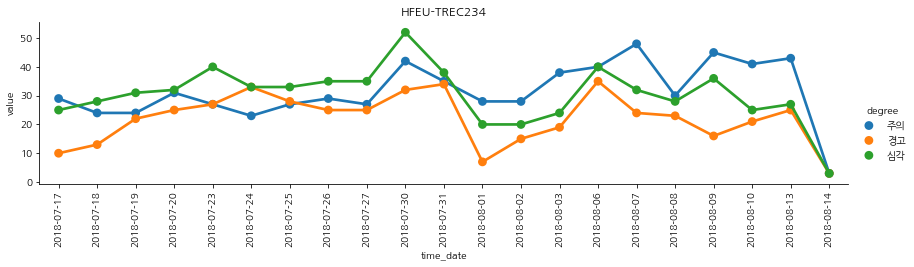

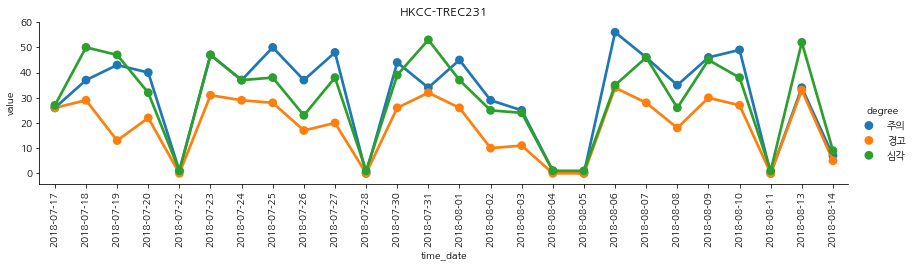

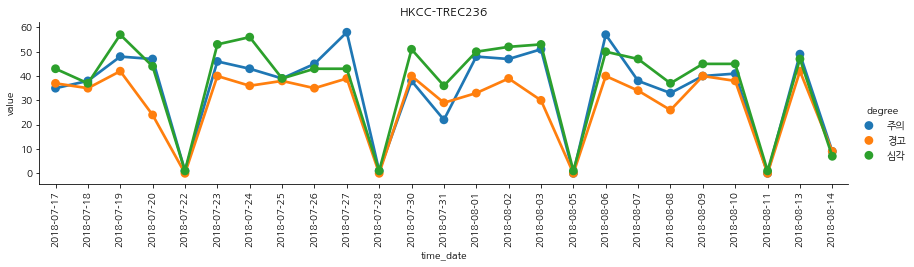

In [460]:
df = data[(data.alarm_name == '디스크 Top I/O 처리율') & (data['system_name'].isin(clusters_new[0]))]
#df = df[df['system_name'] == clusters_new[0][0]]
df = df.groupby(['time_date','degree','system_name'])['ip'].count().reindex().reset_index()
for node in clusters_new[0]:
    df_2 = df[df['system_name'] == node]
    df_2 = df_2.pivot_table(values='ip', index=df.time_date, columns='degree', aggfunc='first',fill_value=0).reset_index()
    display(df_2)
    df_2 = pd.melt(df_2,id_vars=['time_date'],value_vars=['주의','경고','심각'])
    #display(df_2)
    sns.factorplot(data=df_2, x="time_date", y="value",hue='degree',legend_out=True, size=3, aspect=4)
    plt.title(node)
    plt.xticks(rotation='vertical')

> #### 234 서버는 주말 관계없이 알람이 발생하는 하므로 서버 리소스 사용률이 평소에도 높은것으로 추측
> #### 231,236 서버는 주말에 알람이 거의 발생하지 않는 것으로 확인

### 11-2. 클러스터 0번에 속한 노드의 주요 지표 디스크 Top I/O 처리율에 대한 노드별 심각도 알람 건수 추이 출력
> (클러스터 0번이 첫번재 결과라 선택 함) - cluster0 ('HFEU-TREC234', 'HKCC-TREC231', 'HKCC-TREC236')
> 요일별 현황

,time_weekday,degree,value
0,0,주의,152
1,1,주의,138
2,2,주의,109
3,3,주의,126
4,4,주의,137
5,0,경고,119
6,1,경고,104
7,2,경고,71
8,3,경고,78
9,4,경고,90


,time_weekday,degree,value
0,0,주의,181
1,1,주의,150
2,2,주의,167
3,3,주의,155
4,4,주의,162
5,5,주의,1
6,6,주의,1
7,0,경고,124
8,1,경고,120
9,2,경고,101


,time_weekday,degree,value
0,0,주의,190
1,1,주의,147
2,2,주의,158
3,3,주의,180
4,4,주의,197
5,5,주의,1
6,6,주의,1
7,0,경고,162
8,1,경고,145
9,2,경고,132


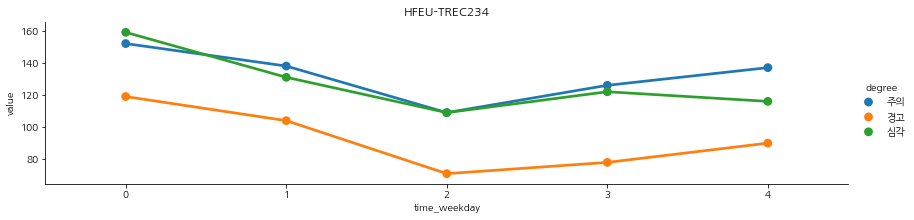

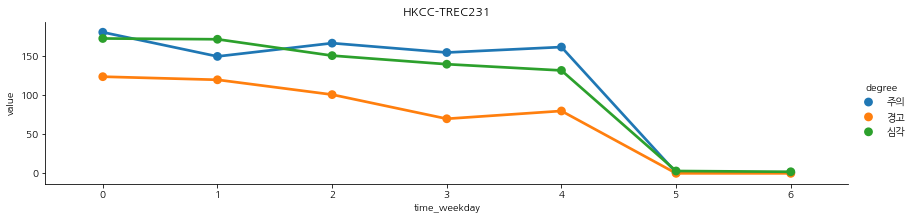

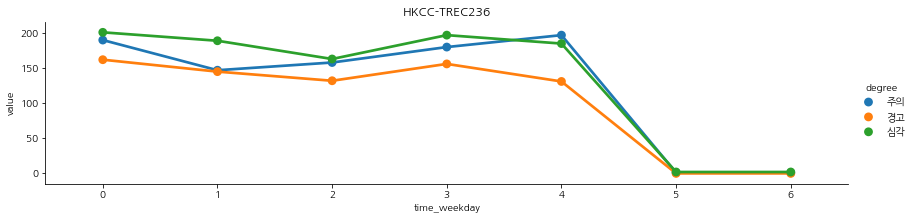

In [461]:
df = data[(data.alarm_name == '디스크 Top I/O 처리율') & (data['system_name'].isin(clusters_new[0]))]
#df = df[df['system_name'] == clusters_new[0][0]]
df = df.groupby(['time_weekday','degree','system_name'])['ip'].count().reindex().reset_index()
for node in clusters_new[0]:
    df_2 = df[df['system_name'] == node]
    df_2 = df_2.pivot_table(values='ip', index=df.time_weekday, columns='degree', aggfunc='first',fill_value=0).reset_index()
    df_2 = pd.melt(df_2,id_vars=['time_weekday'],value_vars=['주의','경고','심각'])
    display(df_2)
    sns.factorplot(data=df_2, x="time_weekday", y="value",hue='degree',legend_out=True, size=3, aspect=4)
    plt.title(node)

> ### 234 서버는 다른 요일에 비해 수요일에 알람이 적게 발생하고
> ### 231, 236 서버는 토요일 일요일에 알람이 거의 발생하지 않음

### 11-3. 클러스터 0번에 속한 노드의 주요 지표 디스크 Top I/O 처리율에 대한 노드별 심각도 알람 건수 추이 출력
> (클러스터 0번이 첫번재 결과라 선택 함) - cluster0 ('HFEU-TREC234', 'HKCC-TREC231', 'HKCC-TREC236')
> 알람 발생 시점의 실제 성능 값

HFEU-TREC234


degree,time_date,경고,심각,주의
0,2018-07-17,97.83,99.73,96.46
1,2018-07-18,98.25,99.62,97.55
2,2018-07-19,98.85,99.31,97.67
3,2018-07-20,98.89,99.40,98.14
4,2018-07-23,98.17,99.35,97.77
5,2018-07-24,98.76,99.35,97.35
6,2018-07-25,98.83,99.35,98.00
7,2018-07-26,98.50,99.22,97.43
8,2018-07-27,98.81,99.30,98.04
9,2018-07-30,98.55,99.59,97.66


HKCC-TREC231


degree,time_date,경고,심각,주의
0,2018-07-17,99.61,99.20,97.44
1,2018-07-18,98.36,99.26,96.81
2,2018-07-19,98.81,99.46,96.03
3,2018-07-20,97.52,99.47,95.91
4,2018-07-22,0.00,100.00,90.50
5,2018-07-23,98.41,99.34,96.70
6,2018-07-24,98.19,99.39,97.26
7,2018-07-25,98.79,99.45,96.09
8,2018-07-26,98.78,99.41,96.63
9,2018-07-27,98.01,99.42,96.87


HKCC-TREC236


degree,time_date,경고,심각,주의
0,2018-07-17,98.26,98.40,98.39
1,2018-07-18,98.45,99.33,97.58
2,2018-07-19,97.95,99.38,96.99
3,2018-07-20,97.40,99.57,95.74
4,2018-07-22,0.00,100.00,91.30
5,2018-07-23,98.46,99.06,97.84
6,2018-07-24,98.35,99.22,96.88
7,2018-07-25,98.68,99.22,98.52
8,2018-07-26,98.17,99.20,98.61
9,2018-07-27,97.92,99.19,97.33


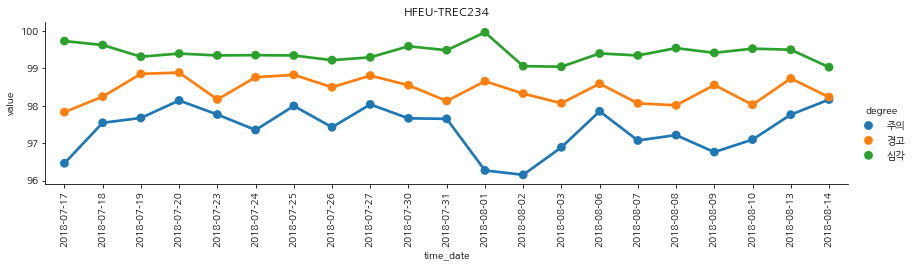

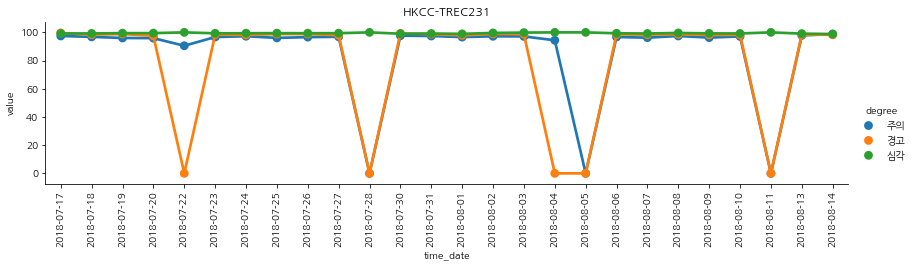

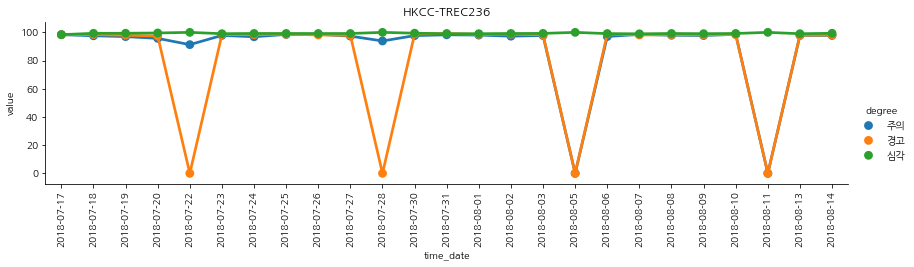

In [453]:
df = data[(data.alarm_name == '디스크 Top I/O 처리율') & (data['system_name'].isin(clusters_new[0]))]
condition  = df.condition.str.split(' ', expand=True)
df['threshold'] = condition[6].astype(float)
df['current'] = condition[3].str.extract('(\d+(?:\.\d+)?)').astype(float)
df = df.groupby(['time_date','system_name','degree'])['current'].mean().reindex().reset_index()
for node in clusters_new[0]:
    print(node)
    df_2 = df[df['system_name'] == node]
    df_2 = df_2.pivot_table(values='current', index=df_2.time_date, columns='degree', aggfunc='first',fill_value=0).reset_index()
    display(df_2)
    df_2 = pd.melt(df_2,id_vars=['time_date'],value_vars=['주의','경고','심각'])
    sns.factorplot(data=df_2, x="time_date", y="value",hue='degree',legend_out=True, size=3, aspect=4)
    plt.title(node)
    plt.xticks(rotation='vertical')

### 일자별로 알람 발생 당시의 성능 값 추이